# Notes

In [ ]:
###### N O T E S #####
## 27.05.2024 ---
# 9632 pictures (3x bc RGB separation = in tar file 28896)
# only png format
#### make sure original id nr in name = new id nr in name// try to load propely with fastai (organize them into labelled folders?)

## 31.05.2024 ---
# merged cell are saved in individual folders
# data loader and fastAI works with resnet
#### make sure test dataset can be used for prediction

## 31.05.2024 ---
# Find the best model (size, speed, learning rate[?])
# Predict a test with couple of pictures

## 02.06.2024 ---
# resnet18 epoch 13 -- 0.65
# resnet50 epoch13 -- confusion matrix is horrible
#### pick other model https://fastai1.fast.ai/vision.models.html and introduce augmentation https://docs.fast.ai/vision.augment.html ? other loss?

## 08.06.2024 ---
# densnet161 is the best so far: 0.831 (with aug=3, epoch=25, lr=default 0.003)
#### use desnet161 peakperformance model - implement cleaner - train second model with clean dataset (same setup) - use for prediction if it is better. - did not work theclean up

## 15.06.2024 ---
# vgg16_bn with epoch 45, aug=3, lr=0.009 reached 0.845
#### try pariwise image similarity for very similar groups to exclude similar ones and make sure model learn most important features.

# best models

In [ ]:
! git clone --depth 1 https://github.com/rwightman/pytorch-image-models.git
%cd pytorch-image-models/results

Cloning into 'pytorch-image-models'...
remote: Enumerating objects: 573, done.
remote: Counting objects: 100% (573/573), done.
remote: Compressing objects: 100% (404/404), done.
remote: Total 573 (delta 224), reused 358 (delta 163), pack-reused 0
Receiving objects: 100% (573/573), 2.52 MiB | 12.49 MiB/s, done.
Resolving deltas: 100% (224/224), done.
/content/pytorch-image-models/results


In [ ]:
import pandas as pd
df_results = pd.read_csv('results-imagenet.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'results-imagenet.csv'

In [ ]:
df_results['model_org'] = df_results['model']
df_results['model'] = df_results['model'].str.split('.').str[0]

In [ ]:
def get_data(part, col):
    df = pd.read_csv(f'benchmark-{part}-amp-nhwc-pt111-cu113-rtx3090.csv').merge(df_results, on='model')
    df['secs'] = 1. / df[col]
    df['family'] = df.model.str.extract('^([a-z]+?(?:v2)?)(?:\d|_|$)')
    df = df[~df.model.str.endswith('gn')]
    df.loc[df.model.str.contains('in22'),'family'] = df.loc[df.model.str.contains('in22'),'family'] + '_in22'
    df.loc[df.model.str.contains('resnet.*d'),'family'] = df.loc[df.model.str.contains('resnet.*d'),'family'] + 'd'
    return df[df.family.str.contains('^re[sg]netd?|beit|convnext|levit|efficient|vit|vgg|swin')]

In [ ]:
df = get_data('infer', 'infer_samples_per_sec')

In [ ]:
import plotly.express as px
w,h = 1000,800

def show_all(df, title, size):
    return px.scatter(df, width=w, height=h, size=df[size]**2, title=title,
        x='secs',  y='top1', log_x=True, color='family', hover_name='model_org', hover_data=[size])

In [ ]:
show_all(df, 'Inference', 'infer_img_size')

# Data preparation

## merging pictures into one

In [1]:
import tarfile

from PIL import Image
import io
import numpy as np

import cv2
import matplotlib.pyplot as plt
import pandas as pd

import os
import shutil


import os
from collections import defaultdict

from google.colab import files

import zipfile
import os


from PIL import Image
import tarfile
import io

import tqdm

In [2]:
def count_images_in_tar(tar_file_path):
    with tarfile.open(tar_file_path) as tar:
        count = sum(1 for member in tar if member.isreg() and member.name.lower().endswith(('.png', '.jpg', '.jpeg')))
    return count

tar_file_path = "/content/images_train.tar"  # ####
print(count_images_in_tar(tar_file_path))


28896


In [3]:
def merge_images_from_tar(tar_file_path):
    merged_images = []
    with tarfile.open(tar_file_path) as tar:
        files = [member for member in tar if member.isreg() and member.name.lower().endswith('.png')]
        files.sort(key=lambda x: x.name)  # Sort the files by name

        for i in range(0, len(files), 3):
            red_file = files[i]
            blue_file = files[i+1]
            yellow_file = files[i+2]

            red_data = tar.extractfile(red_file).read()
            blue_data = tar.extractfile(blue_file).read()
            yellow_data = tar.extractfile(yellow_file).read()

            red_image = Image.open(io.BytesIO(red_data))
            blue_image = Image.open(io.BytesIO(blue_data))
            yellow_image = Image.open(io.BytesIO(yellow_data))

            red_array = np.array(red_image)
            blue_array = np.array(blue_image)
            yellow_array = np.array(yellow_image)

            # Create a 3-dimensional array with shape (64, 64, 3)
            merged_image_array = np.zeros((64, 64, 3), dtype=np.uint8)

            # Assign the red, blue, and yellow channels to the respective dimensions
            merged_image_array[:, :, 0] = red_array
            merged_image_array[:, :, 1] = blue_array
            merged_image_array[:, :, 2] = yellow_array

            merged_image = Image.fromarray(merged_image_array)
            merged_images.append(merged_image)

    return merged_images

In [4]:
tar_file_path = "/content/images_train.tar"
merged_images = merge_images_from_tar(tar_file_path)

In [5]:
len(merged_images)

9632

In [6]:
import matplotlib.pyplot as plt

def visualize_merged_image(merged_images, image_id):
    # Find the index of the image with the given ID
    image_index = image_id - 1  # Assuming the IDs start from 1

    if 0 <= image_index < len(merged_images):
        # Display the merged image
        plt.figure(figsize=(8, 6))
        plt.imshow(merged_images[image_index])
        plt.axis('off')
        plt.title(f'Merged Image ID: {image_id}')
        plt.show()
    else:
        print(f"Image ID {image_id} not found in the merged images list.")



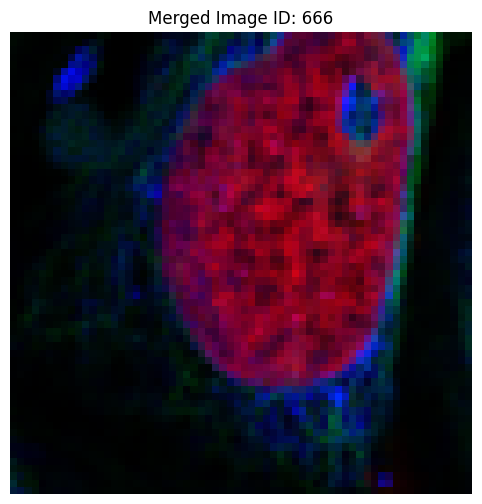

In [7]:
# Example usage
image_id = 666  # Replace with the desired image ID
visualize_merged_image(merged_images, image_id)

## checking label file

In [8]:
y_train = pd.read_csv("/content/y_train.csv")


In [9]:
y_train.head(10)

,file_id,cell_line
0,1,MCF7
1,2,RT4
2,3,U-2 OS
3,4,RT4
4,5,A549
5,6,HEK 293
6,7,RT4
7,8,RT4
8,9,MCF7
9,10,CACO-2


In [10]:

# Sort the counts in descending order
cell_line_counts = y_train['cell_line'].value_counts().sort_values(ascending=False)

# Print the sorted counts
print(cell_line_counts)

cell_line
RT4         2100
CACO-2      1626
HEK 293     1378
MCF7        1082
U-2 OS       775
U-251 MG     768
PC-3         663
HeLa         632
A549         608
Name: count, dtype: int64


In [11]:
# save merged pictures in labelled folder repectively

# Create a directory to save the labeled images
output_dir = 'labeled_images'
os.makedirs(output_dir, exist_ok=True)

# Iterate over the merged images and assign labels
for i, merged_image in enumerate(merged_images):
    # Get the file_id from the index
    file_id = i + 1

    # Find the corresponding cell_line in y_train
    cell_line = y_train.loc[y_train['file_id'] == file_id, 'cell_line'].values[0]

    # Create a subdirectory for the cell_line if it doesn't exist
    cell_line_dir = os.path.join(output_dir, cell_line)
    os.makedirs(cell_line_dir, exist_ok=True)

    # Save the merged image with the file_id as the filename
    output_filename = os.path.join(cell_line_dir, f'{file_id}.png')
    merged_image.save(output_filename)

In [12]:
# double check folder and y_train lenght

# Create a dictionary to store the counts
folder_counts = defaultdict(int)

# Iterate over the subdirectories in labeled_images
for cell_line_dir in os.listdir(output_dir):
    cell_line_path = os.path.join(output_dir, cell_line_dir)
    if os.path.isdir(cell_line_path):
        # Count the number of files in the subdirectory
        folder_counts[cell_line_dir] = len(os.listdir(cell_line_path))

# Compare the counts with y_train
y_train_counts = y_train['cell_line'].value_counts()

for cell_line, count in y_train_counts.items():
    folder_count = folder_counts[cell_line]
    if folder_count != count:
        print(f"Mismatch for cell_line '{cell_line}': {folder_count} images in folder, {count} in y_train")
    else:
        print(f"Cell_line '{cell_line}' has {count} images in both folder and y_train")

Cell_line 'RT4' has 2100 images in both folder and y_train
Cell_line 'CACO-2' has 1626 images in both folder and y_train
Cell_line 'HEK 293' has 1378 images in both folder and y_train
Cell_line 'MCF7' has 1082 images in both folder and y_train
Cell_line 'U-2 OS' has 775 images in both folder and y_train
Cell_line 'U-251 MG' has 768 images in both folder and y_train
Cell_line 'PC-3' has 663 images in both folder and y_train
Cell_line 'HeLa' has 632 images in both folder and y_train
Cell_line 'A549' has 608 images in both folder and y_train


In [ ]:
# creat zip to download -  DONE 31.05.2024 and kept for later in case it is needed

#def zip_folder(folder_path, zip_file_path):
    with zipfile.ZipFile(zip_file_path, mode='w') as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                file_path = os.path.join(root, file)
                zipf.write(file_path)

# Specify the folder path and the desired ZIP file path
#folder_path = 'labeled_images'
#zip_file_path = 'labeled_images.zip'

# Create the ZIP file
#zip_folder(folder_path, zip_file_path)

## Pairwise Image Similarity for U2 OS vs HeLa

In [19]:
import os

root_dir = "/content/labeled_images"
subfolders = [f.path for f in os.scandir(root_dir) if f.is_dir()]

subfolders

['/content/labeled_images/A549',
 '/content/labeled_images/RT4',
 '/content/labeled_images/HEK 293',
 '/content/labeled_images/HeLa',
 '/content/labeled_images/U-251 MG',
 '/content/labeled_images/PC-3',
 '/content/labeled_images/U-2 OS',
 '/content/labeled_images/MCF7',
 '/content/labeled_images/CACO-2']

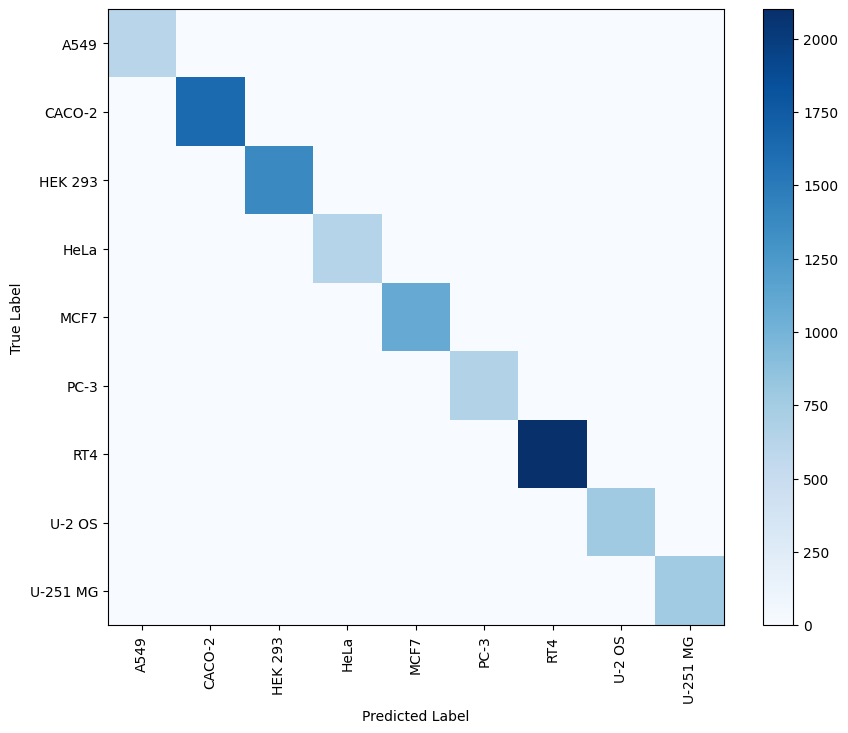

In [24]:
import os
import cv2
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Define the root directory containing subfolders
root_dir = "/content/labeled_images"

# Load and preprocess images from all subfolders
image_data = []
image_labels = []
for folder in os.listdir(root_dir):
    folder_path = os.path.join(root_dir, folder)
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            if file.endswith(".jpg") or file.endswith(".png"):
                file_path = os.path.join(folder_path, file)
                image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
                image_data.append(image.flatten())
                image_labels.append(folder)

# Compute pairwise similarity scores between images
similarity_scores = cosine_similarity(image_data)

# Define a similarity threshold
similarity_threshold = 0.5

# Identify and exclude highly similar image pairs
excluded_indices = []
for i in range(len(similarity_scores)):
    for j in range(i + 1, len(similarity_scores)):
        if similarity_scores[i, j] >= similarity_threshold:
            excluded_indices.append(i)
            excluded_indices.append(j)

# Generate the confusion matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(image_labels, image_labels)
plt.figure(figsize=(10, 8))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
plt.xticks(range(len(set(image_labels))), sorted(set(image_labels)), rotation=90)
plt.yticks(range(len(set(image_labels))), sorted(set(image_labels)))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [22]:
# double check folder and y_train lenght

# Create a dictionary to store the counts
folder_counts = defaultdict(int)

# Iterate over the subdirectories in labeled_images
for cell_line_dir in os.listdir(output_dir):
    cell_line_path = os.path.join(output_dir, cell_line_dir)
    if os.path.isdir(cell_line_path):
        # Count the number of files in the subdirectory
        folder_counts[cell_line_dir] = len(os.listdir(cell_line_path))

# Compare the counts with y_train
y_train_counts = y_train['cell_line'].value_counts()

for cell_line, count in y_train_counts.items():
    folder_count = folder_counts[cell_line]
    if folder_count != count:
        print(f"Mismatch for cell_line '{cell_line}': {folder_count} images in folder, {count} in y_train")
    else:
        print(f"Cell_line '{cell_line}' has {count} images in both folder and y_train")

Cell_line 'RT4' has 2100 images in both folder and y_train
Cell_line 'CACO-2' has 1626 images in both folder and y_train
Cell_line 'HEK 293' has 1378 images in both folder and y_train
Cell_line 'MCF7' has 1082 images in both folder and y_train
Cell_line 'U-2 OS' has 775 images in both folder and y_train
Cell_line 'U-251 MG' has 768 images in both folder and y_train
Cell_line 'PC-3' has 663 images in both folder and y_train
Cell_line 'HeLa' has 632 images in both folder and y_train
Cell_line 'A549' has 608 images in both folder and y_train


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Load your image features
# Assuming you have already extracted features from your images
# and stored them in a list or numpy array
features = [...] # Replace with your actual features

# Get the indices of the two cell lines you want to compare
cell_line_1_indices = [...] # Indices of cell line 1 images
cell_line_2_indices = [...] # Indices of cell line 2 images

# Extract features for the two cell lines
cell_line_1_features = features[cell_line_1_indices]
cell_line_2_features = features[cell_line_2_indices]

# Compute pairwise cosine similarity between the two cell lines
pairwise_sim = cosine_similarity(cell_line_1_features, cell_line_2_features)

# Set a similarity threshold (e.g., 0.9 for highly similar images)
sim_threshold = 0.9

# Find the indices of highly similar image pairs
similar_pairs = np.argwhere(pairwise_sim >= sim_threshold)

# Exclude similar images from your dataset
# For example, you can remove one of the images from each similar pair
images_to_exclude = set()
for i, j in similar_pairs:
    if i not in images_to_exclude:
        images_to_exclude.add(i)
    elif j not in images_to_exclude:
        images_to_exclude.add(j)

# Remove the excluded images from your dataset
filtered_features = np.delete(features, list(images_to_exclude), axis=0)
# You can also remove the corresponding images from your dataset

# start with fastAI

In [25]:
#pi(m)p up environment
!pip install fastai --upgrade -q
!pip install pydicom
!pip install kornia
!pip install fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 46.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 87.4 MB/s eta 0:00:00
  Attempting uninstall: 

In [26]:
#import all needed ones
from fastai.vision.all import *
from fastai.text.all import *
from fastai.collab import *
from fastai.tabular.all import *
from fastai.medical.imaging import *
from fastbook import *
from fastai.vision.widgets import ImageClassifierCleaner


from fastai.metrics import BalancedAccuracy

import pandas as pd
import matplotlib.pyplot as plt

from urllib.request import urlopen
from PIL import Image


In [ ]:
#Check version nr
import fastai; print(fastai.__version__)
import fastcore; print(fastcore.__version__)

2.7.15
1.5.45


In [27]:
#define path to data
path = Path('/content/labeled_images')

In [ ]:
#check corrupt pictures
fns = get_image_files(path)
failed = verify_images(fns)

failed # 0

(#0) []

## model_1 to inspect the data

In [74]:
#create a datablock and prepare dataloaders incuding Augmentation
cells = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.1, seed=42),
    get_y=parent_label,
    batch_tfms=aug_transforms(mult=4)
)

In [75]:
dls = cells.dataloaders(path)

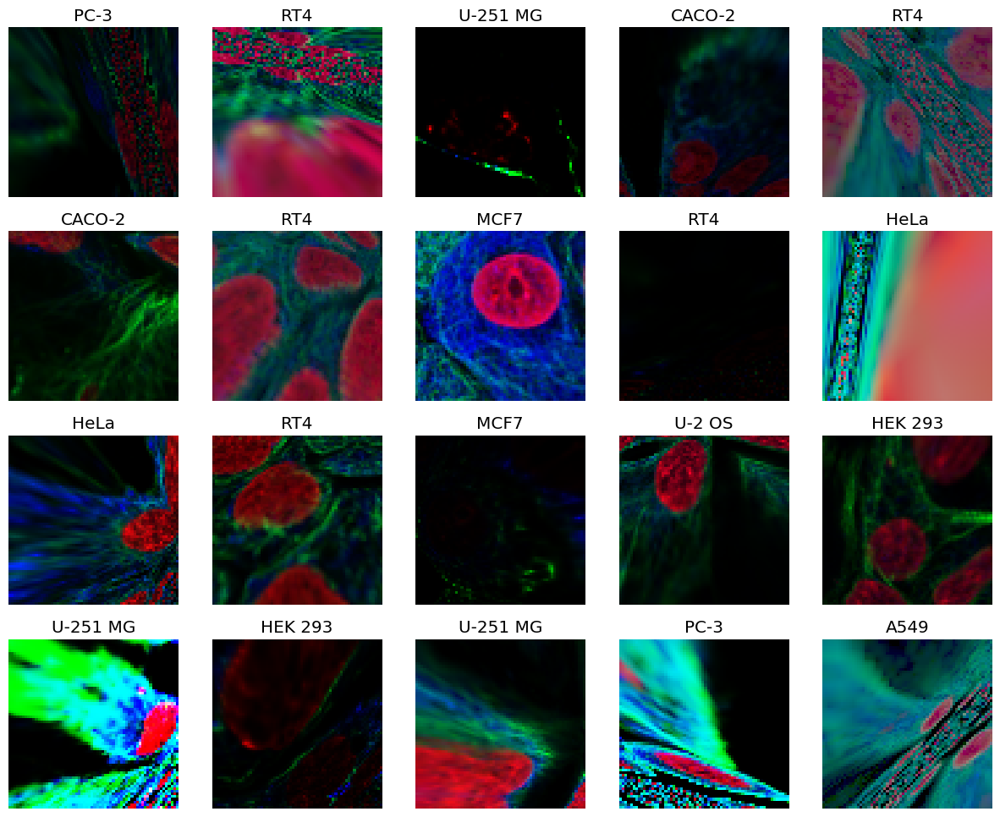

In [76]:

#see some examples out of the dataset
dls.show_batch(max_n=20)

In [77]:
# Set up GPU test it!!!!!!!!!!!!!!!!!!!!!!!!!!!
from fastai.vision.learner import cnn_learner
import torch

# Check if a GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move the data to the GPU
dls.cuda()

Using device: cuda:0


In [80]:
#lerner_1 (reset18)
learn_skin_1 = vision_learner(dls, vgg16_bn, metrics=[error_rate], pretrained=True, lr=0.035) # default lr=0.003
learn_skin_1.fine_tune(105)

epoch,train_loss,valid_loss,error_rate,time
0,2.645820,1.599364,0.558671,00:17


epoch,train_loss,valid_loss,error_rate,time
0,2.226665,1.390462,0.482866,00:19
1,2.002596,1.235350,0.407061,00:18
2,1.884515,1.145062,0.393562,00:18
3,1.793885,1.098511,0.369678,00:19
4,1.682984,1.037609,0.364486,00:19
5,1.605347,1.002339,0.330218,00:19
6,1.560935,0.893876,0.311526,00:19
7,1.465528,0.898925,0.302181,00:19
8,1.401881,0.792800,0.268951,00:19
9,1.380920,0.722680,0.237799,00:20


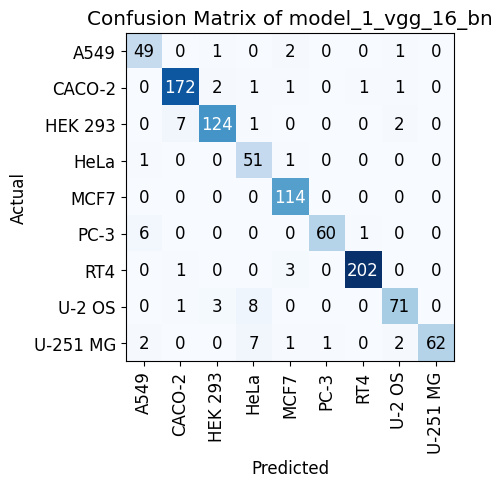

In [81]:
interp_1 = ClassificationInterpretation.from_learner(learn_skin_1)
interp_1.plot_confusion_matrix()
plt.title("Confusion Matrix of model_1_vgg_16_bn")
plt.show()

# Prediction

In [55]:
def count_images_in_tar(tar_file_path):
    with tarfile.open(tar_file_path) as tar:
        count = sum(1 for member in tar if member.isreg() and member.name.lower().endswith(('.png', '.jpg', '.jpeg')))
    return count

tar_file_path = "/content/images_test.tar"  # ####
print(count_images_in_tar(tar_file_path))

20607


In [35]:
tar_file_path_test = "/content/images_test.tar"
merged_images_test = merge_images_from_tar(tar_file_path_test)

In [36]:
len(merged_images_test)

6869

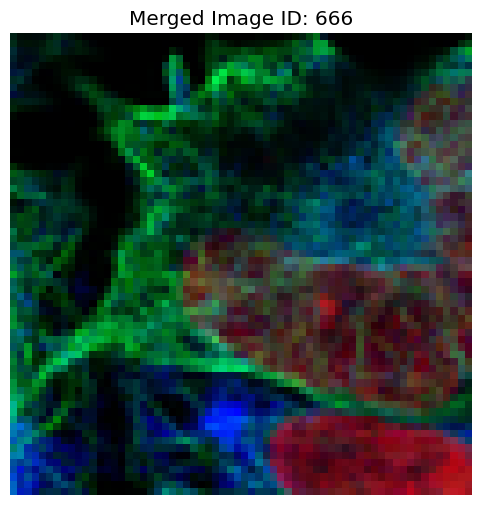

In [37]:
# Example usage
image_id = 666  # Replace with the desired image ID
visualize_merged_image(merged_images_test, image_id)

In [38]:
# Save merged pictures in a single folder
def save_unlabeled_images(merged_images, output_dir="unlabelled_test"):
  """Saves all images in merged_images to a single folder named output_dir."""
  os.makedirs(output_dir, exist_ok=True)  # Create folder if it doesn't exist
  for i, merged_image in enumerate(merged_images):
    # Use index for filename (assuming order doesn't matter)
    filename = f"{i+1}.png"  # Adjust numbering if needed
    output_path = os.path.join(output_dir, filename)
    merged_image.save(output_path)

save_unlabeled_images(merged_images_test)

In [39]:
import os

# Assuming "unlabelled_test" is the created folder
folder_path = "unlabelled_test"

# Get the list of filenames
filenames = os.listdir(folder_path)

# Count the number of items
num_items = len(filenames)

print(f"There are {num_items} items in the '{folder_path}' folder.")


There are 6869 items in the 'unlabelled_test' folder.


In [40]:
import os

def get_filenames_from_folder(folder_path):
  """
  Gets a list of all filenames (full paths) in a folder.
  """
  filenames = []
  for entry in os.scandir(folder_path):
    if entry.is_file():
      filenames.append(os.path.join(folder_path, entry.name))
  return filenames

# Assuming "unlabelled_test" is the created folder
folder_path = "unlabelled_test"

filenames = get_filenames_from_folder(folder_path)

print(filenames)


['unlabelled_test/32.png', 'unlabelled_test/2944.png', 'unlabelled_test/2209.png', 'unlabelled_test/3863.png', 'unlabelled_test/889.png', 'unlabelled_test/5398.png', 'unlabelled_test/3890.png', 'unlabelled_test/3746.png', 'unlabelled_test/6490.png', 'unlabelled_test/5462.png', 'unlabelled_test/1065.png', 'unlabelled_test/5759.png', 'unlabelled_test/3257.png', 'unlabelled_test/3210.png', 'unlabelled_test/264.png', 'unlabelled_test/935.png', 'unlabelled_test/4184.png', 'unlabelled_test/2857.png', 'unlabelled_test/5387.png', 'unlabelled_test/6348.png', 'unlabelled_test/2000.png', 'unlabelled_test/33.png', 'unlabelled_test/4498.png', 'unlabelled_test/1887.png', 'unlabelled_test/4280.png', 'unlabelled_test/1142.png', 'unlabelled_test/2515.png', 'unlabelled_test/3100.png', 'unlabelled_test/921.png', 'unlabelled_test/306.png', 'unlabelled_test/6851.png', 'unlabelled_test/5103.png', 'unlabelled_test/4930.png', 'unlabelled_test/4847.png', 'unlabelled_test/2042.png', 'unlabelled_test/5991.png', 

In [ ]:
len(filenames)

6869

In [82]:
from tqdm import tqdm

def predict_skin_dict(learn, filename):
  img = PILImage.create(filename)
  img_tensor = tensor(img)
  pred = learn_skin_1.predict(img_tensor)
  return {'filename': filename, 'prediction_vg16_bn': pred[0]}

# Collect predictions using tqdm for progress bar
predictions_1 = []
with tqdm(total=len(filenames), desc="Predicting Labels") as pbar:
  for filename in filenames:
    prediction = predict_skin_dict(learn_skin_1, filename)
    predictions_1.append(prediction)
    pbar.update(1)

# Convert list of dictionaries into a dataframe
df_1 = pd.DataFrame(predictions_1)
df_1


Predicting Labels:   0%|          | 0/6869 [00:00<?, ?it/s]

Predicting Labels:   0%|          | 3/6869 [00:00<03:49, 29.95it/s]

Predicting Labels:   0%|          | 7/6869 [00:00<03:32, 32.28it/s]

Predicting Labels:   0%|          | 11/6869 [00:00<03:36, 31.71it/s]

Predicting Labels:   0%|          | 15/6869 [00:00<03:34, 31.99it/s]

Predicting Labels:   0%|          | 19/6869 [00:00<03:38, 31.38it/s]

Predicting Labels:   0%|          | 23/6869 [00:00<03:45, 30.30it/s]

Predicting Labels:   0%|          | 27/6869 [00:00<04:03, 28.05it/s]

Predicting Labels:   0%|          | 30/6869 [00:01<04:10, 27.30it/s]

Predicting Labels:   0%|          | 33/6869 [00:01<04:16, 26.63it/s]

Predicting Labels:   1%|          | 36/6869 [00:01<04:17, 26.54it/s]

Predicting Labels:   1%|          | 39/6869 [00:01<04:24, 25.84it/s]

Predicting Labels:   1%|          | 42/6869 [00:01<04:39, 24.43it/s]

Predicting Labels:   1%|          | 45/6869 [00:01<04:41, 24.28it/s]

Predicting Labels:   1%|          | 48/6869 [00:01<04:35, 24.72it/s]

Predicting Labels:   1%|          | 51/6869 [00:01<04:41, 24.19it/s]

Predicting Labels:   1%|          | 54/6869 [00:02<04:35, 24.74it/s]

Predicting Labels:   1%|          | 57/6869 [00:02<04:28, 25.36it/s]

Predicting Labels:   1%|          | 60/6869 [00:02<04:25, 25.67it/s]

Predicting Labels:   1%|          | 63/6869 [00:02<04:22, 25.93it/s]

Predicting Labels:   1%|          | 66/6869 [00:02<04:16, 26.49it/s]

Predicting Labels:   1%|          | 69/6869 [00:02<04:09, 27.23it/s]

Predicting Labels:   1%|          | 72/6869 [00:02<04:12, 26.96it/s]

Predicting Labels:   1%|          | 75/6869 [00:02<04:16, 26.52it/s]

Predicting Labels:   1%|          | 78/6869 [00:02<04:19, 26.22it/s]

Predicting Labels:   1%|          | 81/6869 [00:03<04:34, 24.71it/s]

Predicting Labels:   1%|          | 84/6869 [00:03<04:30, 25.05it/s]

Predicting Labels:   1%|▏         | 87/6869 [00:03<04:21, 25.97it/s]

Predicting Labels:   1%|▏         | 90/6869 [00:03<04:25, 25.56it/s]

Predicting Labels:   1%|▏         | 93/6869 [00:03<04:21, 25.90it/s]

Predicting Labels:   1%|▏         | 96/6869 [00:03<04:34, 24.67it/s]

Predicting Labels:   1%|▏         | 99/6869 [00:03<04:20, 26.01it/s]

Predicting Labels:   1%|▏         | 102/6869 [00:03<04:16, 26.39it/s]

Predicting Labels:   2%|▏         | 105/6869 [00:03<04:15, 26.48it/s]

Predicting Labels:   2%|▏         | 108/6869 [00:04<04:16, 26.39it/s]

Predicting Labels:   2%|▏         | 111/6869 [00:04<04:10, 27.01it/s]

Predicting Labels:   2%|▏         | 115/6869 [00:04<03:58, 28.35it/s]

Predicting Labels:   2%|▏         | 118/6869 [00:04<03:57, 28.41it/s]

Predicting Labels:   2%|▏         | 121/6869 [00:04<03:54, 28.75it/s]

Predicting Labels:   2%|▏         | 124/6869 [00:04<03:55, 28.59it/s]

Predicting Labels:   2%|▏         | 128/6869 [00:04<03:54, 28.74it/s]

Predicting Labels:   2%|▏         | 131/6869 [00:04<04:06, 27.36it/s]

Predicting Labels:   2%|▏         | 134/6869 [00:04<04:11, 26.75it/s]

Predicting Labels:   2%|▏         | 137/6869 [00:05<04:08, 27.05it/s]

Predicting Labels:   2%|▏         | 140/6869 [00:05<04:03, 27.65it/s]

Predicting Labels:   2%|▏         | 143/6869 [00:05<04:00, 27.94it/s]

Predicting Labels:   2%|▏         | 147/6869 [00:05<03:52, 28.93it/s]

Predicting Labels:   2%|▏         | 151/6869 [00:05<03:51, 28.98it/s]

Predicting Labels:   2%|▏         | 154/6869 [00:05<03:53, 28.79it/s]

Predicting Labels:   2%|▏         | 157/6869 [00:05<04:09, 26.95it/s]

Predicting Labels:   2%|▏         | 160/6869 [00:05<04:22, 25.59it/s]

Predicting Labels:   2%|▏         | 163/6869 [00:06<04:19, 25.86it/s]

Predicting Labels:   2%|▏         | 166/6869 [00:06<04:17, 25.99it/s]

Predicting Labels:   2%|▏         | 169/6869 [00:06<04:32, 24.57it/s]

Predicting Labels:   3%|▎         | 172/6869 [00:06<04:36, 24.26it/s]

Predicting Labels:   3%|▎         | 175/6869 [00:06<04:38, 24.05it/s]

Predicting Labels:   3%|▎         | 178/6869 [00:06<04:34, 24.35it/s]

Predicting Labels:   3%|▎         | 181/6869 [00:06<04:39, 23.93it/s]

Predicting Labels:   3%|▎         | 184/6869 [00:06<04:36, 24.17it/s]

Predicting Labels:   3%|▎         | 187/6869 [00:07<04:47, 23.27it/s]

Predicting Labels:   3%|▎         | 190/6869 [00:07<04:43, 23.57it/s]

Predicting Labels:   3%|▎         | 193/6869 [00:07<04:32, 24.47it/s]

Predicting Labels:   3%|▎         | 197/6869 [00:07<04:12, 26.42it/s]

Predicting Labels:   3%|▎         | 200/6869 [00:07<04:04, 27.25it/s]

Predicting Labels:   3%|▎         | 204/6869 [00:07<03:54, 28.48it/s]

Predicting Labels:   3%|▎         | 208/6869 [00:07<03:50, 28.90it/s]

Predicting Labels:   3%|▎         | 211/6869 [00:07<03:56, 28.17it/s]

Predicting Labels:   3%|▎         | 214/6869 [00:08<04:01, 27.55it/s]

Predicting Labels:   3%|▎         | 217/6869 [00:08<04:00, 27.70it/s]

Predicting Labels:   3%|▎         | 221/6869 [00:08<03:52, 28.65it/s]

Predicting Labels:   3%|▎         | 224/6869 [00:08<04:04, 27.20it/s]

Predicting Labels:   3%|▎         | 228/6869 [00:08<03:53, 28.41it/s]

Predicting Labels:   3%|▎         | 232/6869 [00:08<03:47, 29.13it/s]

Predicting Labels:   3%|▎         | 235/6869 [00:08<03:50, 28.82it/s]

Predicting Labels:   3%|▎         | 238/6869 [00:08<03:49, 28.84it/s]

Predicting Labels:   4%|▎         | 241/6869 [00:08<03:54, 28.28it/s]

Predicting Labels:   4%|▎         | 244/6869 [00:09<03:52, 28.51it/s]

Predicting Labels:   4%|▎         | 248/6869 [00:09<03:45, 29.31it/s]

Predicting Labels:   4%|▎         | 251/6869 [00:09<03:46, 29.20it/s]

Predicting Labels:   4%|▎         | 254/6869 [00:09<03:53, 28.29it/s]

Predicting Labels:   4%|▎         | 257/6869 [00:09<04:05, 26.94it/s]

Predicting Labels:   4%|▍         | 260/6869 [00:09<04:15, 25.89it/s]

Predicting Labels:   4%|▍         | 263/6869 [00:09<04:41, 23.44it/s]

Predicting Labels:   4%|▍         | 266/6869 [00:10<05:13, 21.06it/s]

Predicting Labels:   4%|▍         | 269/6869 [00:10<05:18, 20.72it/s]

Predicting Labels:   4%|▍         | 272/6869 [00:10<05:08, 21.41it/s]

Predicting Labels:   4%|▍         | 275/6869 [00:10<04:51, 22.60it/s]

Predicting Labels:   4%|▍         | 278/6869 [00:10<04:46, 22.99it/s]

Predicting Labels:   4%|▍         | 281/6869 [00:10<04:40, 23.53it/s]

Predicting Labels:   4%|▍         | 284/6869 [00:10<04:34, 24.01it/s]

Predicting Labels:   4%|▍         | 287/6869 [00:10<04:59, 21.96it/s]

Predicting Labels:   4%|▍         | 290/6869 [00:11<05:07, 21.39it/s]

Predicting Labels:   4%|▍         | 293/6869 [00:11<05:10, 21.17it/s]

Predicting Labels:   4%|▍         | 296/6869 [00:11<05:12, 21.00it/s]

Predicting Labels:   4%|▍         | 299/6869 [00:11<05:17, 20.67it/s]

Predicting Labels:   4%|▍         | 302/6869 [00:11<05:21, 20.40it/s]

Predicting Labels:   4%|▍         | 305/6869 [00:11<05:18, 20.61it/s]

Predicting Labels:   4%|▍         | 308/6869 [00:11<05:18, 20.59it/s]

Predicting Labels:   5%|▍         | 311/6869 [00:12<05:25, 20.18it/s]

Predicting Labels:   5%|▍         | 314/6869 [00:12<05:29, 19.87it/s]

Predicting Labels:   5%|▍         | 316/6869 [00:12<05:31, 19.76it/s]

Predicting Labels:   5%|▍         | 318/6869 [00:12<05:36, 19.46it/s]

Predicting Labels:   5%|▍         | 320/6869 [00:12<05:48, 18.78it/s]

Predicting Labels:   5%|▍         | 322/6869 [00:12<05:50, 18.70it/s]

Predicting Labels:   5%|▍         | 324/6869 [00:12<05:53, 18.52it/s]

Predicting Labels:   5%|▍         | 326/6869 [00:12<05:51, 18.60it/s]

Predicting Labels:   5%|▍         | 329/6869 [00:13<05:36, 19.44it/s]

Predicting Labels:   5%|▍         | 332/6869 [00:13<05:29, 19.82it/s]

Predicting Labels:   5%|▍         | 335/6869 [00:13<05:23, 20.18it/s]

Predicting Labels:   5%|▍         | 338/6869 [00:13<05:23, 20.16it/s]

Predicting Labels:   5%|▍         | 341/6869 [00:13<05:16, 20.63it/s]

Predicting Labels:   5%|▌         | 344/6869 [00:13<05:05, 21.36it/s]

Predicting Labels:   5%|▌         | 347/6869 [00:13<05:34, 19.49it/s]

Predicting Labels:   5%|▌         | 349/6869 [00:14<05:38, 19.26it/s]

Predicting Labels:   5%|▌         | 351/6869 [00:14<05:57, 18.26it/s]

Predicting Labels:   5%|▌         | 353/6869 [00:14<06:10, 17.60it/s]

Predicting Labels:   5%|▌         | 355/6869 [00:14<06:02, 17.96it/s]

Predicting Labels:   5%|▌         | 357/6869 [00:14<06:03, 17.93it/s]

Predicting Labels:   5%|▌         | 359/6869 [00:14<06:21, 17.05it/s]

Predicting Labels:   5%|▌         | 361/6869 [00:14<06:05, 17.80it/s]

Predicting Labels:   5%|▌         | 363/6869 [00:14<05:54, 18.33it/s]

Predicting Labels:   5%|▌         | 365/6869 [00:14<05:52, 18.43it/s]

Predicting Labels:   5%|▌         | 367/6869 [00:15<05:55, 18.29it/s]

Predicting Labels:   5%|▌         | 370/6869 [00:15<05:18, 20.40it/s]

Predicting Labels:   5%|▌         | 373/6869 [00:15<05:04, 21.32it/s]

Predicting Labels:   5%|▌         | 376/6869 [00:15<04:49, 22.44it/s]

Predicting Labels:   6%|▌         | 379/6869 [00:15<04:38, 23.34it/s]

Predicting Labels:   6%|▌         | 382/6869 [00:15<04:37, 23.35it/s]

Predicting Labels:   6%|▌         | 385/6869 [00:15<04:30, 24.00it/s]

Predicting Labels:   6%|▌         | 388/6869 [00:15<04:31, 23.90it/s]

Predicting Labels:   6%|▌         | 391/6869 [00:16<04:38, 23.28it/s]

Predicting Labels:   6%|▌         | 394/6869 [00:16<04:54, 22.00it/s]

Predicting Labels:   6%|▌         | 397/6869 [00:16<05:11, 20.77it/s]

Predicting Labels:   6%|▌         | 400/6869 [00:16<05:11, 20.80it/s]

Predicting Labels:   6%|▌         | 403/6869 [00:16<04:59, 21.60it/s]

Predicting Labels:   6%|▌         | 406/6869 [00:16<04:56, 21.80it/s]

Predicting Labels:   6%|▌         | 409/6869 [00:16<05:04, 21.19it/s]

Predicting Labels:   6%|▌         | 412/6869 [00:17<05:04, 21.22it/s]

Predicting Labels:   6%|▌         | 415/6869 [00:17<04:57, 21.70it/s]

Predicting Labels:   6%|▌         | 418/6869 [00:17<05:09, 20.84it/s]

Predicting Labels:   6%|▌         | 421/6869 [00:17<05:08, 20.89it/s]

Predicting Labels:   6%|▌         | 424/6869 [00:17<04:49, 22.28it/s]

Predicting Labels:   6%|▌         | 427/6869 [00:17<04:34, 23.43it/s]

Predicting Labels:   6%|▋         | 430/6869 [00:17<04:24, 24.32it/s]

Predicting Labels:   6%|▋         | 433/6869 [00:18<04:27, 24.07it/s]

Predicting Labels:   6%|▋         | 436/6869 [00:18<04:26, 24.14it/s]

Predicting Labels:   6%|▋         | 439/6869 [00:18<04:19, 24.82it/s]

Predicting Labels:   6%|▋         | 442/6869 [00:18<04:08, 25.91it/s]

Predicting Labels:   6%|▋         | 445/6869 [00:18<04:00, 26.69it/s]

Predicting Labels:   7%|▋         | 448/6869 [00:18<03:56, 27.18it/s]

Predicting Labels:   7%|▋         | 452/6869 [00:18<03:47, 28.25it/s]

Predicting Labels:   7%|▋         | 455/6869 [00:18<03:43, 28.66it/s]

Predicting Labels:   7%|▋         | 458/6869 [00:18<03:41, 28.97it/s]

Predicting Labels:   7%|▋         | 461/6869 [00:19<03:54, 27.36it/s]

Predicting Labels:   7%|▋         | 464/6869 [00:19<04:07, 25.88it/s]

Predicting Labels:   7%|▋         | 467/6869 [00:19<04:31, 23.58it/s]

Predicting Labels:   7%|▋         | 470/6869 [00:19<04:44, 22.51it/s]

Predicting Labels:   7%|▋         | 473/6869 [00:19<04:47, 22.26it/s]

Predicting Labels:   7%|▋         | 476/6869 [00:19<04:42, 22.62it/s]

Predicting Labels:   7%|▋         | 479/6869 [00:19<04:35, 23.22it/s]

Predicting Labels:   7%|▋         | 482/6869 [00:19<04:27, 23.85it/s]

Predicting Labels:   7%|▋         | 485/6869 [00:20<04:32, 23.43it/s]

Predicting Labels:   7%|▋         | 488/6869 [00:20<04:33, 23.29it/s]

Predicting Labels:   7%|▋         | 491/6869 [00:20<04:31, 23.51it/s]

Predicting Labels:   7%|▋         | 494/6869 [00:20<04:21, 24.40it/s]

Predicting Labels:   7%|▋         | 497/6869 [00:20<04:09, 25.56it/s]

Predicting Labels:   7%|▋         | 500/6869 [00:20<04:02, 26.29it/s]

Predicting Labels:   7%|▋         | 503/6869 [00:20<03:56, 26.95it/s]

Predicting Labels:   7%|▋         | 506/6869 [00:20<03:49, 27.68it/s]

Predicting Labels:   7%|▋         | 509/6869 [00:21<04:15, 24.86it/s]

Predicting Labels:   7%|▋         | 512/6869 [00:21<04:43, 22.41it/s]

Predicting Labels:   7%|▋         | 515/6869 [00:21<04:42, 22.46it/s]

Predicting Labels:   8%|▊         | 518/6869 [00:21<04:56, 21.40it/s]

Predicting Labels:   8%|▊         | 521/6869 [00:21<04:49, 21.90it/s]

Predicting Labels:   8%|▊         | 524/6869 [00:21<04:45, 22.22it/s]

Predicting Labels:   8%|▊         | 527/6869 [00:21<04:50, 21.81it/s]

Predicting Labels:   8%|▊         | 530/6869 [00:22<04:46, 22.13it/s]

Predicting Labels:   8%|▊         | 533/6869 [00:22<05:03, 20.90it/s]

Predicting Labels:   8%|▊         | 536/6869 [00:22<04:54, 21.51it/s]

Predicting Labels:   8%|▊         | 539/6869 [00:22<04:40, 22.58it/s]

Predicting Labels:   8%|▊         | 542/6869 [00:22<04:36, 22.87it/s]

Predicting Labels:   8%|▊         | 545/6869 [00:22<04:20, 24.26it/s]

Predicting Labels:   8%|▊         | 548/6869 [00:22<04:23, 24.00it/s]

Predicting Labels:   8%|▊         | 551/6869 [00:22<04:17, 24.50it/s]

Predicting Labels:   8%|▊         | 554/6869 [00:23<04:27, 23.59it/s]

Predicting Labels:   8%|▊         | 557/6869 [00:23<04:42, 22.35it/s]

Predicting Labels:   8%|▊         | 560/6869 [00:23<04:43, 22.24it/s]

Predicting Labels:   8%|▊         | 564/6869 [00:23<04:13, 24.92it/s]

Predicting Labels:   8%|▊         | 567/6869 [00:23<04:08, 25.37it/s]

Predicting Labels:   8%|▊         | 571/6869 [00:23<03:51, 27.17it/s]

Predicting Labels:   8%|▊         | 575/6869 [00:23<03:41, 28.44it/s]

Predicting Labels:   8%|▊         | 578/6869 [00:23<03:38, 28.82it/s]

Predicting Labels:   8%|▊         | 581/6869 [00:24<03:51, 27.18it/s]

Predicting Labels:   9%|▊         | 584/6869 [00:24<04:08, 25.25it/s]

Predicting Labels:   9%|▊         | 587/6869 [00:24<04:08, 25.27it/s]

Predicting Labels:   9%|▊         | 590/6869 [00:24<04:02, 25.94it/s]

Predicting Labels:   9%|▊         | 593/6869 [00:24<03:55, 26.65it/s]

Predicting Labels:   9%|▊         | 596/6869 [00:24<04:00, 26.06it/s]

Predicting Labels:   9%|▊         | 599/6869 [00:24<04:08, 25.24it/s]

Predicting Labels:   9%|▉         | 602/6869 [00:24<04:03, 25.76it/s]

Predicting Labels:   9%|▉         | 605/6869 [00:24<04:05, 25.53it/s]

Predicting Labels:   9%|▉         | 608/6869 [00:25<04:28, 23.31it/s]

Predicting Labels:   9%|▉         | 611/6869 [00:25<04:57, 21.00it/s]

Predicting Labels:   9%|▉         | 614/6869 [00:25<04:57, 21.02it/s]

Predicting Labels:   9%|▉         | 617/6869 [00:25<04:41, 22.21it/s]

Predicting Labels:   9%|▉         | 620/6869 [00:25<04:32, 22.97it/s]

Predicting Labels:   9%|▉         | 623/6869 [00:25<04:25, 23.55it/s]

Predicting Labels:   9%|▉         | 626/6869 [00:25<04:15, 24.46it/s]

Predicting Labels:   9%|▉         | 629/6869 [00:26<04:29, 23.18it/s]

Predicting Labels:   9%|▉         | 632/6869 [00:26<04:48, 21.64it/s]

Predicting Labels:   9%|▉         | 635/6869 [00:26<04:36, 22.51it/s]

Predicting Labels:   9%|▉         | 638/6869 [00:26<04:17, 24.20it/s]

Predicting Labels:   9%|▉         | 641/6869 [00:26<04:12, 24.62it/s]

Predicting Labels:   9%|▉         | 644/6869 [00:26<04:06, 25.23it/s]

Predicting Labels:   9%|▉         | 647/6869 [00:26<04:02, 25.61it/s]

Predicting Labels:   9%|▉         | 650/6869 [00:26<03:58, 26.13it/s]

Predicting Labels:  10%|▉         | 653/6869 [00:27<04:20, 23.90it/s]

Predicting Labels:  10%|▉         | 656/6869 [00:27<04:47, 21.58it/s]

Predicting Labels:  10%|▉         | 659/6869 [00:27<04:35, 22.54it/s]

Predicting Labels:  10%|▉         | 662/6869 [00:27<04:30, 22.91it/s]

Predicting Labels:  10%|▉         | 665/6869 [00:27<04:30, 22.90it/s]

Predicting Labels:  10%|▉         | 668/6869 [00:27<04:24, 23.44it/s]

Predicting Labels:  10%|▉         | 671/6869 [00:27<04:17, 24.04it/s]

Predicting Labels:  10%|▉         | 674/6869 [00:27<04:12, 24.58it/s]

Predicting Labels:  10%|▉         | 677/6869 [00:28<04:49, 21.39it/s]

Predicting Labels:  10%|▉         | 680/6869 [00:28<05:10, 19.95it/s]

Predicting Labels:  10%|▉         | 683/6869 [00:28<05:14, 19.69it/s]

Predicting Labels:  10%|▉         | 686/6869 [00:28<04:54, 21.00it/s]

Predicting Labels:  10%|█         | 689/6869 [00:28<04:43, 21.78it/s]

Predicting Labels:  10%|█         | 692/6869 [00:28<04:31, 22.75it/s]

Predicting Labels:  10%|█         | 695/6869 [00:28<04:20, 23.66it/s]

Predicting Labels:  10%|█         | 698/6869 [00:29<04:37, 22.27it/s]

Predicting Labels:  10%|█         | 701/6869 [00:29<04:50, 21.20it/s]

Predicting Labels:  10%|█         | 704/6869 [00:29<04:34, 22.45it/s]

Predicting Labels:  10%|█         | 708/6869 [00:29<04:16, 24.06it/s]

Predicting Labels:  10%|█         | 711/6869 [00:29<04:02, 25.37it/s]

Predicting Labels:  10%|█         | 714/6869 [00:29<03:58, 25.85it/s]

Predicting Labels:  10%|█         | 717/6869 [00:29<03:57, 25.86it/s]

Predicting Labels:  10%|█         | 720/6869 [00:29<04:09, 24.65it/s]

Predicting Labels:  11%|█         | 723/6869 [00:30<04:44, 21.60it/s]

Predicting Labels:  11%|█         | 726/6869 [00:30<05:04, 20.21it/s]

Predicting Labels:  11%|█         | 729/6869 [00:30<05:23, 18.99it/s]

Predicting Labels:  11%|█         | 731/6869 [00:30<05:26, 18.78it/s]

Predicting Labels:  11%|█         | 733/6869 [00:30<05:32, 18.47it/s]

Predicting Labels:  11%|█         | 735/6869 [00:30<05:26, 18.78it/s]

Predicting Labels:  11%|█         | 738/6869 [00:30<04:59, 20.46it/s]

Predicting Labels:  11%|█         | 741/6869 [00:31<05:08, 19.86it/s]

Predicting Labels:  11%|█         | 744/6869 [00:31<04:38, 22.00it/s]

Predicting Labels:  11%|█         | 747/6869 [00:31<04:22, 23.32it/s]

Predicting Labels:  11%|█         | 750/6869 [00:31<04:17, 23.76it/s]

Predicting Labels:  11%|█         | 753/6869 [00:31<04:09, 24.50it/s]

Predicting Labels:  11%|█         | 756/6869 [00:31<03:57, 25.70it/s]

Predicting Labels:  11%|█         | 759/6869 [00:31<04:03, 25.05it/s]

Predicting Labels:  11%|█         | 762/6869 [00:31<04:08, 24.60it/s]

Predicting Labels:  11%|█         | 765/6869 [00:32<04:14, 24.02it/s]

Predicting Labels:  11%|█         | 768/6869 [00:32<04:31, 22.46it/s]

Predicting Labels:  11%|█         | 771/6869 [00:32<04:42, 21.62it/s]

Predicting Labels:  11%|█▏        | 774/6869 [00:32<04:45, 21.36it/s]

Predicting Labels:  11%|█▏        | 777/6869 [00:32<04:43, 21.49it/s]

Predicting Labels:  11%|█▏        | 780/6869 [00:32<04:35, 22.06it/s]

Predicting Labels:  11%|█▏        | 783/6869 [00:32<04:31, 22.42it/s]

Predicting Labels:  11%|█▏        | 786/6869 [00:33<04:31, 22.38it/s]

Predicting Labels:  11%|█▏        | 789/6869 [00:33<04:16, 23.69it/s]

Predicting Labels:  12%|█▏        | 792/6869 [00:33<04:01, 25.19it/s]

Predicting Labels:  12%|█▏        | 795/6869 [00:33<03:54, 25.85it/s]

Predicting Labels:  12%|█▏        | 798/6869 [00:33<03:45, 26.95it/s]

Predicting Labels:  12%|█▏        | 801/6869 [00:33<03:41, 27.37it/s]

Predicting Labels:  12%|█▏        | 804/6869 [00:33<03:40, 27.50it/s]

Predicting Labels:  12%|█▏        | 807/6869 [00:33<03:39, 27.61it/s]

Predicting Labels:  12%|█▏        | 810/6869 [00:33<03:37, 27.89it/s]

Predicting Labels:  12%|█▏        | 813/6869 [00:34<03:55, 25.70it/s]

Predicting Labels:  12%|█▏        | 816/6869 [00:34<04:09, 24.22it/s]

Predicting Labels:  12%|█▏        | 819/6869 [00:34<04:36, 21.90it/s]

Predicting Labels:  12%|█▏        | 822/6869 [00:34<04:48, 20.99it/s]

Predicting Labels:  12%|█▏        | 825/6869 [00:34<04:55, 20.47it/s]

Predicting Labels:  12%|█▏        | 828/6869 [00:34<04:48, 20.97it/s]

Predicting Labels:  12%|█▏        | 831/6869 [00:34<04:44, 21.24it/s]

Predicting Labels:  12%|█▏        | 834/6869 [00:35<04:37, 21.75it/s]

Predicting Labels:  12%|█▏        | 837/6869 [00:35<04:25, 22.69it/s]

Predicting Labels:  12%|█▏        | 840/6869 [00:35<04:15, 23.59it/s]

Predicting Labels:  12%|█▏        | 843/6869 [00:35<03:59, 25.11it/s]

Predicting Labels:  12%|█▏        | 846/6869 [00:35<03:49, 26.28it/s]

Predicting Labels:  12%|█▏        | 849/6869 [00:35<03:43, 26.90it/s]

Predicting Labels:  12%|█▏        | 852/6869 [00:35<03:38, 27.57it/s]

Predicting Labels:  12%|█▏        | 855/6869 [00:35<03:34, 28.03it/s]

Predicting Labels:  12%|█▏        | 858/6869 [00:35<03:30, 28.52it/s]

Predicting Labels:  13%|█▎        | 861/6869 [00:36<03:34, 27.97it/s]

Predicting Labels:  13%|█▎        | 864/6869 [00:36<04:10, 24.00it/s]

Predicting Labels:  13%|█▎        | 867/6869 [00:36<04:18, 23.23it/s]

Predicting Labels:  13%|█▎        | 870/6869 [00:36<04:26, 22.53it/s]

Predicting Labels:  13%|█▎        | 873/6869 [00:36<04:31, 22.10it/s]

Predicting Labels:  13%|█▎        | 876/6869 [00:36<04:26, 22.47it/s]

Predicting Labels:  13%|█▎        | 879/6869 [00:36<04:10, 23.88it/s]

Predicting Labels:  13%|█▎        | 882/6869 [00:36<04:05, 24.39it/s]

Predicting Labels:  13%|█▎        | 885/6869 [00:37<04:19, 23.06it/s]

Predicting Labels:  13%|█▎        | 888/6869 [00:37<04:22, 22.82it/s]

Predicting Labels:  13%|█▎        | 891/6869 [00:37<04:21, 22.83it/s]

Predicting Labels:  13%|█▎        | 894/6869 [00:37<04:15, 23.41it/s]

Predicting Labels:  13%|█▎        | 897/6869 [00:37<04:08, 24.07it/s]

Predicting Labels:  13%|█▎        | 900/6869 [00:37<03:59, 24.96it/s]

Predicting Labels:  13%|█▎        | 903/6869 [00:37<03:54, 25.43it/s]

Predicting Labels:  13%|█▎        | 906/6869 [00:37<03:54, 25.47it/s]

Predicting Labels:  13%|█▎        | 909/6869 [00:38<04:21, 22.83it/s]

Predicting Labels:  13%|█▎        | 912/6869 [00:38<04:36, 21.52it/s]

Predicting Labels:  13%|█▎        | 915/6869 [00:38<04:44, 20.95it/s]

Predicting Labels:  13%|█▎        | 918/6869 [00:38<04:45, 20.81it/s]

Predicting Labels:  13%|█▎        | 921/6869 [00:38<04:26, 22.30it/s]

Predicting Labels:  13%|█▎        | 924/6869 [00:38<04:06, 24.14it/s]

Predicting Labels:  13%|█▎        | 927/6869 [00:38<04:11, 23.60it/s]

Predicting Labels:  14%|█▎        | 930/6869 [00:39<04:25, 22.33it/s]

Predicting Labels:  14%|█▎        | 933/6869 [00:39<04:37, 21.36it/s]

Predicting Labels:  14%|█▎        | 936/6869 [00:39<04:46, 20.68it/s]

Predicting Labels:  14%|█▎        | 939/6869 [00:39<04:27, 22.17it/s]

Predicting Labels:  14%|█▎        | 942/6869 [00:39<04:16, 23.14it/s]

Predicting Labels:  14%|█▍        | 945/6869 [00:39<04:01, 24.52it/s]

Predicting Labels:  14%|█▍        | 948/6869 [00:39<04:06, 24.03it/s]

Predicting Labels:  14%|█▍        | 951/6869 [00:39<04:01, 24.51it/s]

Predicting Labels:  14%|█▍        | 954/6869 [00:40<04:27, 22.15it/s]

Predicting Labels:  14%|█▍        | 957/6869 [00:40<04:55, 19.98it/s]

Predicting Labels:  14%|█▍        | 960/6869 [00:40<04:51, 20.29it/s]

Predicting Labels:  14%|█▍        | 963/6869 [00:40<04:25, 22.23it/s]

Predicting Labels:  14%|█▍        | 966/6869 [00:40<04:05, 24.02it/s]

Predicting Labels:  14%|█▍        | 969/6869 [00:40<04:09, 23.61it/s]

Predicting Labels:  14%|█▍        | 972/6869 [00:40<04:11, 23.48it/s]

Predicting Labels:  14%|█▍        | 975/6869 [00:41<04:32, 21.63it/s]

Predicting Labels:  14%|█▍        | 978/6869 [00:41<04:52, 20.16it/s]

Predicting Labels:  14%|█▍        | 981/6869 [00:41<04:32, 21.64it/s]

Predicting Labels:  14%|█▍        | 984/6869 [00:41<04:17, 22.85it/s]

Predicting Labels:  14%|█▍        | 987/6869 [00:41<04:02, 24.21it/s]

Predicting Labels:  14%|█▍        | 991/6869 [00:41<03:42, 26.43it/s]

Predicting Labels:  14%|█▍        | 995/6869 [00:41<03:32, 27.71it/s]

Predicting Labels:  15%|█▍        | 999/6869 [00:41<03:24, 28.70it/s]

Predicting Labels:  15%|█▍        | 1002/6869 [00:42<03:46, 25.86it/s]

Predicting Labels:  15%|█▍        | 1005/6869 [00:42<04:26, 22.01it/s]

Predicting Labels:  15%|█▍        | 1008/6869 [00:42<04:20, 22.47it/s]

Predicting Labels:  15%|█▍        | 1011/6869 [00:42<04:15, 22.95it/s]

Predicting Labels:  15%|█▍        | 1015/6869 [00:42<03:53, 25.07it/s]

Predicting Labels:  15%|█▍        | 1018/6869 [00:42<03:56, 24.70it/s]

Predicting Labels:  15%|█▍        | 1021/6869 [00:42<04:05, 23.81it/s]

Predicting Labels:  15%|█▍        | 1024/6869 [00:43<04:36, 21.14it/s]

Predicting Labels:  15%|█▍        | 1027/6869 [00:43<04:58, 19.56it/s]

Predicting Labels:  15%|█▍        | 1030/6869 [00:43<04:40, 20.84it/s]

Predicting Labels:  15%|█▌        | 1033/6869 [00:43<04:40, 20.84it/s]

Predicting Labels:  15%|█▌        | 1036/6869 [00:43<04:26, 21.88it/s]

Predicting Labels:  15%|█▌        | 1039/6869 [00:43<04:07, 23.59it/s]

Predicting Labels:  15%|█▌        | 1042/6869 [00:43<03:59, 24.30it/s]

Predicting Labels:  15%|█▌        | 1045/6869 [00:44<04:33, 21.29it/s]

Predicting Labels:  15%|█▌        | 1048/6869 [00:44<05:00, 19.35it/s]

Predicting Labels:  15%|█▌        | 1051/6869 [00:44<04:34, 21.21it/s]

Predicting Labels:  15%|█▌        | 1054/6869 [00:44<04:14, 22.82it/s]

Predicting Labels:  15%|█▌        | 1057/6869 [00:44<04:04, 23.81it/s]

Predicting Labels:  15%|█▌        | 1060/6869 [00:44<03:51, 25.05it/s]

Predicting Labels:  15%|█▌        | 1063/6869 [00:44<03:40, 26.34it/s]

Predicting Labels:  16%|█▌        | 1066/6869 [00:44<03:36, 26.86it/s]

Predicting Labels:  16%|█▌        | 1069/6869 [00:45<04:16, 22.60it/s]

Predicting Labels:  16%|█▌        | 1072/6869 [00:45<04:40, 20.63it/s]

Predicting Labels:  16%|█▌        | 1075/6869 [00:45<04:23, 22.00it/s]

Predicting Labels:  16%|█▌        | 1078/6869 [00:45<04:24, 21.91it/s]

Predicting Labels:  16%|█▌        | 1081/6869 [00:45<04:19, 22.27it/s]

Predicting Labels:  16%|█▌        | 1084/6869 [00:45<04:13, 22.84it/s]

Predicting Labels:  16%|█▌        | 1087/6869 [00:45<04:00, 24.08it/s]

Predicting Labels:  16%|█▌        | 1090/6869 [00:46<04:16, 22.51it/s]

Predicting Labels:  16%|█▌        | 1093/6869 [00:46<04:37, 20.82it/s]

Predicting Labels:  16%|█▌        | 1096/6869 [00:46<04:49, 19.96it/s]

Predicting Labels:  16%|█▌        | 1099/6869 [00:46<04:38, 20.71it/s]

Predicting Labels:  16%|█▌        | 1102/6869 [00:46<04:29, 21.40it/s]

Predicting Labels:  16%|█▌        | 1105/6869 [00:46<04:27, 21.54it/s]

Predicting Labels:  16%|█▌        | 1108/6869 [00:46<04:24, 21.75it/s]

Predicting Labels:  16%|█▌        | 1111/6869 [00:47<04:37, 20.78it/s]

Predicting Labels:  16%|█▌        | 1114/6869 [00:47<04:59, 19.22it/s]

Predicting Labels:  16%|█▌        | 1116/6869 [00:47<04:59, 19.18it/s]

Predicting Labels:  16%|█▋        | 1119/6869 [00:47<04:32, 21.06it/s]

Predicting Labels:  16%|█▋        | 1122/6869 [00:47<04:20, 22.06it/s]

Predicting Labels:  16%|█▋        | 1125/6869 [00:47<04:14, 22.59it/s]

Predicting Labels:  16%|█▋        | 1128/6869 [00:47<04:10, 22.93it/s]

Predicting Labels:  16%|█▋        | 1131/6869 [00:48<04:25, 21.59it/s]

Predicting Labels:  17%|█▋        | 1134/6869 [00:48<04:46, 20.05it/s]

Predicting Labels:  17%|█▋        | 1137/6869 [00:48<04:58, 19.23it/s]

Predicting Labels:  17%|█▋        | 1139/6869 [00:48<05:07, 18.62it/s]

Predicting Labels:  17%|█▋        | 1142/6869 [00:48<04:49, 19.79it/s]

Predicting Labels:  17%|█▋        | 1145/6869 [00:48<04:27, 21.40it/s]

Predicting Labels:  17%|█▋        | 1148/6869 [00:48<04:17, 22.24it/s]

Predicting Labels:  17%|█▋        | 1151/6869 [00:48<04:11, 22.77it/s]

Predicting Labels:  17%|█▋        | 1154/6869 [00:49<04:24, 21.57it/s]

Predicting Labels:  17%|█▋        | 1157/6869 [00:49<04:35, 20.72it/s]

Predicting Labels:  17%|█▋        | 1160/6869 [00:49<04:47, 19.83it/s]

Predicting Labels:  17%|█▋        | 1163/6869 [00:49<04:46, 19.92it/s]

Predicting Labels:  17%|█▋        | 1166/6869 [00:49<04:24, 21.54it/s]

Predicting Labels:  17%|█▋        | 1169/6869 [00:49<04:08, 22.96it/s]

Predicting Labels:  17%|█▋        | 1172/6869 [00:49<04:02, 23.53it/s]

Predicting Labels:  17%|█▋        | 1175/6869 [00:50<04:21, 21.78it/s]

Predicting Labels:  17%|█▋        | 1178/6869 [00:50<04:17, 22.07it/s]

Predicting Labels:  17%|█▋        | 1181/6869 [00:50<04:07, 23.02it/s]

Predicting Labels:  17%|█▋        | 1184/6869 [00:50<04:03, 23.34it/s]

Predicting Labels:  17%|█▋        | 1187/6869 [00:50<03:55, 24.09it/s]

Predicting Labels:  17%|█▋        | 1190/6869 [00:50<03:56, 23.98it/s]

Predicting Labels:  17%|█▋        | 1193/6869 [00:50<03:50, 24.59it/s]

Predicting Labels:  17%|█▋        | 1196/6869 [00:50<03:59, 23.70it/s]

Predicting Labels:  17%|█▋        | 1199/6869 [00:51<04:18, 21.92it/s]

Predicting Labels:  17%|█▋        | 1202/6869 [00:51<04:35, 20.60it/s]

Predicting Labels:  18%|█▊        | 1205/6869 [00:51<04:28, 21.09it/s]

Predicting Labels:  18%|█▊        | 1208/6869 [00:51<04:14, 22.27it/s]

Predicting Labels:  18%|█▊        | 1211/6869 [00:51<04:05, 23.08it/s]

Predicting Labels:  18%|█▊        | 1214/6869 [00:51<03:55, 23.97it/s]

Predicting Labels:  18%|█▊        | 1217/6869 [00:51<03:48, 24.70it/s]

Predicting Labels:  18%|█▊        | 1220/6869 [00:52<04:09, 22.60it/s]

Predicting Labels:  18%|█▊        | 1223/6869 [00:52<04:28, 21.06it/s]

Predicting Labels:  18%|█▊        | 1226/6869 [00:52<04:27, 21.07it/s]

Predicting Labels:  18%|█▊        | 1229/6869 [00:52<04:22, 21.45it/s]

Predicting Labels:  18%|█▊        | 1232/6869 [00:52<04:17, 21.93it/s]

Predicting Labels:  18%|█▊        | 1235/6869 [00:52<04:05, 22.92it/s]

Predicting Labels:  18%|█▊        | 1238/6869 [00:52<03:52, 24.26it/s]

Predicting Labels:  18%|█▊        | 1241/6869 [00:53<03:57, 23.71it/s]

Predicting Labels:  18%|█▊        | 1244/6869 [00:53<03:50, 24.40it/s]

Predicting Labels:  18%|█▊        | 1247/6869 [00:53<03:44, 25.02it/s]

Predicting Labels:  18%|█▊        | 1250/6869 [00:53<03:46, 24.86it/s]

Predicting Labels:  18%|█▊        | 1253/6869 [00:53<03:34, 26.18it/s]

Predicting Labels:  18%|█▊        | 1256/6869 [00:53<03:30, 26.62it/s]

Predicting Labels:  18%|█▊        | 1259/6869 [00:53<03:30, 26.69it/s]

Predicting Labels:  18%|█▊        | 1262/6869 [00:53<03:24, 27.37it/s]

Predicting Labels:  18%|█▊        | 1265/6869 [00:53<03:23, 27.49it/s]

Predicting Labels:  18%|█▊        | 1268/6869 [00:54<03:32, 26.40it/s]

Predicting Labels:  19%|█▊        | 1271/6869 [00:54<03:33, 26.20it/s]

Predicting Labels:  19%|█▊        | 1274/6869 [00:54<03:39, 25.55it/s]

Predicting Labels:  19%|█▊        | 1277/6869 [00:54<03:45, 24.83it/s]

Predicting Labels:  19%|█▊        | 1280/6869 [00:54<03:38, 25.62it/s]

Predicting Labels:  19%|█▊        | 1283/6869 [00:54<03:35, 25.87it/s]

Predicting Labels:  19%|█▊        | 1286/6869 [00:54<03:28, 26.84it/s]

Predicting Labels:  19%|█▉        | 1289/6869 [00:54<03:24, 27.31it/s]

Predicting Labels:  19%|█▉        | 1292/6869 [00:54<03:27, 26.93it/s]

Predicting Labels:  19%|█▉        | 1295/6869 [00:55<03:29, 26.63it/s]

Predicting Labels:  19%|█▉        | 1298/6869 [00:55<03:36, 25.71it/s]

Predicting Labels:  19%|█▉        | 1301/6869 [00:55<03:34, 26.01it/s]

Predicting Labels:  19%|█▉        | 1304/6869 [00:55<03:34, 26.00it/s]

Predicting Labels:  19%|█▉        | 1307/6869 [00:55<03:33, 26.04it/s]

Predicting Labels:  19%|█▉        | 1310/6869 [00:55<03:29, 26.52it/s]

Predicting Labels:  19%|█▉        | 1313/6869 [00:55<03:24, 27.21it/s]

Predicting Labels:  19%|█▉        | 1316/6869 [00:55<03:30, 26.37it/s]

Predicting Labels:  19%|█▉        | 1319/6869 [00:55<03:29, 26.47it/s]

Predicting Labels:  19%|█▉        | 1322/6869 [00:56<03:36, 25.65it/s]

Predicting Labels:  19%|█▉        | 1325/6869 [00:56<03:35, 25.70it/s]

Predicting Labels:  19%|█▉        | 1328/6869 [00:56<03:31, 26.24it/s]

Predicting Labels:  19%|█▉        | 1331/6869 [00:56<03:31, 26.18it/s]

Predicting Labels:  19%|█▉        | 1334/6869 [00:56<03:32, 26.03it/s]

Predicting Labels:  19%|█▉        | 1337/6869 [00:56<03:27, 26.66it/s]

Predicting Labels:  20%|█▉        | 1340/6869 [00:56<03:20, 27.56it/s]

Predicting Labels:  20%|█▉        | 1343/6869 [00:56<03:17, 27.92it/s]

Predicting Labels:  20%|█▉        | 1346/6869 [00:56<03:26, 26.75it/s]

Predicting Labels:  20%|█▉        | 1349/6869 [00:57<03:31, 26.06it/s]

Predicting Labels:  20%|█▉        | 1352/6869 [00:57<03:34, 25.68it/s]

Predicting Labels:  20%|█▉        | 1355/6869 [00:57<03:30, 26.24it/s]

Predicting Labels:  20%|█▉        | 1358/6869 [00:57<03:33, 25.77it/s]

Predicting Labels:  20%|█▉        | 1361/6869 [00:57<03:36, 25.43it/s]

Predicting Labels:  20%|█▉        | 1364/6869 [00:57<03:28, 26.40it/s]

Predicting Labels:  20%|█▉        | 1367/6869 [00:57<03:22, 27.20it/s]

Predicting Labels:  20%|█▉        | 1370/6869 [00:57<03:17, 27.89it/s]

Predicting Labels:  20%|█▉        | 1373/6869 [00:57<03:19, 27.52it/s]

Predicting Labels:  20%|██        | 1376/6869 [00:58<03:21, 27.29it/s]

Predicting Labels:  20%|██        | 1379/6869 [00:58<03:26, 26.57it/s]

Predicting Labels:  20%|██        | 1382/6869 [00:58<03:24, 26.84it/s]

Predicting Labels:  20%|██        | 1385/6869 [00:58<03:37, 25.20it/s]

Predicting Labels:  20%|██        | 1388/6869 [00:58<03:37, 25.18it/s]

Predicting Labels:  20%|██        | 1391/6869 [00:58<03:46, 24.17it/s]

Predicting Labels:  20%|██        | 1394/6869 [00:58<03:51, 23.62it/s]

Predicting Labels:  20%|██        | 1397/6869 [00:58<04:02, 22.59it/s]

Predicting Labels:  20%|██        | 1400/6869 [00:59<04:03, 22.49it/s]

Predicting Labels:  20%|██        | 1403/6869 [00:59<04:00, 22.74it/s]

Predicting Labels:  20%|██        | 1406/6869 [00:59<03:59, 22.82it/s]

Predicting Labels:  21%|██        | 1409/6869 [00:59<03:47, 24.04it/s]

Predicting Labels:  21%|██        | 1412/6869 [00:59<03:50, 23.66it/s]

Predicting Labels:  21%|██        | 1415/6869 [00:59<03:50, 23.71it/s]

Predicting Labels:  21%|██        | 1418/6869 [00:59<03:53, 23.38it/s]

Predicting Labels:  21%|██        | 1421/6869 [00:59<03:37, 25.01it/s]

Predicting Labels:  21%|██        | 1424/6869 [01:00<03:31, 25.75it/s]

Predicting Labels:  21%|██        | 1427/6869 [01:00<03:46, 24.05it/s]

Predicting Labels:  21%|██        | 1430/6869 [01:00<03:55, 23.12it/s]

Predicting Labels:  21%|██        | 1433/6869 [01:00<03:47, 23.90it/s]

Predicting Labels:  21%|██        | 1436/6869 [01:00<03:51, 23.51it/s]

Predicting Labels:  21%|██        | 1439/6869 [01:00<03:43, 24.27it/s]

Predicting Labels:  21%|██        | 1442/6869 [01:00<03:52, 23.36it/s]

Predicting Labels:  21%|██        | 1445/6869 [01:01<03:44, 24.12it/s]

Predicting Labels:  21%|██        | 1448/6869 [01:01<03:46, 23.97it/s]

Predicting Labels:  21%|██        | 1451/6869 [01:01<04:12, 21.44it/s]

Predicting Labels:  21%|██        | 1454/6869 [01:01<04:04, 22.12it/s]

Predicting Labels:  21%|██        | 1457/6869 [01:01<04:02, 22.34it/s]

Predicting Labels:  21%|██▏       | 1460/6869 [01:01<04:04, 22.13it/s]

Predicting Labels:  21%|██▏       | 1463/6869 [01:01<04:02, 22.26it/s]

Predicting Labels:  21%|██▏       | 1466/6869 [01:01<03:53, 23.16it/s]

Predicting Labels:  21%|██▏       | 1469/6869 [01:02<04:02, 22.28it/s]

Predicting Labels:  21%|██▏       | 1472/6869 [01:02<04:14, 21.23it/s]

Predicting Labels:  21%|██▏       | 1475/6869 [01:02<04:26, 20.24it/s]

Predicting Labels:  22%|██▏       | 1478/6869 [01:02<04:37, 19.41it/s]

Predicting Labels:  22%|██▏       | 1481/6869 [01:02<04:14, 21.16it/s]

Predicting Labels:  22%|██▏       | 1484/6869 [01:02<03:55, 22.85it/s]

Predicting Labels:  22%|██▏       | 1487/6869 [01:02<03:49, 23.42it/s]

Predicting Labels:  22%|██▏       | 1490/6869 [01:03<03:51, 23.21it/s]

Predicting Labels:  22%|██▏       | 1493/6869 [01:03<03:39, 24.46it/s]

Predicting Labels:  22%|██▏       | 1496/6869 [01:03<03:46, 23.75it/s]

Predicting Labels:  22%|██▏       | 1499/6869 [01:03<03:32, 25.26it/s]

Predicting Labels:  22%|██▏       | 1502/6869 [01:03<03:31, 25.38it/s]

Predicting Labels:  22%|██▏       | 1505/6869 [01:03<03:26, 25.93it/s]

Predicting Labels:  22%|██▏       | 1508/6869 [01:03<03:22, 26.47it/s]

Predicting Labels:  22%|██▏       | 1511/6869 [01:03<03:18, 26.96it/s]

Predicting Labels:  22%|██▏       | 1514/6869 [01:03<03:20, 26.69it/s]

Predicting Labels:  22%|██▏       | 1517/6869 [01:04<03:27, 25.78it/s]

Predicting Labels:  22%|██▏       | 1520/6869 [01:04<03:41, 24.16it/s]

Predicting Labels:  22%|██▏       | 1523/6869 [01:04<03:46, 23.60it/s]

Predicting Labels:  22%|██▏       | 1526/6869 [01:04<03:39, 24.37it/s]

Predicting Labels:  22%|██▏       | 1529/6869 [01:04<03:30, 25.33it/s]

Predicting Labels:  22%|██▏       | 1532/6869 [01:04<03:23, 26.28it/s]

Predicting Labels:  22%|██▏       | 1535/6869 [01:04<03:23, 26.22it/s]

Predicting Labels:  22%|██▏       | 1538/6869 [01:04<03:27, 25.70it/s]

Predicting Labels:  22%|██▏       | 1541/6869 [01:05<03:34, 24.88it/s]

Predicting Labels:  22%|██▏       | 1544/6869 [01:05<03:35, 24.70it/s]

Predicting Labels:  23%|██▎       | 1547/6869 [01:05<03:32, 24.99it/s]

Predicting Labels:  23%|██▎       | 1550/6869 [01:05<03:35, 24.69it/s]

Predicting Labels:  23%|██▎       | 1553/6869 [01:05<03:29, 25.36it/s]

Predicting Labels:  23%|██▎       | 1556/6869 [01:05<03:31, 25.09it/s]

Predicting Labels:  23%|██▎       | 1559/6869 [01:05<03:24, 25.99it/s]

Predicting Labels:  23%|██▎       | 1562/6869 [01:05<03:38, 24.32it/s]

Predicting Labels:  23%|██▎       | 1565/6869 [01:06<03:52, 22.78it/s]

Predicting Labels:  23%|██▎       | 1568/6869 [01:06<04:19, 20.40it/s]

Predicting Labels:  23%|██▎       | 1571/6869 [01:06<04:40, 18.87it/s]

Predicting Labels:  23%|██▎       | 1573/6869 [01:06<04:39, 18.92it/s]

Predicting Labels:  23%|██▎       | 1576/6869 [01:06<04:27, 19.81it/s]

Predicting Labels:  23%|██▎       | 1579/6869 [01:06<04:21, 20.26it/s]

Predicting Labels:  23%|██▎       | 1582/6869 [01:06<04:07, 21.34it/s]

Predicting Labels:  23%|██▎       | 1585/6869 [01:07<04:07, 21.31it/s]

Predicting Labels:  23%|██▎       | 1588/6869 [01:07<04:14, 20.72it/s]

Predicting Labels:  23%|██▎       | 1591/6869 [01:07<04:04, 21.61it/s]

Predicting Labels:  23%|██▎       | 1594/6869 [01:07<03:50, 22.89it/s]

Predicting Labels:  23%|██▎       | 1597/6869 [01:07<03:38, 24.11it/s]

Predicting Labels:  23%|██▎       | 1600/6869 [01:07<03:41, 23.80it/s]

Predicting Labels:  23%|██▎       | 1603/6869 [01:07<03:31, 24.87it/s]

Predicting Labels:  23%|██▎       | 1606/6869 [01:07<03:25, 25.56it/s]

Predicting Labels:  23%|██▎       | 1609/6869 [01:08<03:30, 24.97it/s]

Predicting Labels:  23%|██▎       | 1612/6869 [01:08<03:36, 24.31it/s]

Predicting Labels:  24%|██▎       | 1615/6869 [01:08<03:57, 22.08it/s]

Predicting Labels:  24%|██▎       | 1618/6869 [01:08<04:36, 19.02it/s]

Predicting Labels:  24%|██▎       | 1621/6869 [01:08<04:41, 18.64it/s]

Predicting Labels:  24%|██▎       | 1624/6869 [01:08<04:29, 19.45it/s]

Predicting Labels:  24%|██▎       | 1627/6869 [01:08<04:17, 20.32it/s]

Predicting Labels:  24%|██▎       | 1630/6869 [01:09<04:12, 20.76it/s]

Predicting Labels:  24%|██▍       | 1633/6869 [01:09<04:07, 21.19it/s]

Predicting Labels:  24%|██▍       | 1636/6869 [01:09<04:05, 21.36it/s]

Predicting Labels:  24%|██▍       | 1639/6869 [01:09<03:54, 22.32it/s]

Predicting Labels:  24%|██▍       | 1642/6869 [01:09<03:43, 23.42it/s]

Predicting Labels:  24%|██▍       | 1645/6869 [01:09<03:34, 24.37it/s]

Predicting Labels:  24%|██▍       | 1648/6869 [01:09<03:36, 24.11it/s]

Predicting Labels:  24%|██▍       | 1651/6869 [01:09<03:37, 24.03it/s]

Predicting Labels:  24%|██▍       | 1654/6869 [01:10<03:35, 24.24it/s]

Predicting Labels:  24%|██▍       | 1657/6869 [01:10<03:38, 23.87it/s]

Predicting Labels:  24%|██▍       | 1660/6869 [01:10<03:31, 24.67it/s]

Predicting Labels:  24%|██▍       | 1663/6869 [01:10<03:39, 23.77it/s]

Predicting Labels:  24%|██▍       | 1666/6869 [01:10<03:37, 23.92it/s]

Predicting Labels:  24%|██▍       | 1669/6869 [01:10<03:32, 24.51it/s]

Predicting Labels:  24%|██▍       | 1672/6869 [01:10<03:33, 24.39it/s]

Predicting Labels:  24%|██▍       | 1675/6869 [01:10<03:26, 25.13it/s]

Predicting Labels:  24%|██▍       | 1678/6869 [01:11<03:25, 25.24it/s]

Predicting Labels:  24%|██▍       | 1681/6869 [01:11<03:20, 25.88it/s]

Predicting Labels:  25%|██▍       | 1684/6869 [01:11<03:19, 25.97it/s]

Predicting Labels:  25%|██▍       | 1687/6869 [01:11<03:22, 25.61it/s]

Predicting Labels:  25%|██▍       | 1690/6869 [01:11<03:27, 24.97it/s]

Predicting Labels:  25%|██▍       | 1693/6869 [01:11<03:25, 25.24it/s]

Predicting Labels:  25%|██▍       | 1696/6869 [01:11<03:17, 26.23it/s]

Predicting Labels:  25%|██▍       | 1699/6869 [01:11<03:11, 27.00it/s]

Predicting Labels:  25%|██▍       | 1702/6869 [01:11<03:12, 26.83it/s]

Predicting Labels:  25%|██▍       | 1705/6869 [01:12<03:18, 26.05it/s]

Predicting Labels:  25%|██▍       | 1708/6869 [01:12<03:28, 24.73it/s]

Predicting Labels:  25%|██▍       | 1711/6869 [01:12<03:25, 25.13it/s]

Predicting Labels:  25%|██▍       | 1714/6869 [01:12<03:21, 25.60it/s]

Predicting Labels:  25%|██▍       | 1717/6869 [01:12<03:33, 24.13it/s]

Predicting Labels:  25%|██▌       | 1720/6869 [01:12<03:29, 24.55it/s]

Predicting Labels:  25%|██▌       | 1723/6869 [01:12<03:28, 24.68it/s]

Predicting Labels:  25%|██▌       | 1726/6869 [01:12<03:31, 24.34it/s]

Predicting Labels:  25%|██▌       | 1729/6869 [01:13<03:49, 22.43it/s]

Predicting Labels:  25%|██▌       | 1732/6869 [01:13<03:39, 23.38it/s]

Predicting Labels:  25%|██▌       | 1735/6869 [01:13<03:32, 24.12it/s]

Predicting Labels:  25%|██▌       | 1738/6869 [01:13<03:24, 25.15it/s]

Predicting Labels:  25%|██▌       | 1741/6869 [01:13<03:17, 25.93it/s]

Predicting Labels:  25%|██▌       | 1744/6869 [01:13<03:17, 25.89it/s]

Predicting Labels:  25%|██▌       | 1747/6869 [01:13<03:12, 26.62it/s]

Predicting Labels:  25%|██▌       | 1750/6869 [01:13<03:09, 27.03it/s]

Predicting Labels:  26%|██▌       | 1753/6869 [01:14<03:16, 26.06it/s]

Predicting Labels:  26%|██▌       | 1756/6869 [01:14<03:26, 24.79it/s]

Predicting Labels:  26%|██▌       | 1759/6869 [01:14<03:22, 25.29it/s]

Predicting Labels:  26%|██▌       | 1762/6869 [01:14<03:44, 22.76it/s]

Predicting Labels:  26%|██▌       | 1765/6869 [01:14<03:43, 22.83it/s]

Predicting Labels:  26%|██▌       | 1768/6869 [01:14<03:33, 23.86it/s]

Predicting Labels:  26%|██▌       | 1771/6869 [01:14<03:26, 24.72it/s]

Predicting Labels:  26%|██▌       | 1774/6869 [01:14<03:18, 25.61it/s]

Predicting Labels:  26%|██▌       | 1777/6869 [01:15<03:25, 24.72it/s]

Predicting Labels:  26%|██▌       | 1780/6869 [01:15<03:34, 23.72it/s]

Predicting Labels:  26%|██▌       | 1783/6869 [01:15<03:44, 22.62it/s]

Predicting Labels:  26%|██▌       | 1786/6869 [01:15<03:33, 23.79it/s]

Predicting Labels:  26%|██▌       | 1789/6869 [01:15<03:26, 24.65it/s]

Predicting Labels:  26%|██▌       | 1792/6869 [01:15<03:17, 25.72it/s]

Predicting Labels:  26%|██▌       | 1795/6869 [01:15<03:19, 25.49it/s]

Predicting Labels:  26%|██▌       | 1798/6869 [01:15<03:17, 25.72it/s]

Predicting Labels:  26%|██▌       | 1801/6869 [01:16<03:36, 23.41it/s]

Predicting Labels:  26%|██▋       | 1804/6869 [01:16<03:59, 21.13it/s]

Predicting Labels:  26%|██▋       | 1807/6869 [01:16<03:55, 21.51it/s]

Predicting Labels:  26%|██▋       | 1810/6869 [01:16<03:51, 21.89it/s]

Predicting Labels:  26%|██▋       | 1813/6869 [01:16<03:35, 23.43it/s]

Predicting Labels:  26%|██▋       | 1816/6869 [01:16<03:24, 24.69it/s]

Predicting Labels:  26%|██▋       | 1819/6869 [01:16<03:21, 25.02it/s]

Predicting Labels:  27%|██▋       | 1822/6869 [01:16<03:13, 26.04it/s]

Predicting Labels:  27%|██▋       | 1825/6869 [01:17<03:22, 24.85it/s]

Predicting Labels:  27%|██▋       | 1828/6869 [01:17<03:46, 22.29it/s]

Predicting Labels:  27%|██▋       | 1831/6869 [01:17<03:53, 21.60it/s]

Predicting Labels:  27%|██▋       | 1834/6869 [01:17<04:00, 20.97it/s]

Predicting Labels:  27%|██▋       | 1837/6869 [01:17<04:03, 20.65it/s]

Predicting Labels:  27%|██▋       | 1840/6869 [01:17<04:09, 20.12it/s]

Predicting Labels:  27%|██▋       | 1843/6869 [01:18<04:20, 19.32it/s]

Predicting Labels:  27%|██▋       | 1846/6869 [01:18<04:06, 20.36it/s]

Predicting Labels:  27%|██▋       | 1849/6869 [01:18<03:49, 21.83it/s]

Predicting Labels:  27%|██▋       | 1852/6869 [01:18<03:33, 23.47it/s]

Predicting Labels:  27%|██▋       | 1855/6869 [01:18<03:20, 25.01it/s]

Predicting Labels:  27%|██▋       | 1858/6869 [01:18<03:11, 26.11it/s]

Predicting Labels:  27%|██▋       | 1861/6869 [01:18<03:05, 26.93it/s]

Predicting Labels:  27%|██▋       | 1864/6869 [01:18<03:00, 27.72it/s]

Predicting Labels:  27%|██▋       | 1867/6869 [01:18<03:05, 26.90it/s]

Predicting Labels:  27%|██▋       | 1870/6869 [01:19<03:22, 24.71it/s]

Predicting Labels:  27%|██▋       | 1873/6869 [01:19<03:48, 21.83it/s]

Predicting Labels:  27%|██▋       | 1876/6869 [01:19<03:54, 21.30it/s]

Predicting Labels:  27%|██▋       | 1879/6869 [01:19<03:38, 22.81it/s]

Predicting Labels:  27%|██▋       | 1882/6869 [01:19<03:28, 23.96it/s]

Predicting Labels:  27%|██▋       | 1886/6869 [01:19<03:11, 26.02it/s]

Predicting Labels:  28%|██▊       | 1890/6869 [01:19<03:00, 27.53it/s]

Predicting Labels:  28%|██▊       | 1893/6869 [01:19<02:59, 27.78it/s]

Predicting Labels:  28%|██▊       | 1896/6869 [01:20<03:26, 24.03it/s]

Predicting Labels:  28%|██▊       | 1899/6869 [01:20<03:43, 22.21it/s]

Predicting Labels:  28%|██▊       | 1902/6869 [01:20<03:44, 22.13it/s]

Predicting Labels:  28%|██▊       | 1905/6869 [01:20<03:31, 23.43it/s]

Predicting Labels:  28%|██▊       | 1908/6869 [01:20<03:22, 24.50it/s]

Predicting Labels:  28%|██▊       | 1911/6869 [01:20<03:15, 25.42it/s]

Predicting Labels:  28%|██▊       | 1914/6869 [01:20<03:17, 25.09it/s]

Predicting Labels:  28%|██▊       | 1917/6869 [01:20<03:26, 23.95it/s]

Predicting Labels:  28%|██▊       | 1920/6869 [01:21<03:43, 22.11it/s]

Predicting Labels:  28%|██▊       | 1923/6869 [01:21<03:48, 21.63it/s]

Predicting Labels:  28%|██▊       | 1926/6869 [01:21<03:55, 21.01it/s]

Predicting Labels:  28%|██▊       | 1929/6869 [01:21<04:00, 20.53it/s]

Predicting Labels:  28%|██▊       | 1932/6869 [01:21<03:57, 20.78it/s]

Predicting Labels:  28%|██▊       | 1935/6869 [01:21<03:54, 21.01it/s]

Predicting Labels:  28%|██▊       | 1938/6869 [01:22<04:07, 19.95it/s]

Predicting Labels:  28%|██▊       | 1941/6869 [01:22<03:51, 21.27it/s]

Predicting Labels:  28%|██▊       | 1944/6869 [01:22<03:42, 22.11it/s]

Predicting Labels:  28%|██▊       | 1947/6869 [01:22<03:27, 23.73it/s]

Predicting Labels:  28%|██▊       | 1950/6869 [01:22<03:15, 25.16it/s]

Predicting Labels:  28%|██▊       | 1953/6869 [01:22<03:07, 26.23it/s]

Predicting Labels:  28%|██▊       | 1956/6869 [01:22<03:00, 27.23it/s]

Predicting Labels:  29%|██▊       | 1959/6869 [01:22<03:03, 26.76it/s]

Predicting Labels:  29%|██▊       | 1962/6869 [01:22<02:58, 27.45it/s]

Predicting Labels:  29%|██▊       | 1965/6869 [01:23<03:11, 25.61it/s]

Predicting Labels:  29%|██▊       | 1968/6869 [01:23<03:41, 22.11it/s]

Predicting Labels:  29%|██▊       | 1971/6869 [01:23<03:52, 21.03it/s]

Predicting Labels:  29%|██▊       | 1974/6869 [01:23<03:59, 20.40it/s]

Predicting Labels:  29%|██▉       | 1977/6869 [01:23<03:39, 22.32it/s]

Predicting Labels:  29%|██▉       | 1980/6869 [01:23<03:32, 22.97it/s]

Predicting Labels:  29%|██▉       | 1983/6869 [01:23<03:21, 24.24it/s]

Predicting Labels:  29%|██▉       | 1986/6869 [01:24<03:27, 23.48it/s]

Predicting Labels:  29%|██▉       | 1989/6869 [01:24<03:54, 20.83it/s]

Predicting Labels:  29%|██▉       | 1992/6869 [01:24<04:05, 19.88it/s]

Predicting Labels:  29%|██▉       | 1995/6869 [01:24<03:55, 20.73it/s]

Predicting Labels:  29%|██▉       | 1998/6869 [01:24<03:37, 22.39it/s]

Predicting Labels:  29%|██▉       | 2001/6869 [01:24<03:29, 23.19it/s]

Predicting Labels:  29%|██▉       | 2004/6869 [01:24<03:24, 23.81it/s]

Predicting Labels:  29%|██▉       | 2007/6869 [01:24<03:13, 25.15it/s]

Predicting Labels:  29%|██▉       | 2010/6869 [01:25<03:37, 22.35it/s]

Predicting Labels:  29%|██▉       | 2013/6869 [01:25<04:06, 19.69it/s]

Predicting Labels:  29%|██▉       | 2016/6869 [01:25<04:00, 20.18it/s]

Predicting Labels:  29%|██▉       | 2019/6869 [01:25<03:46, 21.46it/s]

Predicting Labels:  29%|██▉       | 2022/6869 [01:25<03:35, 22.54it/s]

Predicting Labels:  29%|██▉       | 2025/6869 [01:25<03:21, 23.98it/s]

Predicting Labels:  30%|██▉       | 2028/6869 [01:25<03:10, 25.35it/s]

Predicting Labels:  30%|██▉       | 2031/6869 [01:26<03:16, 24.61it/s]

Predicting Labels:  30%|██▉       | 2034/6869 [01:26<03:48, 21.13it/s]

Predicting Labels:  30%|██▉       | 2037/6869 [01:26<03:58, 20.24it/s]

Predicting Labels:  30%|██▉       | 2040/6869 [01:26<03:57, 20.36it/s]

Predicting Labels:  30%|██▉       | 2043/6869 [01:26<03:40, 21.84it/s]

Predicting Labels:  30%|██▉       | 2046/6869 [01:26<03:25, 23.49it/s]

Predicting Labels:  30%|██▉       | 2049/6869 [01:26<03:14, 24.79it/s]

Predicting Labels:  30%|██▉       | 2052/6869 [01:26<03:06, 25.82it/s]

Predicting Labels:  30%|██▉       | 2055/6869 [01:27<03:29, 23.03it/s]

Predicting Labels:  30%|██▉       | 2058/6869 [01:27<03:49, 20.99it/s]

Predicting Labels:  30%|███       | 2061/6869 [01:27<03:54, 20.50it/s]

Predicting Labels:  30%|███       | 2064/6869 [01:27<03:40, 21.83it/s]

Predicting Labels:  30%|███       | 2067/6869 [01:27<03:31, 22.75it/s]

Predicting Labels:  30%|███       | 2070/6869 [01:27<03:18, 24.17it/s]

Predicting Labels:  30%|███       | 2073/6869 [01:27<03:10, 25.24it/s]

Predicting Labels:  30%|███       | 2076/6869 [01:28<03:04, 25.91it/s]

Predicting Labels:  30%|███       | 2079/6869 [01:28<03:28, 22.98it/s]

Predicting Labels:  30%|███       | 2082/6869 [01:28<03:41, 21.63it/s]

Predicting Labels:  30%|███       | 2085/6869 [01:28<03:44, 21.27it/s]

Predicting Labels:  30%|███       | 2088/6869 [01:28<03:40, 21.65it/s]

Predicting Labels:  30%|███       | 2091/6869 [01:28<03:29, 22.83it/s]

Predicting Labels:  30%|███       | 2094/6869 [01:28<03:14, 24.54it/s]

Predicting Labels:  31%|███       | 2097/6869 [01:28<03:04, 25.92it/s]

Predicting Labels:  31%|███       | 2100/6869 [01:29<03:07, 25.39it/s]

Predicting Labels:  31%|███       | 2103/6869 [01:29<03:18, 23.99it/s]

Predicting Labels:  31%|███       | 2106/6869 [01:29<03:13, 24.58it/s]

Predicting Labels:  31%|███       | 2109/6869 [01:29<03:08, 25.24it/s]

Predicting Labels:  31%|███       | 2112/6869 [01:29<03:00, 26.31it/s]

Predicting Labels:  31%|███       | 2115/6869 [01:29<02:54, 27.24it/s]

Predicting Labels:  31%|███       | 2118/6869 [01:29<02:53, 27.36it/s]

Predicting Labels:  31%|███       | 2121/6869 [01:29<02:50, 27.82it/s]

Predicting Labels:  31%|███       | 2124/6869 [01:29<02:48, 28.21it/s]

Predicting Labels:  31%|███       | 2127/6869 [01:30<02:52, 27.44it/s]

Predicting Labels:  31%|███       | 2130/6869 [01:30<03:15, 24.29it/s]

Predicting Labels:  31%|███       | 2133/6869 [01:30<03:20, 23.63it/s]

Predicting Labels:  31%|███       | 2136/6869 [01:30<03:30, 22.46it/s]

Predicting Labels:  31%|███       | 2139/6869 [01:30<03:38, 21.68it/s]

Predicting Labels:  31%|███       | 2142/6869 [01:30<03:41, 21.34it/s]

Predicting Labels:  31%|███       | 2145/6869 [01:30<03:27, 22.72it/s]

Predicting Labels:  31%|███▏      | 2148/6869 [01:31<03:35, 21.92it/s]

Predicting Labels:  31%|███▏      | 2151/6869 [01:31<03:26, 22.90it/s]

Predicting Labels:  31%|███▏      | 2154/6869 [01:31<03:30, 22.40it/s]

Predicting Labels:  31%|███▏      | 2157/6869 [01:31<03:22, 23.26it/s]

Predicting Labels:  31%|███▏      | 2160/6869 [01:31<03:11, 24.57it/s]

Predicting Labels:  31%|███▏      | 2163/6869 [01:31<03:12, 24.48it/s]

Predicting Labels:  32%|███▏      | 2166/6869 [01:31<03:05, 25.30it/s]

Predicting Labels:  32%|███▏      | 2169/6869 [01:31<03:12, 24.43it/s]

Predicting Labels:  32%|███▏      | 2172/6869 [01:32<03:13, 24.22it/s]

Predicting Labels:  32%|███▏      | 2175/6869 [01:32<03:11, 24.52it/s]

Predicting Labels:  32%|███▏      | 2178/6869 [01:32<03:27, 22.63it/s]

Predicting Labels:  32%|███▏      | 2181/6869 [01:32<03:31, 22.12it/s]

Predicting Labels:  32%|███▏      | 2184/6869 [01:32<03:32, 22.04it/s]

Predicting Labels:  32%|███▏      | 2187/6869 [01:32<03:34, 21.83it/s]

Predicting Labels:  32%|███▏      | 2190/6869 [01:32<03:26, 22.65it/s]

Predicting Labels:  32%|███▏      | 2193/6869 [01:32<03:23, 22.99it/s]

Predicting Labels:  32%|███▏      | 2196/6869 [01:33<03:33, 21.91it/s]

Predicting Labels:  32%|███▏      | 2199/6869 [01:33<03:37, 21.48it/s]

Predicting Labels:  32%|███▏      | 2202/6869 [01:33<03:23, 22.97it/s]

Predicting Labels:  32%|███▏      | 2205/6869 [01:33<03:09, 24.64it/s]

Predicting Labels:  32%|███▏      | 2208/6869 [01:33<03:00, 25.85it/s]

Predicting Labels:  32%|███▏      | 2211/6869 [01:33<02:53, 26.85it/s]

Predicting Labels:  32%|███▏      | 2215/6869 [01:33<02:45, 28.04it/s]

Predicting Labels:  32%|███▏      | 2218/6869 [01:33<02:47, 27.71it/s]

Predicting Labels:  32%|███▏      | 2221/6869 [01:34<02:55, 26.53it/s]

Predicting Labels:  32%|███▏      | 2224/6869 [01:34<03:09, 24.51it/s]

Predicting Labels:  32%|███▏      | 2227/6869 [01:34<03:20, 23.12it/s]

Predicting Labels:  32%|███▏      | 2230/6869 [01:34<03:31, 21.98it/s]

Predicting Labels:  33%|███▎      | 2233/6869 [01:34<03:38, 21.24it/s]

Predicting Labels:  33%|███▎      | 2236/6869 [01:34<03:38, 21.21it/s]

Predicting Labels:  33%|███▎      | 2239/6869 [01:34<03:31, 21.89it/s]

Predicting Labels:  33%|███▎      | 2242/6869 [01:35<03:27, 22.26it/s]

Predicting Labels:  33%|███▎      | 2245/6869 [01:35<03:16, 23.56it/s]

Predicting Labels:  33%|███▎      | 2248/6869 [01:35<03:06, 24.83it/s]

Predicting Labels:  33%|███▎      | 2251/6869 [01:35<02:58, 25.88it/s]

Predicting Labels:  33%|███▎      | 2254/6869 [01:35<02:51, 26.94it/s]

Predicting Labels:  33%|███▎      | 2257/6869 [01:35<02:47, 27.58it/s]

Predicting Labels:  33%|███▎      | 2261/6869 [01:35<02:41, 28.46it/s]

Predicting Labels:  33%|███▎      | 2264/6869 [01:35<02:40, 28.72it/s]

Predicting Labels:  33%|███▎      | 2267/6869 [01:35<02:40, 28.74it/s]

Predicting Labels:  33%|███▎      | 2270/6869 [01:36<02:48, 27.37it/s]

Predicting Labels:  33%|███▎      | 2273/6869 [01:36<03:00, 25.42it/s]

Predicting Labels:  33%|███▎      | 2276/6869 [01:36<03:03, 24.97it/s]

Predicting Labels:  33%|███▎      | 2279/6869 [01:36<03:07, 24.52it/s]

Predicting Labels:  33%|███▎      | 2282/6869 [01:36<03:13, 23.71it/s]

Predicting Labels:  33%|███▎      | 2285/6869 [01:36<03:23, 22.48it/s]

Predicting Labels:  33%|███▎      | 2288/6869 [01:36<03:20, 22.89it/s]

Predicting Labels:  33%|███▎      | 2291/6869 [01:36<03:12, 23.73it/s]

Predicting Labels:  33%|███▎      | 2294/6869 [01:37<03:09, 24.16it/s]

Predicting Labels:  33%|███▎      | 2297/6869 [01:37<03:12, 23.73it/s]

Predicting Labels:  33%|███▎      | 2300/6869 [01:37<03:09, 24.12it/s]

Predicting Labels:  34%|███▎      | 2303/6869 [01:37<03:02, 25.03it/s]

Predicting Labels:  34%|███▎      | 2306/6869 [01:37<02:56, 25.79it/s]

Predicting Labels:  34%|███▎      | 2309/6869 [01:37<02:54, 26.11it/s]

Predicting Labels:  34%|███▎      | 2312/6869 [01:37<02:49, 26.87it/s]

Predicting Labels:  34%|███▎      | 2316/6869 [01:37<02:45, 27.57it/s]

Predicting Labels:  34%|███▍      | 2319/6869 [01:38<02:50, 26.66it/s]

Predicting Labels:  34%|███▍      | 2322/6869 [01:38<03:07, 24.21it/s]

Predicting Labels:  34%|███▍      | 2325/6869 [01:38<03:23, 22.31it/s]

Predicting Labels:  34%|███▍      | 2328/6869 [01:38<03:22, 22.46it/s]

Predicting Labels:  34%|███▍      | 2331/6869 [01:38<03:25, 22.13it/s]

Predicting Labels:  34%|███▍      | 2334/6869 [01:38<03:25, 22.08it/s]

Predicting Labels:  34%|███▍      | 2337/6869 [01:38<03:30, 21.51it/s]

Predicting Labels:  34%|███▍      | 2340/6869 [01:39<03:31, 21.36it/s]

Predicting Labels:  34%|███▍      | 2343/6869 [01:39<03:22, 22.33it/s]

Predicting Labels:  34%|███▍      | 2346/6869 [01:39<03:16, 22.97it/s]

Predicting Labels:  34%|███▍      | 2349/6869 [01:39<03:14, 23.22it/s]

Predicting Labels:  34%|███▍      | 2352/6869 [01:39<03:09, 23.85it/s]

Predicting Labels:  34%|███▍      | 2355/6869 [01:39<03:17, 22.90it/s]

Predicting Labels:  34%|███▍      | 2359/6869 [01:39<03:03, 24.61it/s]

Predicting Labels:  34%|███▍      | 2362/6869 [01:39<03:06, 24.12it/s]

Predicting Labels:  34%|███▍      | 2365/6869 [01:40<03:21, 22.34it/s]

Predicting Labels:  34%|███▍      | 2368/6869 [01:40<03:42, 20.26it/s]

Predicting Labels:  35%|███▍      | 2371/6869 [01:40<03:51, 19.42it/s]

Predicting Labels:  35%|███▍      | 2374/6869 [01:40<03:47, 19.79it/s]

Predicting Labels:  35%|███▍      | 2377/6869 [01:40<03:31, 21.26it/s]

Predicting Labels:  35%|███▍      | 2380/6869 [01:40<03:14, 23.06it/s]

Predicting Labels:  35%|███▍      | 2383/6869 [01:40<03:02, 24.53it/s]

Predicting Labels:  35%|███▍      | 2386/6869 [01:41<03:05, 24.11it/s]

Predicting Labels:  35%|███▍      | 2389/6869 [01:41<03:17, 22.68it/s]

Predicting Labels:  35%|███▍      | 2392/6869 [01:41<03:06, 24.03it/s]

Predicting Labels:  35%|███▍      | 2395/6869 [01:41<02:59, 24.95it/s]

Predicting Labels:  35%|███▍      | 2398/6869 [01:41<02:52, 25.95it/s]

Predicting Labels:  35%|███▍      | 2401/6869 [01:41<02:46, 26.77it/s]

Predicting Labels:  35%|███▍      | 2404/6869 [01:41<02:41, 27.61it/s]

Predicting Labels:  35%|███▌      | 2407/6869 [01:41<02:48, 26.45it/s]

Predicting Labels:  35%|███▌      | 2410/6869 [01:41<03:02, 24.49it/s]

Predicting Labels:  35%|███▌      | 2413/6869 [01:42<03:15, 22.80it/s]

Predicting Labels:  35%|███▌      | 2416/6869 [01:42<03:28, 21.35it/s]

Predicting Labels:  35%|███▌      | 2419/6869 [01:42<03:30, 21.14it/s]

Predicting Labels:  35%|███▌      | 2422/6869 [01:42<03:27, 21.39it/s]

Predicting Labels:  35%|███▌      | 2425/6869 [01:42<03:13, 22.97it/s]

Predicting Labels:  35%|███▌      | 2428/6869 [01:42<03:12, 23.08it/s]

Predicting Labels:  35%|███▌      | 2431/6869 [01:42<03:12, 23.11it/s]

Predicting Labels:  35%|███▌      | 2434/6869 [01:43<03:25, 21.58it/s]

Predicting Labels:  35%|███▌      | 2437/6869 [01:43<03:27, 21.36it/s]

Predicting Labels:  36%|███▌      | 2440/6869 [01:43<03:19, 22.22it/s]

Predicting Labels:  36%|███▌      | 2443/6869 [01:43<03:11, 23.12it/s]

Predicting Labels:  36%|███▌      | 2446/6869 [01:43<03:09, 23.36it/s]

Predicting Labels:  36%|███▌      | 2449/6869 [01:43<03:03, 24.05it/s]

Predicting Labels:  36%|███▌      | 2452/6869 [01:43<02:57, 24.84it/s]

Predicting Labels:  36%|███▌      | 2455/6869 [01:43<02:52, 25.52it/s]

Predicting Labels:  36%|███▌      | 2458/6869 [01:44<03:08, 23.41it/s]

Predicting Labels:  36%|███▌      | 2461/6869 [01:44<03:31, 20.88it/s]

Predicting Labels:  36%|███▌      | 2464/6869 [01:44<03:27, 21.23it/s]

Predicting Labels:  36%|███▌      | 2467/6869 [01:44<03:12, 22.83it/s]

Predicting Labels:  36%|███▌      | 2470/6869 [01:44<03:08, 23.35it/s]

Predicting Labels:  36%|███▌      | 2473/6869 [01:44<03:04, 23.87it/s]

Predicting Labels:  36%|███▌      | 2476/6869 [01:44<02:53, 25.26it/s]

Predicting Labels:  36%|███▌      | 2479/6869 [01:44<02:47, 26.27it/s]

Predicting Labels:  36%|███▌      | 2482/6869 [01:45<03:03, 23.93it/s]

Predicting Labels:  36%|███▌      | 2485/6869 [01:45<03:24, 21.41it/s]

Predicting Labels:  36%|███▌      | 2488/6869 [01:45<03:33, 20.50it/s]

Predicting Labels:  36%|███▋      | 2491/6869 [01:45<03:16, 22.23it/s]

Predicting Labels:  36%|███▋      | 2494/6869 [01:45<03:13, 22.59it/s]

Predicting Labels:  36%|███▋      | 2497/6869 [01:45<03:09, 23.04it/s]

Predicting Labels:  36%|███▋      | 2500/6869 [01:45<03:08, 23.16it/s]

Predicting Labels:  36%|███▋      | 2503/6869 [01:46<03:19, 21.87it/s]

Predicting Labels:  36%|███▋      | 2506/6869 [01:46<03:14, 22.47it/s]

Predicting Labels:  37%|███▋      | 2509/6869 [01:46<03:09, 22.96it/s]

Predicting Labels:  37%|███▋      | 2512/6869 [01:46<03:17, 22.09it/s]

Predicting Labels:  37%|███▋      | 2515/6869 [01:46<03:14, 22.44it/s]

Predicting Labels:  37%|███▋      | 2518/6869 [01:46<03:19, 21.81it/s]

Predicting Labels:  37%|███▋      | 2521/6869 [01:46<03:12, 22.54it/s]

Predicting Labels:  37%|███▋      | 2524/6869 [01:46<03:02, 23.83it/s]

Predicting Labels:  37%|███▋      | 2527/6869 [01:47<03:04, 23.52it/s]

Predicting Labels:  37%|███▋      | 2530/6869 [01:47<03:02, 23.72it/s]

Predicting Labels:  37%|███▋      | 2533/6869 [01:47<02:55, 24.67it/s]

Predicting Labels:  37%|███▋      | 2536/6869 [01:47<02:57, 24.35it/s]

Predicting Labels:  37%|███▋      | 2539/6869 [01:47<02:50, 25.43it/s]

Predicting Labels:  37%|███▋      | 2542/6869 [01:47<02:43, 26.47it/s]

Predicting Labels:  37%|███▋      | 2545/6869 [01:47<02:44, 26.28it/s]

Predicting Labels:  37%|███▋      | 2548/6869 [01:47<02:48, 25.72it/s]

Predicting Labels:  37%|███▋      | 2551/6869 [01:48<03:01, 23.84it/s]

Predicting Labels:  37%|███▋      | 2554/6869 [01:48<03:16, 21.93it/s]

Predicting Labels:  37%|███▋      | 2557/6869 [01:48<03:10, 22.61it/s]

Predicting Labels:  37%|███▋      | 2560/6869 [01:48<03:11, 22.55it/s]

Predicting Labels:  37%|███▋      | 2563/6869 [01:48<03:04, 23.29it/s]

Predicting Labels:  37%|███▋      | 2566/6869 [01:48<02:54, 24.65it/s]

Predicting Labels:  37%|███▋      | 2569/6869 [01:48<02:49, 25.35it/s]

Predicting Labels:  37%|███▋      | 2572/6869 [01:48<02:50, 25.22it/s]

Predicting Labels:  37%|███▋      | 2575/6869 [01:49<03:06, 23.00it/s]

Predicting Labels:  38%|███▊      | 2578/6869 [01:49<03:11, 22.47it/s]

Predicting Labels:  38%|███▊      | 2581/6869 [01:49<03:07, 22.82it/s]

Predicting Labels:  38%|███▊      | 2584/6869 [01:49<02:56, 24.23it/s]

Predicting Labels:  38%|███▊      | 2587/6869 [01:49<02:49, 25.23it/s]

Predicting Labels:  38%|███▊      | 2590/6869 [01:49<02:44, 25.97it/s]

Predicting Labels:  38%|███▊      | 2593/6869 [01:49<02:39, 26.73it/s]

Predicting Labels:  38%|███▊      | 2596/6869 [01:49<02:45, 25.85it/s]

Predicting Labels:  38%|███▊      | 2599/6869 [01:50<02:50, 24.97it/s]

Predicting Labels:  38%|███▊      | 2602/6869 [01:50<02:57, 24.07it/s]

Predicting Labels:  38%|███▊      | 2605/6869 [01:50<03:05, 23.04it/s]

Predicting Labels:  38%|███▊      | 2608/6869 [01:50<03:06, 22.85it/s]

Predicting Labels:  38%|███▊      | 2611/6869 [01:50<02:56, 24.15it/s]

Predicting Labels:  38%|███▊      | 2614/6869 [01:50<02:48, 25.27it/s]

Predicting Labels:  38%|███▊      | 2617/6869 [01:50<02:43, 26.03it/s]

Predicting Labels:  38%|███▊      | 2620/6869 [01:50<02:42, 26.15it/s]

Predicting Labels:  38%|███▊      | 2623/6869 [01:51<02:44, 25.81it/s]

Predicting Labels:  38%|███▊      | 2626/6869 [01:51<02:54, 24.33it/s]

Predicting Labels:  38%|███▊      | 2629/6869 [01:51<03:10, 22.30it/s]

Predicting Labels:  38%|███▊      | 2632/6869 [01:51<03:09, 22.39it/s]

Predicting Labels:  38%|███▊      | 2635/6869 [01:51<03:07, 22.61it/s]

Predicting Labels:  38%|███▊      | 2638/6869 [01:51<02:57, 23.85it/s]

Predicting Labels:  38%|███▊      | 2641/6869 [01:51<02:49, 24.96it/s]

Predicting Labels:  38%|███▊      | 2644/6869 [01:51<02:55, 24.02it/s]

Predicting Labels:  39%|███▊      | 2647/6869 [01:52<03:05, 22.81it/s]

Predicting Labels:  39%|███▊      | 2650/6869 [01:52<03:13, 21.78it/s]

Predicting Labels:  39%|███▊      | 2653/6869 [01:52<03:12, 21.93it/s]

Predicting Labels:  39%|███▊      | 2656/6869 [01:52<03:08, 22.40it/s]

Predicting Labels:  39%|███▊      | 2659/6869 [01:52<02:55, 23.95it/s]

Predicting Labels:  39%|███▉      | 2662/6869 [01:52<02:46, 25.19it/s]

Predicting Labels:  39%|███▉      | 2665/6869 [01:52<02:40, 26.17it/s]

Predicting Labels:  39%|███▉      | 2668/6869 [01:52<02:35, 27.09it/s]

Predicting Labels:  39%|███▉      | 2671/6869 [01:53<02:39, 26.25it/s]

Predicting Labels:  39%|███▉      | 2674/6869 [01:53<02:54, 24.10it/s]

Predicting Labels:  39%|███▉      | 2677/6869 [01:53<03:09, 22.11it/s]

Predicting Labels:  39%|███▉      | 2680/6869 [01:53<03:07, 22.34it/s]

Predicting Labels:  39%|███▉      | 2683/6869 [01:53<02:58, 23.48it/s]

Predicting Labels:  39%|███▉      | 2686/6869 [01:53<02:55, 23.88it/s]

Predicting Labels:  39%|███▉      | 2689/6869 [01:53<02:48, 24.74it/s]

Predicting Labels:  39%|███▉      | 2692/6869 [01:53<02:51, 24.35it/s]

Predicting Labels:  39%|███▉      | 2695/6869 [01:54<03:04, 22.59it/s]

Predicting Labels:  39%|███▉      | 2698/6869 [01:54<03:02, 22.91it/s]

Predicting Labels:  39%|███▉      | 2701/6869 [01:54<03:01, 23.03it/s]

Predicting Labels:  39%|███▉      | 2704/6869 [01:54<02:59, 23.17it/s]

Predicting Labels:  39%|███▉      | 2707/6869 [01:54<02:49, 24.50it/s]

Predicting Labels:  39%|███▉      | 2710/6869 [01:54<02:44, 25.31it/s]

Predicting Labels:  39%|███▉      | 2713/6869 [01:54<02:43, 25.36it/s]

Predicting Labels:  40%|███▉      | 2716/6869 [01:54<02:48, 24.61it/s]

Predicting Labels:  40%|███▉      | 2719/6869 [01:55<02:53, 23.90it/s]

Predicting Labels:  40%|███▉      | 2722/6869 [01:55<02:55, 23.58it/s]

Predicting Labels:  40%|███▉      | 2725/6869 [01:55<02:58, 23.22it/s]

Predicting Labels:  40%|███▉      | 2728/6869 [01:55<03:02, 22.75it/s]

Predicting Labels:  40%|███▉      | 2731/6869 [01:55<03:17, 20.99it/s]

Predicting Labels:  40%|███▉      | 2734/6869 [01:55<03:20, 20.65it/s]

Predicting Labels:  40%|███▉      | 2737/6869 [01:55<03:14, 21.20it/s]

Predicting Labels:  40%|███▉      | 2740/6869 [01:56<03:07, 21.97it/s]

Predicting Labels:  40%|███▉      | 2743/6869 [01:56<02:53, 23.75it/s]

Predicting Labels:  40%|███▉      | 2746/6869 [01:56<02:52, 23.94it/s]

Predicting Labels:  40%|████      | 2749/6869 [01:56<02:43, 25.25it/s]

Predicting Labels:  40%|████      | 2752/6869 [01:56<02:43, 25.23it/s]

Predicting Labels:  40%|████      | 2755/6869 [01:56<02:37, 26.05it/s]

Predicting Labels:  40%|████      | 2758/6869 [01:56<02:31, 27.06it/s]

Predicting Labels:  40%|████      | 2762/6869 [01:56<02:26, 28.10it/s]

Predicting Labels:  40%|████      | 2766/6869 [01:56<02:23, 28.56it/s]

Predicting Labels:  40%|████      | 2769/6869 [01:57<02:37, 25.99it/s]

Predicting Labels:  40%|████      | 2772/6869 [01:57<02:53, 23.61it/s]

Predicting Labels:  40%|████      | 2775/6869 [01:57<02:50, 24.05it/s]

Predicting Labels:  40%|████      | 2778/6869 [01:57<02:56, 23.20it/s]

Predicting Labels:  40%|████      | 2781/6869 [01:57<02:56, 23.10it/s]

Predicting Labels:  41%|████      | 2784/6869 [01:57<03:01, 22.55it/s]

Predicting Labels:  41%|████      | 2787/6869 [01:57<03:04, 22.18it/s]

Predicting Labels:  41%|████      | 2790/6869 [01:58<03:22, 20.16it/s]

Predicting Labels:  41%|████      | 2793/6869 [01:58<03:39, 18.56it/s]

Predicting Labels:  41%|████      | 2795/6869 [01:58<03:48, 17.83it/s]

Predicting Labels:  41%|████      | 2797/6869 [01:58<03:54, 17.36it/s]

Predicting Labels:  41%|████      | 2799/6869 [01:58<03:51, 17.58it/s]

Predicting Labels:  41%|████      | 2802/6869 [01:58<03:22, 20.09it/s]

Predicting Labels:  41%|████      | 2805/6869 [01:58<03:05, 21.92it/s]

Predicting Labels:  41%|████      | 2808/6869 [01:59<03:10, 21.35it/s]

Predicting Labels:  41%|████      | 2811/6869 [01:59<02:59, 22.58it/s]

Predicting Labels:  41%|████      | 2814/6869 [01:59<02:59, 22.56it/s]

Predicting Labels:  41%|████      | 2817/6869 [01:59<02:51, 23.65it/s]

Predicting Labels:  41%|████      | 2820/6869 [01:59<02:53, 23.33it/s]

Predicting Labels:  41%|████      | 2823/6869 [01:59<02:53, 23.28it/s]

Predicting Labels:  41%|████      | 2826/6869 [01:59<03:01, 22.25it/s]

Predicting Labels:  41%|████      | 2829/6869 [01:59<03:06, 21.71it/s]

Predicting Labels:  41%|████      | 2832/6869 [02:00<03:06, 21.62it/s]

Predicting Labels:  41%|████▏     | 2835/6869 [02:00<03:05, 21.79it/s]

Predicting Labels:  41%|████▏     | 2838/6869 [02:00<03:07, 21.55it/s]

Predicting Labels:  41%|████▏     | 2841/6869 [02:00<03:28, 19.35it/s]

Predicting Labels:  41%|████▏     | 2843/6869 [02:00<03:32, 18.92it/s]

Predicting Labels:  41%|████▏     | 2846/6869 [02:00<03:14, 20.73it/s]

Predicting Labels:  41%|████▏     | 2849/6869 [02:00<03:07, 21.41it/s]

Predicting Labels:  42%|████▏     | 2852/6869 [02:01<03:19, 20.15it/s]

Predicting Labels:  42%|████▏     | 2855/6869 [02:01<03:18, 20.21it/s]

Predicting Labels:  42%|████▏     | 2858/6869 [02:01<03:17, 20.26it/s]

Predicting Labels:  42%|████▏     | 2861/6869 [02:01<03:17, 20.34it/s]

Predicting Labels:  42%|████▏     | 2864/6869 [02:01<03:08, 21.24it/s]

Predicting Labels:  42%|████▏     | 2867/6869 [02:01<02:55, 22.74it/s]

Predicting Labels:  42%|████▏     | 2870/6869 [02:01<02:59, 22.30it/s]

Predicting Labels:  42%|████▏     | 2873/6869 [02:02<02:56, 22.69it/s]

Predicting Labels:  42%|████▏     | 2876/6869 [02:02<02:49, 23.59it/s]

Predicting Labels:  42%|████▏     | 2879/6869 [02:02<02:44, 24.19it/s]

Predicting Labels:  42%|████▏     | 2882/6869 [02:02<02:39, 25.01it/s]

Predicting Labels:  42%|████▏     | 2885/6869 [02:02<02:49, 23.53it/s]

Predicting Labels:  42%|████▏     | 2888/6869 [02:02<02:43, 24.30it/s]

Predicting Labels:  42%|████▏     | 2891/6869 [02:02<02:40, 24.75it/s]

Predicting Labels:  42%|████▏     | 2894/6869 [02:02<02:40, 24.80it/s]

Predicting Labels:  42%|████▏     | 2897/6869 [02:03<02:36, 25.37it/s]

Predicting Labels:  42%|████▏     | 2900/6869 [02:03<02:37, 25.14it/s]

Predicting Labels:  42%|████▏     | 2903/6869 [02:03<02:41, 24.60it/s]

Predicting Labels:  42%|████▏     | 2906/6869 [02:03<02:41, 24.53it/s]

Predicting Labels:  42%|████▏     | 2909/6869 [02:03<02:36, 25.28it/s]

Predicting Labels:  42%|████▏     | 2912/6869 [02:03<02:36, 25.36it/s]

Predicting Labels:  42%|████▏     | 2915/6869 [02:03<02:33, 25.71it/s]

Predicting Labels:  42%|████▏     | 2918/6869 [02:03<02:33, 25.69it/s]

Predicting Labels:  43%|████▎     | 2921/6869 [02:03<02:38, 24.97it/s]

Predicting Labels:  43%|████▎     | 2924/6869 [02:04<02:38, 24.88it/s]

Predicting Labels:  43%|████▎     | 2927/6869 [02:04<02:48, 23.34it/s]

Predicting Labels:  43%|████▎     | 2930/6869 [02:04<02:54, 22.63it/s]

Predicting Labels:  43%|████▎     | 2933/6869 [02:04<02:46, 23.68it/s]

Predicting Labels:  43%|████▎     | 2936/6869 [02:04<02:43, 24.03it/s]

Predicting Labels:  43%|████▎     | 2939/6869 [02:04<02:37, 25.02it/s]

Predicting Labels:  43%|████▎     | 2942/6869 [02:04<02:36, 25.04it/s]

Predicting Labels:  43%|████▎     | 2945/6869 [02:05<02:47, 23.47it/s]

Predicting Labels:  43%|████▎     | 2948/6869 [02:05<02:58, 22.02it/s]

Predicting Labels:  43%|████▎     | 2951/6869 [02:05<03:00, 21.75it/s]

Predicting Labels:  43%|████▎     | 2954/6869 [02:05<02:59, 21.80it/s]

Predicting Labels:  43%|████▎     | 2957/6869 [02:05<02:47, 23.31it/s]

Predicting Labels:  43%|████▎     | 2960/6869 [02:05<02:37, 24.80it/s]

Predicting Labels:  43%|████▎     | 2963/6869 [02:05<02:32, 25.63it/s]

Predicting Labels:  43%|████▎     | 2966/6869 [02:05<02:28, 26.29it/s]

Predicting Labels:  43%|████▎     | 2969/6869 [02:06<02:36, 24.89it/s]

Predicting Labels:  43%|████▎     | 2972/6869 [02:06<02:52, 22.63it/s]

Predicting Labels:  43%|████▎     | 2975/6869 [02:06<03:02, 21.31it/s]

Predicting Labels:  43%|████▎     | 2978/6869 [02:06<03:02, 21.31it/s]

Predicting Labels:  43%|████▎     | 2981/6869 [02:06<02:56, 22.06it/s]

Predicting Labels:  43%|████▎     | 2984/6869 [02:06<02:45, 23.45it/s]

Predicting Labels:  43%|████▎     | 2987/6869 [02:06<02:41, 24.07it/s]

Predicting Labels:  44%|████▎     | 2990/6869 [02:06<02:42, 23.92it/s]

Predicting Labels:  44%|████▎     | 2993/6869 [02:07<02:48, 22.94it/s]

Predicting Labels:  44%|████▎     | 2996/6869 [02:07<03:01, 21.32it/s]

Predicting Labels:  44%|████▎     | 2999/6869 [02:07<02:57, 21.85it/s]

Predicting Labels:  44%|████▎     | 3002/6869 [02:07<02:43, 23.68it/s]

Predicting Labels:  44%|████▎     | 3005/6869 [02:07<02:39, 24.26it/s]

Predicting Labels:  44%|████▍     | 3008/6869 [02:07<02:37, 24.53it/s]

Predicting Labels:  44%|████▍     | 3011/6869 [02:07<02:40, 24.07it/s]

Predicting Labels:  44%|████▍     | 3014/6869 [02:07<02:42, 23.70it/s]

Predicting Labels:  44%|████▍     | 3017/6869 [02:08<02:49, 22.74it/s]

Predicting Labels:  44%|████▍     | 3020/6869 [02:08<02:53, 22.19it/s]

Predicting Labels:  44%|████▍     | 3023/6869 [02:08<02:48, 22.80it/s]

Predicting Labels:  44%|████▍     | 3026/6869 [02:08<02:45, 23.17it/s]

Predicting Labels:  44%|████▍     | 3029/6869 [02:08<02:46, 23.13it/s]

Predicting Labels:  44%|████▍     | 3032/6869 [02:08<02:38, 24.25it/s]

Predicting Labels:  44%|████▍     | 3035/6869 [02:08<02:33, 24.96it/s]

Predicting Labels:  44%|████▍     | 3038/6869 [02:08<02:30, 25.53it/s]

Predicting Labels:  44%|████▍     | 3041/6869 [02:09<02:44, 23.33it/s]

Predicting Labels:  44%|████▍     | 3044/6869 [02:09<02:45, 23.14it/s]

Predicting Labels:  44%|████▍     | 3047/6869 [02:09<02:59, 21.33it/s]

Predicting Labels:  44%|████▍     | 3050/6869 [02:09<02:57, 21.50it/s]

Predicting Labels:  44%|████▍     | 3053/6869 [02:09<02:45, 23.02it/s]

Predicting Labels:  44%|████▍     | 3056/6869 [02:09<02:38, 23.99it/s]

Predicting Labels:  45%|████▍     | 3059/6869 [02:09<02:33, 24.77it/s]

Predicting Labels:  45%|████▍     | 3062/6869 [02:10<02:39, 23.89it/s]

Predicting Labels:  45%|████▍     | 3065/6869 [02:10<02:48, 22.57it/s]

Predicting Labels:  45%|████▍     | 3068/6869 [02:10<02:58, 21.30it/s]

Predicting Labels:  45%|████▍     | 3071/6869 [02:10<03:02, 20.79it/s]

Predicting Labels:  45%|████▍     | 3074/6869 [02:10<03:00, 20.97it/s]

Predicting Labels:  45%|████▍     | 3077/6869 [02:10<02:54, 21.74it/s]

Predicting Labels:  45%|████▍     | 3080/6869 [02:10<02:41, 23.53it/s]

Predicting Labels:  45%|████▍     | 3083/6869 [02:10<02:40, 23.55it/s]

Predicting Labels:  45%|████▍     | 3086/6869 [02:11<02:38, 23.94it/s]

Predicting Labels:  45%|████▍     | 3089/6869 [02:11<02:35, 24.23it/s]

Predicting Labels:  45%|████▌     | 3092/6869 [02:11<02:30, 25.10it/s]

Predicting Labels:  45%|████▌     | 3095/6869 [02:11<02:34, 24.42it/s]

Predicting Labels:  45%|████▌     | 3098/6869 [02:11<02:33, 24.54it/s]

Predicting Labels:  45%|████▌     | 3101/6869 [02:11<02:28, 25.39it/s]

Predicting Labels:  45%|████▌     | 3104/6869 [02:11<02:29, 25.20it/s]

Predicting Labels:  45%|████▌     | 3107/6869 [02:11<02:29, 25.19it/s]

Predicting Labels:  45%|████▌     | 3110/6869 [02:12<02:36, 23.95it/s]

Predicting Labels:  45%|████▌     | 3113/6869 [02:12<02:46, 22.63it/s]

Predicting Labels:  45%|████▌     | 3116/6869 [02:12<02:46, 22.55it/s]

Predicting Labels:  45%|████▌     | 3119/6869 [02:12<02:49, 22.17it/s]

Predicting Labels:  45%|████▌     | 3122/6869 [02:12<02:48, 22.19it/s]

Predicting Labels:  45%|████▌     | 3125/6869 [02:12<02:44, 22.73it/s]

Predicting Labels:  46%|████▌     | 3128/6869 [02:12<02:42, 22.96it/s]

Predicting Labels:  46%|████▌     | 3131/6869 [02:13<02:43, 22.82it/s]

Predicting Labels:  46%|████▌     | 3134/6869 [02:13<02:41, 23.18it/s]

Predicting Labels:  46%|████▌     | 3137/6869 [02:13<02:42, 22.94it/s]

Predicting Labels:  46%|████▌     | 3140/6869 [02:13<02:42, 23.00it/s]

Predicting Labels:  46%|████▌     | 3144/6869 [02:13<02:36, 23.83it/s]

Predicting Labels:  46%|████▌     | 3148/6869 [02:13<02:22, 26.05it/s]

Predicting Labels:  46%|████▌     | 3151/6869 [02:13<02:20, 26.44it/s]

Predicting Labels:  46%|████▌     | 3155/6869 [02:13<02:14, 27.68it/s]

Predicting Labels:  46%|████▌     | 3158/6869 [02:14<02:13, 27.77it/s]

Predicting Labels:  46%|████▌     | 3161/6869 [02:14<02:18, 26.81it/s]

Predicting Labels:  46%|████▌     | 3164/6869 [02:14<02:14, 27.58it/s]

Predicting Labels:  46%|████▌     | 3167/6869 [02:14<02:11, 28.17it/s]

Predicting Labels:  46%|████▌     | 3170/6869 [02:14<02:11, 28.07it/s]

Predicting Labels:  46%|████▌     | 3173/6869 [02:14<02:14, 27.50it/s]

Predicting Labels:  46%|████▌     | 3176/6869 [02:14<02:11, 28.13it/s]

Predicting Labels:  46%|████▋     | 3180/6869 [02:14<02:05, 29.49it/s]

Predicting Labels:  46%|████▋     | 3184/6869 [02:14<02:02, 30.00it/s]

Predicting Labels:  46%|████▋     | 3187/6869 [02:15<02:05, 29.25it/s]

Predicting Labels:  46%|████▋     | 3190/6869 [02:15<02:05, 29.24it/s]

Predicting Labels:  46%|████▋     | 3194/6869 [02:15<02:06, 28.98it/s]

Predicting Labels:  47%|████▋     | 3197/6869 [02:15<02:15, 27.00it/s]

Predicting Labels:  47%|████▋     | 3200/6869 [02:15<02:19, 26.22it/s]

Predicting Labels:  47%|████▋     | 3203/6869 [02:15<02:15, 27.04it/s]

Predicting Labels:  47%|████▋     | 3206/6869 [02:15<02:11, 27.80it/s]

Predicting Labels:  47%|████▋     | 3209/6869 [02:15<02:09, 28.28it/s]

Predicting Labels:  47%|████▋     | 3212/6869 [02:15<02:21, 25.89it/s]

Predicting Labels:  47%|████▋     | 3215/6869 [02:16<02:29, 24.41it/s]

Predicting Labels:  47%|████▋     | 3218/6869 [02:16<02:40, 22.74it/s]

Predicting Labels:  47%|████▋     | 3221/6869 [02:16<02:53, 21.08it/s]

Predicting Labels:  47%|████▋     | 3224/6869 [02:16<02:53, 21.00it/s]

Predicting Labels:  47%|████▋     | 3227/6869 [02:16<02:43, 22.22it/s]

Predicting Labels:  47%|████▋     | 3230/6869 [02:16<02:38, 23.01it/s]

Predicting Labels:  47%|████▋     | 3233/6869 [02:16<02:35, 23.38it/s]

Predicting Labels:  47%|████▋     | 3236/6869 [02:17<02:49, 21.37it/s]

Predicting Labels:  47%|████▋     | 3239/6869 [02:17<02:54, 20.81it/s]

Predicting Labels:  47%|████▋     | 3242/6869 [02:17<02:42, 22.33it/s]

Predicting Labels:  47%|████▋     | 3245/6869 [02:17<02:32, 23.77it/s]

Predicting Labels:  47%|████▋     | 3248/6869 [02:17<02:32, 23.69it/s]

Predicting Labels:  47%|████▋     | 3251/6869 [02:17<02:24, 24.96it/s]

Predicting Labels:  47%|████▋     | 3254/6869 [02:17<02:17, 26.23it/s]

Predicting Labels:  47%|████▋     | 3257/6869 [02:17<02:13, 26.99it/s]

Predicting Labels:  47%|████▋     | 3260/6869 [02:18<02:32, 23.71it/s]

Predicting Labels:  48%|████▊     | 3263/6869 [02:18<02:51, 20.97it/s]

Predicting Labels:  48%|████▊     | 3266/6869 [02:18<02:58, 20.21it/s]

Predicting Labels:  48%|████▊     | 3269/6869 [02:18<03:00, 19.89it/s]

Predicting Labels:  48%|████▊     | 3272/6869 [02:18<02:58, 20.11it/s]

Predicting Labels:  48%|████▊     | 3275/6869 [02:18<02:54, 20.64it/s]

Predicting Labels:  48%|████▊     | 3278/6869 [02:19<02:47, 21.43it/s]

Predicting Labels:  48%|████▊     | 3281/6869 [02:19<03:04, 19.47it/s]

Predicting Labels:  48%|████▊     | 3284/6869 [02:19<03:01, 19.80it/s]

Predicting Labels:  48%|████▊     | 3287/6869 [02:19<02:58, 20.05it/s]

Predicting Labels:  48%|████▊     | 3290/6869 [02:19<02:58, 20.06it/s]

Predicting Labels:  48%|████▊     | 3293/6869 [02:19<03:02, 19.60it/s]

Predicting Labels:  48%|████▊     | 3295/6869 [02:19<03:08, 18.92it/s]

Predicting Labels:  48%|████▊     | 3298/6869 [02:20<03:03, 19.44it/s]

Predicting Labels:  48%|████▊     | 3301/6869 [02:20<02:56, 20.26it/s]

Predicting Labels:  48%|████▊     | 3304/6869 [02:20<02:53, 20.49it/s]

Predicting Labels:  48%|████▊     | 3307/6869 [02:20<02:56, 20.20it/s]

Predicting Labels:  48%|████▊     | 3310/6869 [02:20<02:50, 20.87it/s]

Predicting Labels:  48%|████▊     | 3313/6869 [02:20<02:36, 22.78it/s]

Predicting Labels:  48%|████▊     | 3316/6869 [02:20<02:36, 22.74it/s]

Predicting Labels:  48%|████▊     | 3319/6869 [02:20<02:29, 23.76it/s]

Predicting Labels:  48%|████▊     | 3322/6869 [02:21<02:40, 22.04it/s]

Predicting Labels:  48%|████▊     | 3325/6869 [02:21<02:46, 21.25it/s]

Predicting Labels:  48%|████▊     | 3328/6869 [02:21<02:37, 22.46it/s]

Predicting Labels:  48%|████▊     | 3331/6869 [02:21<02:26, 24.19it/s]

Predicting Labels:  49%|████▊     | 3334/6869 [02:21<02:21, 24.95it/s]

Predicting Labels:  49%|████▊     | 3337/6869 [02:21<02:18, 25.58it/s]

Predicting Labels:  49%|████▊     | 3340/6869 [02:21<02:15, 26.00it/s]

Predicting Labels:  49%|████▊     | 3343/6869 [02:21<02:25, 24.15it/s]

Predicting Labels:  49%|████▊     | 3346/6869 [02:22<02:35, 22.60it/s]

Predicting Labels:  49%|████▉     | 3349/6869 [02:22<02:41, 21.73it/s]

Predicting Labels:  49%|████▉     | 3352/6869 [02:22<02:43, 21.50it/s]

Predicting Labels:  49%|████▉     | 3355/6869 [02:22<02:40, 21.89it/s]

Predicting Labels:  49%|████▉     | 3358/6869 [02:22<02:51, 20.51it/s]

Predicting Labels:  49%|████▉     | 3361/6869 [02:22<02:48, 20.86it/s]

Predicting Labels:  49%|████▉     | 3364/6869 [02:22<02:41, 21.65it/s]

Predicting Labels:  49%|████▉     | 3367/6869 [02:23<02:40, 21.77it/s]

Predicting Labels:  49%|████▉     | 3370/6869 [02:23<02:32, 22.96it/s]

Predicting Labels:  49%|████▉     | 3373/6869 [02:23<02:22, 24.46it/s]

Predicting Labels:  49%|████▉     | 3376/6869 [02:23<02:17, 25.46it/s]

Predicting Labels:  49%|████▉     | 3379/6869 [02:23<02:17, 25.31it/s]

Predicting Labels:  49%|████▉     | 3382/6869 [02:23<02:18, 25.14it/s]

Predicting Labels:  49%|████▉     | 3385/6869 [02:23<02:14, 25.94it/s]

Predicting Labels:  49%|████▉     | 3388/6869 [02:23<02:10, 26.75it/s]

Predicting Labels:  49%|████▉     | 3391/6869 [02:24<02:14, 25.94it/s]

Predicting Labels:  49%|████▉     | 3394/6869 [02:24<02:28, 23.36it/s]

Predicting Labels:  49%|████▉     | 3397/6869 [02:24<02:40, 21.61it/s]

Predicting Labels:  49%|████▉     | 3400/6869 [02:24<02:38, 21.83it/s]

Predicting Labels:  50%|████▉     | 3403/6869 [02:24<02:33, 22.62it/s]

Predicting Labels:  50%|████▉     | 3406/6869 [02:24<02:33, 22.52it/s]

Predicting Labels:  50%|████▉     | 3409/6869 [02:24<02:27, 23.49it/s]

Predicting Labels:  50%|████▉     | 3412/6869 [02:24<02:20, 24.60it/s]

Predicting Labels:  50%|████▉     | 3415/6869 [02:25<02:21, 24.34it/s]

Predicting Labels:  50%|████▉     | 3418/6869 [02:25<02:14, 25.73it/s]

Predicting Labels:  50%|████▉     | 3421/6869 [02:25<02:09, 26.62it/s]

Predicting Labels:  50%|████▉     | 3424/6869 [02:25<02:05, 27.38it/s]

Predicting Labels:  50%|████▉     | 3428/6869 [02:25<02:00, 28.45it/s]

Predicting Labels:  50%|████▉     | 3431/6869 [02:25<02:04, 27.71it/s]

Predicting Labels:  50%|████▉     | 3434/6869 [02:25<02:04, 27.50it/s]

Predicting Labels:  50%|█████     | 3437/6869 [02:25<02:03, 27.82it/s]

Predicting Labels:  50%|█████     | 3440/6869 [02:25<02:02, 28.07it/s]

Predicting Labels:  50%|█████     | 3443/6869 [02:26<02:02, 27.90it/s]

Predicting Labels:  50%|█████     | 3446/6869 [02:26<02:10, 26.28it/s]

Predicting Labels:  50%|█████     | 3449/6869 [02:26<02:09, 26.38it/s]

Predicting Labels:  50%|█████     | 3452/6869 [02:26<02:07, 26.88it/s]

Predicting Labels:  50%|█████     | 3455/6869 [02:26<02:09, 26.42it/s]

Predicting Labels:  50%|█████     | 3458/6869 [02:26<02:13, 25.61it/s]

Predicting Labels:  50%|█████     | 3461/6869 [02:26<02:13, 25.48it/s]

Predicting Labels:  50%|█████     | 3464/6869 [02:26<02:07, 26.63it/s]

Predicting Labels:  50%|█████     | 3467/6869 [02:26<02:09, 26.34it/s]

Predicting Labels:  51%|█████     | 3470/6869 [02:27<02:09, 26.16it/s]

Predicting Labels:  51%|█████     | 3473/6869 [02:27<02:14, 25.24it/s]

Predicting Labels:  51%|█████     | 3476/6869 [02:27<02:20, 24.21it/s]

Predicting Labels:  51%|█████     | 3479/6869 [02:27<02:14, 25.25it/s]

Predicting Labels:  51%|█████     | 3482/6869 [02:27<02:13, 25.32it/s]

Predicting Labels:  51%|█████     | 3485/6869 [02:27<02:16, 24.83it/s]

Predicting Labels:  51%|█████     | 3488/6869 [02:27<02:14, 25.23it/s]

Predicting Labels:  51%|█████     | 3491/6869 [02:27<02:10, 25.89it/s]

Predicting Labels:  51%|█████     | 3494/6869 [02:28<02:14, 25.05it/s]

Predicting Labels:  51%|█████     | 3497/6869 [02:28<02:27, 22.79it/s]

Predicting Labels:  51%|█████     | 3500/6869 [02:28<02:35, 21.67it/s]

Predicting Labels:  51%|█████     | 3503/6869 [02:28<02:32, 22.09it/s]

Predicting Labels:  51%|█████     | 3506/6869 [02:28<02:23, 23.40it/s]

Predicting Labels:  51%|█████     | 3509/6869 [02:28<02:18, 24.22it/s]

Predicting Labels:  51%|█████     | 3512/6869 [02:28<02:13, 25.05it/s]

Predicting Labels:  51%|█████     | 3515/6869 [02:28<02:13, 25.18it/s]

Predicting Labels:  51%|█████     | 3518/6869 [02:29<02:17, 24.33it/s]

Predicting Labels:  51%|█████▏    | 3521/6869 [02:29<02:21, 23.65it/s]

Predicting Labels:  51%|█████▏    | 3524/6869 [02:29<02:19, 23.94it/s]

Predicting Labels:  51%|█████▏    | 3527/6869 [02:29<02:14, 24.89it/s]

Predicting Labels:  51%|█████▏    | 3530/6869 [02:29<02:11, 25.37it/s]

Predicting Labels:  51%|█████▏    | 3533/6869 [02:29<02:06, 26.37it/s]

Predicting Labels:  51%|█████▏    | 3536/6869 [02:29<02:07, 26.19it/s]

Predicting Labels:  52%|█████▏    | 3539/6869 [02:29<02:08, 25.99it/s]

Predicting Labels:  52%|█████▏    | 3542/6869 [02:30<02:11, 25.29it/s]

Predicting Labels:  52%|█████▏    | 3545/6869 [02:30<02:25, 22.90it/s]

Predicting Labels:  52%|█████▏    | 3548/6869 [02:30<02:29, 22.15it/s]

Predicting Labels:  52%|█████▏    | 3551/6869 [02:30<02:34, 21.53it/s]

Predicting Labels:  52%|█████▏    | 3554/6869 [02:30<02:26, 22.56it/s]

Predicting Labels:  52%|█████▏    | 3557/6869 [02:30<02:17, 24.09it/s]

Predicting Labels:  52%|█████▏    | 3560/6869 [02:30<02:12, 25.05it/s]

Predicting Labels:  52%|█████▏    | 3563/6869 [02:30<02:10, 25.33it/s]

Predicting Labels:  52%|█████▏    | 3566/6869 [02:31<02:18, 23.81it/s]

Predicting Labels:  52%|█████▏    | 3569/6869 [02:31<02:22, 23.20it/s]

Predicting Labels:  52%|█████▏    | 3572/6869 [02:31<02:24, 22.86it/s]

Predicting Labels:  52%|█████▏    | 3575/6869 [02:31<02:18, 23.79it/s]

Predicting Labels:  52%|█████▏    | 3578/6869 [02:31<02:21, 23.24it/s]

Predicting Labels:  52%|█████▏    | 3581/6869 [02:31<02:17, 23.87it/s]

Predicting Labels:  52%|█████▏    | 3584/6869 [02:31<02:12, 24.70it/s]

Predicting Labels:  52%|█████▏    | 3587/6869 [02:31<02:19, 23.47it/s]

Predicting Labels:  52%|█████▏    | 3590/6869 [02:32<02:14, 24.32it/s]

Predicting Labels:  52%|█████▏    | 3593/6869 [02:32<02:13, 24.59it/s]

Predicting Labels:  52%|█████▏    | 3596/6869 [02:32<02:07, 25.74it/s]

Predicting Labels:  52%|█████▏    | 3599/6869 [02:32<02:01, 26.85it/s]

Predicting Labels:  52%|█████▏    | 3602/6869 [02:32<02:00, 27.07it/s]

Predicting Labels:  52%|█████▏    | 3605/6869 [02:32<02:02, 26.64it/s]

Predicting Labels:  53%|█████▎    | 3608/6869 [02:32<02:04, 26.13it/s]

Predicting Labels:  53%|█████▎    | 3611/6869 [02:32<02:00, 26.96it/s]

Predicting Labels:  53%|█████▎    | 3614/6869 [02:32<02:00, 27.09it/s]

Predicting Labels:  53%|█████▎    | 3617/6869 [02:33<02:00, 27.03it/s]

Predicting Labels:  53%|█████▎    | 3620/6869 [02:33<02:00, 26.85it/s]

Predicting Labels:  53%|█████▎    | 3624/6869 [02:33<01:55, 28.14it/s]

Predicting Labels:  53%|█████▎    | 3627/6869 [02:33<01:54, 28.25it/s]

Predicting Labels:  53%|█████▎    | 3630/6869 [02:33<01:54, 28.36it/s]

Predicting Labels:  53%|█████▎    | 3633/6869 [02:33<01:58, 27.29it/s]

Predicting Labels:  53%|█████▎    | 3636/6869 [02:33<01:57, 27.51it/s]

Predicting Labels:  53%|█████▎    | 3639/6869 [02:33<01:56, 27.66it/s]

Predicting Labels:  53%|█████▎    | 3642/6869 [02:34<02:04, 25.92it/s]

Predicting Labels:  53%|█████▎    | 3645/6869 [02:34<02:12, 24.37it/s]

Predicting Labels:  53%|█████▎    | 3648/6869 [02:34<02:17, 23.48it/s]

Predicting Labels:  53%|█████▎    | 3651/6869 [02:34<02:24, 22.30it/s]

Predicting Labels:  53%|█████▎    | 3654/6869 [02:34<02:30, 21.38it/s]

Predicting Labels:  53%|█████▎    | 3657/6869 [02:34<02:29, 21.54it/s]

Predicting Labels:  53%|█████▎    | 3660/6869 [02:34<02:22, 22.56it/s]

Predicting Labels:  53%|█████▎    | 3663/6869 [02:34<02:22, 22.46it/s]

Predicting Labels:  53%|█████▎    | 3666/6869 [02:35<02:42, 19.69it/s]

Predicting Labels:  53%|█████▎    | 3669/6869 [02:35<02:44, 19.40it/s]

Predicting Labels:  53%|█████▎    | 3672/6869 [02:35<02:32, 20.99it/s]

Predicting Labels:  54%|█████▎    | 3675/6869 [02:35<02:28, 21.54it/s]

Predicting Labels:  54%|█████▎    | 3678/6869 [02:35<02:20, 22.77it/s]

Predicting Labels:  54%|█████▎    | 3681/6869 [02:35<02:17, 23.12it/s]

Predicting Labels:  54%|█████▎    | 3684/6869 [02:35<02:10, 24.47it/s]

Predicting Labels:  54%|█████▎    | 3687/6869 [02:36<02:15, 23.41it/s]

Predicting Labels:  54%|█████▎    | 3690/6869 [02:36<02:28, 21.48it/s]

Predicting Labels:  54%|█████▍    | 3693/6869 [02:36<02:22, 22.37it/s]

Predicting Labels:  54%|█████▍    | 3696/6869 [02:36<02:19, 22.78it/s]

Predicting Labels:  54%|█████▍    | 3699/6869 [02:36<02:10, 24.26it/s]

Predicting Labels:  54%|█████▍    | 3702/6869 [02:36<02:04, 25.49it/s]

Predicting Labels:  54%|█████▍    | 3705/6869 [02:36<02:06, 24.99it/s]

Predicting Labels:  54%|█████▍    | 3708/6869 [02:36<02:02, 25.82it/s]

Predicting Labels:  54%|█████▍    | 3711/6869 [02:37<02:08, 24.62it/s]

Predicting Labels:  54%|█████▍    | 3714/6869 [02:37<02:17, 22.87it/s]

Predicting Labels:  54%|█████▍    | 3717/6869 [02:37<02:29, 21.10it/s]

Predicting Labels:  54%|█████▍    | 3720/6869 [02:37<02:30, 20.93it/s]

Predicting Labels:  54%|█████▍    | 3723/6869 [02:37<02:37, 19.92it/s]

Predicting Labels:  54%|█████▍    | 3726/6869 [02:37<02:42, 19.34it/s]

Predicting Labels:  54%|█████▍    | 3729/6869 [02:38<02:39, 19.64it/s]

Predicting Labels:  54%|█████▍    | 3732/6869 [02:38<02:31, 20.65it/s]

Predicting Labels:  54%|█████▍    | 3735/6869 [02:38<02:22, 22.04it/s]

Predicting Labels:  54%|█████▍    | 3738/6869 [02:38<02:16, 22.92it/s]

Predicting Labels:  54%|█████▍    | 3741/6869 [02:38<02:13, 23.50it/s]

Predicting Labels:  55%|█████▍    | 3744/6869 [02:38<02:12, 23.66it/s]

Predicting Labels:  55%|█████▍    | 3747/6869 [02:38<02:08, 24.33it/s]

Predicting Labels:  55%|█████▍    | 3750/6869 [02:38<02:09, 24.18it/s]

Predicting Labels:  55%|█████▍    | 3753/6869 [02:38<02:10, 23.90it/s]

Predicting Labels:  55%|█████▍    | 3756/6869 [02:39<02:28, 20.97it/s]

Predicting Labels:  55%|█████▍    | 3759/6869 [02:39<02:35, 19.95it/s]

Predicting Labels:  55%|█████▍    | 3762/6869 [02:39<02:45, 18.74it/s]

Predicting Labels:  55%|█████▍    | 3764/6869 [02:39<02:50, 18.25it/s]

Predicting Labels:  55%|█████▍    | 3767/6869 [02:39<02:33, 20.18it/s]

Predicting Labels:  55%|█████▍    | 3770/6869 [02:39<02:24, 21.39it/s]

Predicting Labels:  55%|█████▍    | 3773/6869 [02:40<02:18, 22.33it/s]

Predicting Labels:  55%|█████▍    | 3776/6869 [02:40<02:24, 21.42it/s]

Predicting Labels:  55%|█████▌    | 3779/6869 [02:40<02:20, 22.00it/s]

Predicting Labels:  55%|█████▌    | 3782/6869 [02:40<02:12, 23.38it/s]

Predicting Labels:  55%|█████▌    | 3785/6869 [02:40<02:05, 24.64it/s]

Predicting Labels:  55%|█████▌    | 3788/6869 [02:40<02:00, 25.64it/s]

Predicting Labels:  55%|█████▌    | 3791/6869 [02:40<01:59, 25.84it/s]

Predicting Labels:  55%|█████▌    | 3794/6869 [02:40<01:57, 26.28it/s]

Predicting Labels:  55%|█████▌    | 3797/6869 [02:40<01:53, 27.02it/s]

Predicting Labels:  55%|█████▌    | 3800/6869 [02:41<02:02, 25.02it/s]

Predicting Labels:  55%|█████▌    | 3803/6869 [02:41<02:16, 22.53it/s]

Predicting Labels:  55%|█████▌    | 3806/6869 [02:41<02:14, 22.75it/s]

Predicting Labels:  55%|█████▌    | 3809/6869 [02:41<02:15, 22.64it/s]

Predicting Labels:  55%|█████▌    | 3812/6869 [02:41<02:15, 22.52it/s]

Predicting Labels:  56%|█████▌    | 3815/6869 [02:41<02:25, 21.01it/s]

Predicting Labels:  56%|█████▌    | 3818/6869 [02:41<02:27, 20.70it/s]

Predicting Labels:  56%|█████▌    | 3821/6869 [02:42<02:32, 20.05it/s]

Predicting Labels:  56%|█████▌    | 3824/6869 [02:42<02:32, 20.01it/s]

Predicting Labels:  56%|█████▌    | 3827/6869 [02:42<02:20, 21.65it/s]

Predicting Labels:  56%|█████▌    | 3830/6869 [02:42<02:13, 22.73it/s]

Predicting Labels:  56%|█████▌    | 3833/6869 [02:42<02:11, 23.16it/s]

Predicting Labels:  56%|█████▌    | 3836/6869 [02:42<02:06, 23.94it/s]

Predicting Labels:  56%|█████▌    | 3839/6869 [02:42<01:59, 25.37it/s]

Predicting Labels:  56%|█████▌    | 3842/6869 [02:42<01:54, 26.34it/s]

Predicting Labels:  56%|█████▌    | 3845/6869 [02:43<01:58, 25.45it/s]

Predicting Labels:  56%|█████▌    | 3848/6869 [02:43<02:06, 23.86it/s]

Predicting Labels:  56%|█████▌    | 3851/6869 [02:43<02:10, 23.10it/s]

Predicting Labels:  56%|█████▌    | 3854/6869 [02:43<02:20, 21.41it/s]

Predicting Labels:  56%|█████▌    | 3857/6869 [02:43<02:21, 21.29it/s]

Predicting Labels:  56%|█████▌    | 3860/6869 [02:43<02:16, 22.04it/s]

Predicting Labels:  56%|█████▌    | 3863/6869 [02:43<02:07, 23.49it/s]

Predicting Labels:  56%|█████▋    | 3866/6869 [02:44<02:04, 24.03it/s]

Predicting Labels:  56%|█████▋    | 3869/6869 [02:44<02:10, 22.99it/s]

Predicting Labels:  56%|█████▋    | 3872/6869 [02:44<02:09, 23.06it/s]

Predicting Labels:  56%|█████▋    | 3875/6869 [02:44<02:09, 23.21it/s]

Predicting Labels:  56%|█████▋    | 3878/6869 [02:44<02:01, 24.68it/s]

Predicting Labels:  57%|█████▋    | 3881/6869 [02:44<01:57, 25.34it/s]

Predicting Labels:  57%|█████▋    | 3885/6869 [02:44<01:50, 26.97it/s]

Predicting Labels:  57%|█████▋    | 3888/6869 [02:44<01:49, 27.27it/s]

Predicting Labels:  57%|█████▋    | 3891/6869 [02:45<01:58, 25.15it/s]

Predicting Labels:  57%|█████▋    | 3894/6869 [02:45<02:05, 23.71it/s]

Predicting Labels:  57%|█████▋    | 3897/6869 [02:45<02:08, 23.20it/s]

Predicting Labels:  57%|█████▋    | 3900/6869 [02:45<02:09, 22.86it/s]

Predicting Labels:  57%|█████▋    | 3903/6869 [02:45<02:10, 22.76it/s]

Predicting Labels:  57%|█████▋    | 3906/6869 [02:45<02:08, 23.06it/s]

Predicting Labels:  57%|█████▋    | 3909/6869 [02:45<02:00, 24.66it/s]

Predicting Labels:  57%|█████▋    | 3912/6869 [02:45<01:53, 25.95it/s]

Predicting Labels:  57%|█████▋    | 3915/6869 [02:46<01:54, 25.84it/s]

Predicting Labels:  57%|█████▋    | 3918/6869 [02:46<02:07, 23.09it/s]

Predicting Labels:  57%|█████▋    | 3921/6869 [02:46<02:10, 22.57it/s]

Predicting Labels:  57%|█████▋    | 3924/6869 [02:46<02:11, 22.39it/s]

Predicting Labels:  57%|█████▋    | 3927/6869 [02:46<02:05, 23.50it/s]

Predicting Labels:  57%|█████▋    | 3930/6869 [02:46<01:59, 24.59it/s]

Predicting Labels:  57%|█████▋    | 3933/6869 [02:46<02:03, 23.85it/s]

Predicting Labels:  57%|█████▋    | 3936/6869 [02:46<02:03, 23.70it/s]

Predicting Labels:  57%|█████▋    | 3939/6869 [02:47<02:06, 23.08it/s]

Predicting Labels:  57%|█████▋    | 3942/6869 [02:47<02:15, 21.68it/s]

Predicting Labels:  57%|█████▋    | 3945/6869 [02:47<02:19, 21.00it/s]

Predicting Labels:  57%|█████▋    | 3948/6869 [02:47<02:22, 20.52it/s]

Predicting Labels:  58%|█████▊    | 3951/6869 [02:47<02:13, 21.84it/s]

Predicting Labels:  58%|█████▊    | 3954/6869 [02:47<02:04, 23.34it/s]

Predicting Labels:  58%|█████▊    | 3957/6869 [02:47<01:57, 24.87it/s]

Predicting Labels:  58%|█████▊    | 3960/6869 [02:47<01:56, 24.95it/s]

Predicting Labels:  58%|█████▊    | 3963/6869 [02:48<02:04, 23.26it/s]

Predicting Labels:  58%|█████▊    | 3966/6869 [02:48<02:04, 23.26it/s]

Predicting Labels:  58%|█████▊    | 3969/6869 [02:48<01:59, 24.27it/s]

Predicting Labels:  58%|█████▊    | 3972/6869 [02:48<01:57, 24.68it/s]

Predicting Labels:  58%|█████▊    | 3975/6869 [02:48<01:55, 25.14it/s]

Predicting Labels:  58%|█████▊    | 3978/6869 [02:48<01:51, 25.99it/s]

Predicting Labels:  58%|█████▊    | 3981/6869 [02:48<01:47, 26.96it/s]

Predicting Labels:  58%|█████▊    | 3985/6869 [02:48<01:45, 27.34it/s]

Predicting Labels:  58%|█████▊    | 3988/6869 [02:49<01:56, 24.68it/s]

Predicting Labels:  58%|█████▊    | 3991/6869 [02:49<02:05, 22.94it/s]

Predicting Labels:  58%|█████▊    | 3994/6869 [02:49<02:12, 21.70it/s]

Predicting Labels:  58%|█████▊    | 3997/6869 [02:49<02:12, 21.75it/s]

Predicting Labels:  58%|█████▊    | 4000/6869 [02:49<02:16, 21.01it/s]

Predicting Labels:  58%|█████▊    | 4003/6869 [02:49<02:06, 22.73it/s]

Predicting Labels:  58%|█████▊    | 4006/6869 [02:49<01:58, 24.25it/s]

Predicting Labels:  58%|█████▊    | 4009/6869 [02:50<01:59, 23.94it/s]

Predicting Labels:  58%|█████▊    | 4012/6869 [02:50<02:07, 22.41it/s]

Predicting Labels:  58%|█████▊    | 4015/6869 [02:50<02:07, 22.35it/s]

Predicting Labels:  58%|█████▊    | 4018/6869 [02:50<02:05, 22.68it/s]

Predicting Labels:  59%|█████▊    | 4021/6869 [02:50<02:02, 23.23it/s]

Predicting Labels:  59%|█████▊    | 4024/6869 [02:50<01:58, 23.91it/s]

Predicting Labels:  59%|█████▊    | 4027/6869 [02:50<02:03, 23.10it/s]

Predicting Labels:  59%|█████▊    | 4030/6869 [02:50<02:03, 23.06it/s]

Predicting Labels:  59%|█████▊    | 4033/6869 [02:51<02:11, 21.54it/s]

Predicting Labels:  59%|█████▉    | 4036/6869 [02:51<02:19, 20.36it/s]

Predicting Labels:  59%|█████▉    | 4039/6869 [02:51<02:09, 21.81it/s]

Predicting Labels:  59%|█████▉    | 4042/6869 [02:51<01:59, 23.66it/s]

Predicting Labels:  59%|█████▉    | 4045/6869 [02:51<01:52, 25.09it/s]

Predicting Labels:  59%|█████▉    | 4048/6869 [02:51<01:53, 24.75it/s]

Predicting Labels:  59%|█████▉    | 4051/6869 [02:51<01:51, 25.36it/s]

Predicting Labels:  59%|█████▉    | 4054/6869 [02:51<01:46, 26.53it/s]

Predicting Labels:  59%|█████▉    | 4057/6869 [02:52<01:58, 23.70it/s]

Predicting Labels:  59%|█████▉    | 4060/6869 [02:52<02:04, 22.65it/s]

Predicting Labels:  59%|█████▉    | 4063/6869 [02:52<01:58, 23.59it/s]

Predicting Labels:  59%|█████▉    | 4067/6869 [02:52<01:47, 26.07it/s]

Predicting Labels:  59%|█████▉    | 4070/6869 [02:52<01:43, 26.94it/s]

Predicting Labels:  59%|█████▉    | 4073/6869 [02:52<01:41, 27.67it/s]

Predicting Labels:  59%|█████▉    | 4076/6869 [02:52<01:39, 27.93it/s]

Predicting Labels:  59%|█████▉    | 4079/6869 [02:52<01:43, 26.99it/s]

Predicting Labels:  59%|█████▉    | 4082/6869 [02:53<01:53, 24.58it/s]

Predicting Labels:  59%|█████▉    | 4085/6869 [02:53<02:01, 22.87it/s]

Predicting Labels:  60%|█████▉    | 4088/6869 [02:53<02:06, 22.02it/s]

Predicting Labels:  60%|█████▉    | 4091/6869 [02:53<01:58, 23.42it/s]

Predicting Labels:  60%|█████▉    | 4094/6869 [02:53<01:58, 23.38it/s]

Predicting Labels:  60%|█████▉    | 4097/6869 [02:53<02:02, 22.61it/s]

Predicting Labels:  60%|█████▉    | 4100/6869 [02:53<01:58, 23.29it/s]

Predicting Labels:  60%|█████▉    | 4103/6869 [02:54<02:02, 22.63it/s]

Predicting Labels:  60%|█████▉    | 4106/6869 [02:54<02:09, 21.36it/s]

Predicting Labels:  60%|█████▉    | 4109/6869 [02:54<02:15, 20.43it/s]

Predicting Labels:  60%|█████▉    | 4112/6869 [02:54<02:12, 20.77it/s]

Predicting Labels:  60%|█████▉    | 4115/6869 [02:54<02:07, 21.60it/s]

Predicting Labels:  60%|█████▉    | 4118/6869 [02:54<02:08, 21.49it/s]

Predicting Labels:  60%|█████▉    | 4121/6869 [02:54<01:58, 23.23it/s]

Predicting Labels:  60%|██████    | 4124/6869 [02:54<01:54, 24.08it/s]

Predicting Labels:  60%|██████    | 4127/6869 [02:55<01:57, 23.29it/s]

Predicting Labels:  60%|██████    | 4130/6869 [02:55<01:50, 24.74it/s]

Predicting Labels:  60%|██████    | 4133/6869 [02:55<01:48, 25.27it/s]

Predicting Labels:  60%|██████    | 4136/6869 [02:55<01:48, 25.09it/s]

Predicting Labels:  60%|██████    | 4139/6869 [02:55<01:50, 24.75it/s]

Predicting Labels:  60%|██████    | 4142/6869 [02:55<01:49, 24.95it/s]

Predicting Labels:  60%|██████    | 4145/6869 [02:55<01:45, 25.90it/s]

Predicting Labels:  60%|██████    | 4148/6869 [02:55<01:45, 25.81it/s]

Predicting Labels:  60%|██████    | 4151/6869 [02:56<01:55, 23.51it/s]

Predicting Labels:  60%|██████    | 4154/6869 [02:56<02:08, 21.20it/s]

Predicting Labels:  61%|██████    | 4157/6869 [02:56<02:17, 19.75it/s]

Predicting Labels:  61%|██████    | 4160/6869 [02:56<02:20, 19.24it/s]

Predicting Labels:  61%|██████    | 4162/6869 [02:56<02:23, 18.88it/s]

Predicting Labels:  61%|██████    | 4165/6869 [02:56<02:13, 20.27it/s]

Predicting Labels:  61%|██████    | 4168/6869 [02:56<02:06, 21.33it/s]

Predicting Labels:  61%|██████    | 4171/6869 [02:57<02:07, 21.11it/s]

Predicting Labels:  61%|██████    | 4174/6869 [02:57<02:08, 21.04it/s]

Predicting Labels:  61%|██████    | 4177/6869 [02:57<02:10, 20.68it/s]

Predicting Labels:  61%|██████    | 4180/6869 [02:57<02:03, 21.82it/s]

Predicting Labels:  61%|██████    | 4183/6869 [02:57<01:55, 23.27it/s]

Predicting Labels:  61%|██████    | 4186/6869 [02:57<01:50, 24.21it/s]

Predicting Labels:  61%|██████    | 4189/6869 [02:57<01:47, 24.90it/s]

Predicting Labels:  61%|██████    | 4192/6869 [02:57<01:48, 24.60it/s]

Predicting Labels:  61%|██████    | 4195/6869 [02:58<02:01, 21.92it/s]

Predicting Labels:  61%|██████    | 4198/6869 [02:58<02:13, 20.07it/s]

Predicting Labels:  61%|██████    | 4201/6869 [02:58<02:03, 21.55it/s]

Predicting Labels:  61%|██████    | 4204/6869 [02:58<01:55, 22.97it/s]

Predicting Labels:  61%|██████    | 4207/6869 [02:58<01:50, 24.19it/s]

Predicting Labels:  61%|██████▏   | 4210/6869 [02:58<01:44, 25.42it/s]

Predicting Labels:  61%|██████▏   | 4213/6869 [02:58<01:43, 25.56it/s]

Predicting Labels:  61%|██████▏   | 4216/6869 [02:58<01:41, 26.16it/s]

Predicting Labels:  61%|██████▏   | 4219/6869 [02:59<01:48, 24.51it/s]

Predicting Labels:  61%|██████▏   | 4222/6869 [02:59<01:51, 23.73it/s]

Predicting Labels:  62%|██████▏   | 4225/6869 [02:59<01:58, 22.30it/s]

Predicting Labels:  62%|██████▏   | 4228/6869 [02:59<01:58, 22.21it/s]

Predicting Labels:  62%|██████▏   | 4231/6869 [02:59<01:56, 22.68it/s]

Predicting Labels:  62%|██████▏   | 4234/6869 [02:59<01:55, 22.80it/s]

Predicting Labels:  62%|██████▏   | 4237/6869 [02:59<01:56, 22.57it/s]

Predicting Labels:  62%|██████▏   | 4240/6869 [03:00<01:50, 23.78it/s]

Predicting Labels:  62%|██████▏   | 4243/6869 [03:00<01:50, 23.82it/s]

Predicting Labels:  62%|██████▏   | 4246/6869 [03:00<01:53, 23.13it/s]

Predicting Labels:  62%|██████▏   | 4249/6869 [03:00<01:52, 23.34it/s]

Predicting Labels:  62%|██████▏   | 4252/6869 [03:00<01:45, 24.69it/s]

Predicting Labels:  62%|██████▏   | 4255/6869 [03:00<01:41, 25.70it/s]

Predicting Labels:  62%|██████▏   | 4258/6869 [03:00<01:38, 26.38it/s]

Predicting Labels:  62%|██████▏   | 4261/6869 [03:00<01:41, 25.77it/s]

Predicting Labels:  62%|██████▏   | 4264/6869 [03:00<01:42, 25.40it/s]

Predicting Labels:  62%|██████▏   | 4267/6869 [03:01<01:43, 25.15it/s]

Predicting Labels:  62%|██████▏   | 4270/6869 [03:01<01:54, 22.65it/s]

Predicting Labels:  62%|██████▏   | 4273/6869 [03:01<01:55, 22.44it/s]

Predicting Labels:  62%|██████▏   | 4276/6869 [03:01<01:53, 22.84it/s]

Predicting Labels:  62%|██████▏   | 4279/6869 [03:01<01:46, 24.22it/s]

Predicting Labels:  62%|██████▏   | 4282/6869 [03:01<01:47, 24.07it/s]

Predicting Labels:  62%|██████▏   | 4285/6869 [03:01<01:41, 25.50it/s]

Predicting Labels:  62%|██████▏   | 4288/6869 [03:01<01:42, 25.21it/s]

Predicting Labels:  62%|██████▏   | 4291/6869 [03:02<01:47, 24.02it/s]

Predicting Labels:  63%|██████▎   | 4294/6869 [03:02<01:50, 23.39it/s]

Predicting Labels:  63%|██████▎   | 4297/6869 [03:02<01:50, 23.23it/s]

Predicting Labels:  63%|██████▎   | 4300/6869 [03:02<01:49, 23.36it/s]

Predicting Labels:  63%|██████▎   | 4303/6869 [03:02<01:44, 24.51it/s]

Predicting Labels:  63%|██████▎   | 4306/6869 [03:02<01:42, 24.98it/s]

Predicting Labels:  63%|██████▎   | 4309/6869 [03:02<01:39, 25.82it/s]

Predicting Labels:  63%|██████▎   | 4312/6869 [03:02<01:36, 26.41it/s]

Predicting Labels:  63%|██████▎   | 4315/6869 [03:03<01:51, 22.92it/s]

Predicting Labels:  63%|██████▎   | 4318/6869 [03:03<01:58, 21.51it/s]

Predicting Labels:  63%|██████▎   | 4321/6869 [03:03<02:00, 21.13it/s]

Predicting Labels:  63%|██████▎   | 4324/6869 [03:03<01:59, 21.28it/s]

Predicting Labels:  63%|██████▎   | 4327/6869 [03:03<01:52, 22.54it/s]

Predicting Labels:  63%|██████▎   | 4330/6869 [03:03<01:44, 24.32it/s]

Predicting Labels:  63%|██████▎   | 4333/6869 [03:03<01:39, 25.58it/s]

Predicting Labels:  63%|██████▎   | 4336/6869 [03:04<01:39, 25.42it/s]

Predicting Labels:  63%|██████▎   | 4339/6869 [03:04<01:45, 24.04it/s]

Predicting Labels:  63%|██████▎   | 4342/6869 [03:04<01:46, 23.67it/s]

Predicting Labels:  63%|██████▎   | 4345/6869 [03:04<01:41, 24.80it/s]

Predicting Labels:  63%|██████▎   | 4349/6869 [03:04<01:34, 26.63it/s]

Predicting Labels:  63%|██████▎   | 4352/6869 [03:04<01:35, 26.27it/s]

Predicting Labels:  63%|██████▎   | 4355/6869 [03:04<01:33, 26.87it/s]

Predicting Labels:  63%|██████▎   | 4358/6869 [03:04<01:30, 27.69it/s]

Predicting Labels:  63%|██████▎   | 4361/6869 [03:04<01:30, 27.75it/s]

Predicting Labels:  64%|██████▎   | 4364/6869 [03:05<01:36, 25.96it/s]

Predicting Labels:  64%|██████▎   | 4367/6869 [03:05<01:45, 23.80it/s]

Predicting Labels:  64%|██████▎   | 4370/6869 [03:05<01:55, 21.66it/s]

Predicting Labels:  64%|██████▎   | 4373/6869 [03:05<01:50, 22.52it/s]

Predicting Labels:  64%|██████▎   | 4376/6869 [03:05<01:44, 23.89it/s]

Predicting Labels:  64%|██████▍   | 4379/6869 [03:05<01:43, 24.11it/s]

Predicting Labels:  64%|██████▍   | 4382/6869 [03:05<01:37, 25.38it/s]

Predicting Labels:  64%|██████▍   | 4385/6869 [03:05<01:33, 26.46it/s]

Predicting Labels:  64%|██████▍   | 4388/6869 [03:06<01:36, 25.64it/s]

Predicting Labels:  64%|██████▍   | 4391/6869 [03:06<01:41, 24.47it/s]

Predicting Labels:  64%|██████▍   | 4394/6869 [03:06<01:40, 24.51it/s]

Predicting Labels:  64%|██████▍   | 4397/6869 [03:06<01:36, 25.60it/s]

Predicting Labels:  64%|██████▍   | 4400/6869 [03:06<01:34, 26.26it/s]

Predicting Labels:  64%|██████▍   | 4403/6869 [03:06<01:30, 27.24it/s]

Predicting Labels:  64%|██████▍   | 4406/6869 [03:06<01:32, 26.51it/s]

Predicting Labels:  64%|██████▍   | 4409/6869 [03:06<01:30, 27.10it/s]

Predicting Labels:  64%|██████▍   | 4412/6869 [03:07<01:32, 26.52it/s]

Predicting Labels:  64%|██████▍   | 4415/6869 [03:07<01:34, 26.09it/s]

Predicting Labels:  64%|██████▍   | 4418/6869 [03:07<01:40, 24.42it/s]

Predicting Labels:  64%|██████▍   | 4421/6869 [03:07<01:42, 23.84it/s]

Predicting Labels:  64%|██████▍   | 4424/6869 [03:07<01:43, 23.63it/s]

Predicting Labels:  64%|██████▍   | 4427/6869 [03:07<01:44, 23.26it/s]

Predicting Labels:  64%|██████▍   | 4430/6869 [03:07<01:39, 24.60it/s]

Predicting Labels:  65%|██████▍   | 4433/6869 [03:07<01:37, 24.96it/s]

Predicting Labels:  65%|██████▍   | 4436/6869 [03:07<01:34, 25.87it/s]

Predicting Labels:  65%|██████▍   | 4439/6869 [03:08<01:41, 23.94it/s]

Predicting Labels:  65%|██████▍   | 4442/6869 [03:08<01:46, 22.83it/s]

Predicting Labels:  65%|██████▍   | 4445/6869 [03:08<01:45, 23.00it/s]

Predicting Labels:  65%|██████▍   | 4448/6869 [03:08<01:42, 23.60it/s]

Predicting Labels:  65%|██████▍   | 4451/6869 [03:08<01:41, 23.83it/s]

Predicting Labels:  65%|██████▍   | 4454/6869 [03:08<01:39, 24.34it/s]

Predicting Labels:  65%|██████▍   | 4457/6869 [03:08<01:41, 23.81it/s]

Predicting Labels:  65%|██████▍   | 4460/6869 [03:09<01:49, 21.90it/s]

Predicting Labels:  65%|██████▍   | 4463/6869 [03:09<01:46, 22.54it/s]

Predicting Labels:  65%|██████▌   | 4466/6869 [03:09<01:40, 23.98it/s]

Predicting Labels:  65%|██████▌   | 4469/6869 [03:09<01:34, 25.36it/s]

Predicting Labels:  65%|██████▌   | 4472/6869 [03:09<01:30, 26.43it/s]

Predicting Labels:  65%|██████▌   | 4475/6869 [03:09<01:32, 25.87it/s]

Predicting Labels:  65%|██████▌   | 4478/6869 [03:09<01:31, 26.13it/s]

Predicting Labels:  65%|██████▌   | 4481/6869 [03:09<01:34, 25.26it/s]

Predicting Labels:  65%|██████▌   | 4484/6869 [03:09<01:35, 24.90it/s]

Predicting Labels:  65%|██████▌   | 4487/6869 [03:10<01:32, 25.83it/s]

Predicting Labels:  65%|██████▌   | 4490/6869 [03:10<01:39, 23.92it/s]

Predicting Labels:  65%|██████▌   | 4493/6869 [03:10<01:38, 24.18it/s]

Predicting Labels:  65%|██████▌   | 4497/6869 [03:10<01:30, 26.17it/s]

Predicting Labels:  66%|██████▌   | 4500/6869 [03:10<01:28, 26.92it/s]

Predicting Labels:  66%|██████▌   | 4504/6869 [03:10<01:24, 27.93it/s]

Predicting Labels:  66%|██████▌   | 4508/6869 [03:10<01:22, 28.65it/s]

Predicting Labels:  66%|██████▌   | 4511/6869 [03:10<01:26, 27.37it/s]

Predicting Labels:  66%|██████▌   | 4514/6869 [03:11<01:42, 22.90it/s]

Predicting Labels:  66%|██████▌   | 4517/6869 [03:11<01:51, 21.15it/s]

Predicting Labels:  66%|██████▌   | 4520/6869 [03:11<01:44, 22.48it/s]

Predicting Labels:  66%|██████▌   | 4523/6869 [03:11<01:38, 23.72it/s]

Predicting Labels:  66%|██████▌   | 4527/6869 [03:11<01:34, 24.85it/s]

Predicting Labels:  66%|██████▌   | 4530/6869 [03:11<01:38, 23.83it/s]

Predicting Labels:  66%|██████▌   | 4533/6869 [03:11<01:41, 23.08it/s]

Predicting Labels:  66%|██████▌   | 4536/6869 [03:12<01:53, 20.64it/s]

Predicting Labels:  66%|██████▌   | 4539/6869 [03:12<01:59, 19.55it/s]

Predicting Labels:  66%|██████▌   | 4542/6869 [03:12<01:56, 20.03it/s]

Predicting Labels:  66%|██████▌   | 4545/6869 [03:12<01:52, 20.58it/s]

Predicting Labels:  66%|██████▌   | 4548/6869 [03:12<01:44, 22.32it/s]

Predicting Labels:  66%|██████▋   | 4551/6869 [03:12<01:41, 22.88it/s]

Predicting Labels:  66%|██████▋   | 4554/6869 [03:12<01:37, 23.78it/s]

Predicting Labels:  66%|██████▋   | 4557/6869 [03:13<01:35, 24.14it/s]

Predicting Labels:  66%|██████▋   | 4560/6869 [03:13<01:34, 24.34it/s]

Predicting Labels:  66%|██████▋   | 4563/6869 [03:13<01:32, 25.01it/s]

Predicting Labels:  66%|██████▋   | 4566/6869 [03:13<01:31, 25.17it/s]

Predicting Labels:  67%|██████▋   | 4569/6869 [03:13<01:29, 25.68it/s]

Predicting Labels:  67%|██████▋   | 4572/6869 [03:13<01:27, 26.27it/s]

Predicting Labels:  67%|██████▋   | 4575/6869 [03:13<01:26, 26.40it/s]

Predicting Labels:  67%|██████▋   | 4578/6869 [03:13<01:27, 26.27it/s]

Predicting Labels:  67%|██████▋   | 4581/6869 [03:13<01:25, 26.72it/s]

Predicting Labels:  67%|██████▋   | 4584/6869 [03:14<01:24, 26.90it/s]

Predicting Labels:  67%|██████▋   | 4587/6869 [03:14<01:26, 26.51it/s]

Predicting Labels:  67%|██████▋   | 4590/6869 [03:14<01:25, 26.70it/s]

Predicting Labels:  67%|██████▋   | 4593/6869 [03:14<01:26, 26.31it/s]

Predicting Labels:  67%|██████▋   | 4596/6869 [03:14<01:28, 25.55it/s]

Predicting Labels:  67%|██████▋   | 4599/6869 [03:14<01:26, 26.39it/s]

Predicting Labels:  67%|██████▋   | 4602/6869 [03:14<01:26, 26.08it/s]

Predicting Labels:  67%|██████▋   | 4605/6869 [03:14<01:26, 26.10it/s]

Predicting Labels:  67%|██████▋   | 4608/6869 [03:15<01:27, 25.74it/s]

Predicting Labels:  67%|██████▋   | 4611/6869 [03:15<01:31, 24.67it/s]

Predicting Labels:  67%|██████▋   | 4614/6869 [03:15<01:34, 23.82it/s]

Predicting Labels:  67%|██████▋   | 4617/6869 [03:15<01:38, 22.82it/s]

Predicting Labels:  67%|██████▋   | 4620/6869 [03:15<01:43, 21.77it/s]

Predicting Labels:  67%|██████▋   | 4623/6869 [03:15<01:43, 21.67it/s]

Predicting Labels:  67%|██████▋   | 4626/6869 [03:15<01:39, 22.45it/s]

Predicting Labels:  67%|██████▋   | 4629/6869 [03:16<01:43, 21.61it/s]

Predicting Labels:  67%|██████▋   | 4632/6869 [03:16<01:55, 19.37it/s]

Predicting Labels:  67%|██████▋   | 4634/6869 [03:16<02:00, 18.58it/s]

Predicting Labels:  67%|██████▋   | 4636/6869 [03:16<01:59, 18.65it/s]

Predicting Labels:  68%|██████▊   | 4639/6869 [03:16<01:52, 19.79it/s]

Predicting Labels:  68%|██████▊   | 4642/6869 [03:16<01:40, 22.14it/s]

Predicting Labels:  68%|██████▊   | 4645/6869 [03:16<01:35, 23.23it/s]

Predicting Labels:  68%|██████▊   | 4649/6869 [03:16<01:26, 25.56it/s]

Predicting Labels:  68%|██████▊   | 4652/6869 [03:17<01:31, 24.24it/s]

Predicting Labels:  68%|██████▊   | 4655/6869 [03:17<01:43, 21.47it/s]

Predicting Labels:  68%|██████▊   | 4658/6869 [03:17<01:40, 21.97it/s]

Predicting Labels:  68%|██████▊   | 4661/6869 [03:17<01:33, 23.71it/s]

Predicting Labels:  68%|██████▊   | 4664/6869 [03:17<01:30, 24.26it/s]

Predicting Labels:  68%|██████▊   | 4667/6869 [03:17<01:27, 25.06it/s]

Predicting Labels:  68%|██████▊   | 4670/6869 [03:17<01:24, 26.04it/s]

Predicting Labels:  68%|██████▊   | 4673/6869 [03:17<01:22, 26.73it/s]

Predicting Labels:  68%|██████▊   | 4676/6869 [03:18<01:24, 25.99it/s]

Predicting Labels:  68%|██████▊   | 4679/6869 [03:18<01:39, 22.05it/s]

Predicting Labels:  68%|██████▊   | 4682/6869 [03:18<01:50, 19.75it/s]

Predicting Labels:  68%|██████▊   | 4685/6869 [03:18<01:52, 19.44it/s]

Predicting Labels:  68%|██████▊   | 4688/6869 [03:18<01:54, 19.07it/s]

Predicting Labels:  68%|██████▊   | 4691/6869 [03:18<01:48, 20.10it/s]

Predicting Labels:  68%|██████▊   | 4694/6869 [03:18<01:41, 21.41it/s]

Predicting Labels:  68%|██████▊   | 4697/6869 [03:19<01:39, 21.83it/s]

Predicting Labels:  68%|██████▊   | 4700/6869 [03:19<01:34, 22.85it/s]

Predicting Labels:  68%|██████▊   | 4703/6869 [03:19<01:30, 23.93it/s]

Predicting Labels:  69%|██████▊   | 4706/6869 [03:19<01:29, 24.07it/s]

Predicting Labels:  69%|██████▊   | 4709/6869 [03:19<01:30, 23.88it/s]

Predicting Labels:  69%|██████▊   | 4712/6869 [03:19<01:31, 23.64it/s]

Predicting Labels:  69%|██████▊   | 4715/6869 [03:19<01:28, 24.30it/s]

Predicting Labels:  69%|██████▊   | 4718/6869 [03:19<01:28, 24.40it/s]

Predicting Labels:  69%|██████▊   | 4721/6869 [03:20<01:31, 23.37it/s]

Predicting Labels:  69%|██████▉   | 4724/6869 [03:20<01:35, 22.47it/s]

Predicting Labels:  69%|██████▉   | 4727/6869 [03:20<01:36, 22.30it/s]

Predicting Labels:  69%|██████▉   | 4730/6869 [03:20<01:40, 21.26it/s]

Predicting Labels:  69%|██████▉   | 4733/6869 [03:20<01:46, 20.04it/s]

Predicting Labels:  69%|██████▉   | 4736/6869 [03:20<01:44, 20.39it/s]

Predicting Labels:  69%|██████▉   | 4739/6869 [03:20<01:42, 20.82it/s]

Predicting Labels:  69%|██████▉   | 4742/6869 [03:21<01:38, 21.62it/s]

Predicting Labels:  69%|██████▉   | 4745/6869 [03:21<01:33, 22.77it/s]

Predicting Labels:  69%|██████▉   | 4748/6869 [03:21<01:27, 24.35it/s]

Predicting Labels:  69%|██████▉   | 4751/6869 [03:21<01:23, 25.42it/s]

Predicting Labels:  69%|██████▉   | 4754/6869 [03:21<01:19, 26.59it/s]

Predicting Labels:  69%|██████▉   | 4757/6869 [03:21<01:18, 26.85it/s]

Predicting Labels:  69%|██████▉   | 4760/6869 [03:21<01:23, 25.24it/s]

Predicting Labels:  69%|██████▉   | 4763/6869 [03:21<01:23, 25.37it/s]

Predicting Labels:  69%|██████▉   | 4766/6869 [03:22<01:28, 23.86it/s]

Predicting Labels:  69%|██████▉   | 4769/6869 [03:22<01:32, 22.74it/s]

Predicting Labels:  69%|██████▉   | 4772/6869 [03:22<01:33, 22.33it/s]

Predicting Labels:  70%|██████▉   | 4775/6869 [03:22<01:35, 21.82it/s]

Predicting Labels:  70%|██████▉   | 4778/6869 [03:22<01:31, 22.83it/s]

Predicting Labels:  70%|██████▉   | 4781/6869 [03:22<01:28, 23.58it/s]

Predicting Labels:  70%|██████▉   | 4784/6869 [03:22<01:29, 23.29it/s]

Predicting Labels:  70%|██████▉   | 4787/6869 [03:22<01:25, 24.22it/s]

Predicting Labels:  70%|██████▉   | 4790/6869 [03:23<01:29, 23.35it/s]

Predicting Labels:  70%|██████▉   | 4793/6869 [03:23<01:31, 22.62it/s]

Predicting Labels:  70%|██████▉   | 4796/6869 [03:23<01:29, 23.22it/s]

Predicting Labels:  70%|██████▉   | 4799/6869 [03:23<01:24, 24.43it/s]

Predicting Labels:  70%|██████▉   | 4802/6869 [03:23<01:23, 24.65it/s]

Predicting Labels:  70%|██████▉   | 4805/6869 [03:23<01:21, 25.35it/s]

Predicting Labels:  70%|██████▉   | 4808/6869 [03:23<01:19, 25.89it/s]

Predicting Labels:  70%|███████   | 4811/6869 [03:23<01:21, 25.31it/s]

Predicting Labels:  70%|███████   | 4814/6869 [03:24<01:26, 23.67it/s]

Predicting Labels:  70%|███████   | 4817/6869 [03:24<01:34, 21.71it/s]

Predicting Labels:  70%|███████   | 4820/6869 [03:24<01:37, 21.08it/s]

Predicting Labels:  70%|███████   | 4823/6869 [03:24<01:34, 21.59it/s]

Predicting Labels:  70%|███████   | 4826/6869 [03:24<01:29, 22.92it/s]

Predicting Labels:  70%|███████   | 4829/6869 [03:24<01:24, 24.15it/s]

Predicting Labels:  70%|███████   | 4832/6869 [03:24<01:25, 23.85it/s]

Predicting Labels:  70%|███████   | 4835/6869 [03:25<01:27, 23.26it/s]

Predicting Labels:  70%|███████   | 4838/6869 [03:25<01:28, 22.87it/s]

Predicting Labels:  70%|███████   | 4841/6869 [03:25<01:36, 20.99it/s]

Predicting Labels:  71%|███████   | 4844/6869 [03:25<01:39, 20.28it/s]

Predicting Labels:  71%|███████   | 4847/6869 [03:25<01:33, 21.72it/s]

Predicting Labels:  71%|███████   | 4850/6869 [03:25<01:33, 21.65it/s]

Predicting Labels:  71%|███████   | 4853/6869 [03:25<01:27, 23.04it/s]

Predicting Labels:  71%|███████   | 4856/6869 [03:25<01:29, 22.57it/s]

Predicting Labels:  71%|███████   | 4859/6869 [03:26<01:33, 21.59it/s]

Predicting Labels:  71%|███████   | 4862/6869 [03:26<01:32, 21.71it/s]

Predicting Labels:  71%|███████   | 4865/6869 [03:26<01:26, 23.04it/s]

Predicting Labels:  71%|███████   | 4868/6869 [03:26<01:24, 23.80it/s]

Predicting Labels:  71%|███████   | 4871/6869 [03:26<01:23, 23.99it/s]

Predicting Labels:  71%|███████   | 4874/6869 [03:26<01:21, 24.37it/s]

Predicting Labels:  71%|███████   | 4877/6869 [03:26<01:19, 24.93it/s]

Predicting Labels:  71%|███████   | 4880/6869 [03:26<01:17, 25.53it/s]

Predicting Labels:  71%|███████   | 4883/6869 [03:27<01:27, 22.79it/s]

Predicting Labels:  71%|███████   | 4886/6869 [03:27<01:32, 21.55it/s]

Predicting Labels:  71%|███████   | 4889/6869 [03:27<01:34, 20.92it/s]

Predicting Labels:  71%|███████   | 4892/6869 [03:27<01:33, 21.09it/s]

Predicting Labels:  71%|███████▏  | 4895/6869 [03:27<01:27, 22.55it/s]

Predicting Labels:  71%|███████▏  | 4898/6869 [03:27<01:27, 22.60it/s]

Predicting Labels:  71%|███████▏  | 4901/6869 [03:27<01:27, 22.37it/s]

Predicting Labels:  71%|███████▏  | 4904/6869 [03:28<01:28, 22.21it/s]

Predicting Labels:  71%|███████▏  | 4907/6869 [03:28<01:38, 19.82it/s]

Predicting Labels:  71%|███████▏  | 4910/6869 [03:28<01:34, 20.75it/s]

Predicting Labels:  72%|███████▏  | 4913/6869 [03:28<01:27, 22.33it/s]

Predicting Labels:  72%|███████▏  | 4916/6869 [03:28<01:22, 23.62it/s]

Predicting Labels:  72%|███████▏  | 4919/6869 [03:28<01:19, 24.57it/s]

Predicting Labels:  72%|███████▏  | 4922/6869 [03:28<01:17, 25.17it/s]

Predicting Labels:  72%|███████▏  | 4925/6869 [03:28<01:16, 25.56it/s]

Predicting Labels:  72%|███████▏  | 4928/6869 [03:29<01:19, 24.30it/s]

Predicting Labels:  72%|███████▏  | 4931/6869 [03:29<01:32, 20.99it/s]

Predicting Labels:  72%|███████▏  | 4934/6869 [03:29<01:34, 20.54it/s]

Predicting Labels:  72%|███████▏  | 4937/6869 [03:29<01:27, 22.17it/s]

Predicting Labels:  72%|███████▏  | 4940/6869 [03:29<01:20, 23.83it/s]

Predicting Labels:  72%|███████▏  | 4944/6869 [03:29<01:14, 25.89it/s]

Predicting Labels:  72%|███████▏  | 4947/6869 [03:29<01:13, 26.00it/s]

Predicting Labels:  72%|███████▏  | 4950/6869 [03:30<01:18, 24.43it/s]

Predicting Labels:  72%|███████▏  | 4953/6869 [03:30<01:29, 21.42it/s]

Predicting Labels:  72%|███████▏  | 4956/6869 [03:30<01:30, 21.03it/s]

Predicting Labels:  72%|███████▏  | 4959/6869 [03:30<01:28, 21.57it/s]

Predicting Labels:  72%|███████▏  | 4962/6869 [03:30<01:24, 22.52it/s]

Predicting Labels:  72%|███████▏  | 4965/6869 [03:30<01:24, 22.45it/s]

Predicting Labels:  72%|███████▏  | 4968/6869 [03:30<01:26, 21.99it/s]

Predicting Labels:  72%|███████▏  | 4971/6869 [03:31<01:30, 21.03it/s]

Predicting Labels:  72%|███████▏  | 4974/6869 [03:31<01:31, 20.80it/s]

Predicting Labels:  72%|███████▏  | 4977/6869 [03:31<01:36, 19.67it/s]

Predicting Labels:  72%|███████▏  | 4980/6869 [03:31<01:28, 21.42it/s]

Predicting Labels:  73%|███████▎  | 4983/6869 [03:31<01:21, 23.20it/s]

Predicting Labels:  73%|███████▎  | 4986/6869 [03:31<01:16, 24.59it/s]

Predicting Labels:  73%|███████▎  | 4989/6869 [03:31<01:12, 25.87it/s]

Predicting Labels:  73%|███████▎  | 4992/6869 [03:31<01:12, 26.04it/s]

Predicting Labels:  73%|███████▎  | 4995/6869 [03:32<01:14, 25.32it/s]

Predicting Labels:  73%|███████▎  | 4998/6869 [03:32<01:18, 23.76it/s]

Predicting Labels:  73%|███████▎  | 5001/6869 [03:32<01:16, 24.30it/s]

Predicting Labels:  73%|███████▎  | 5004/6869 [03:32<01:13, 25.29it/s]

Predicting Labels:  73%|███████▎  | 5007/6869 [03:32<01:11, 25.96it/s]

Predicting Labels:  73%|███████▎  | 5010/6869 [03:32<01:11, 25.91it/s]

Predicting Labels:  73%|███████▎  | 5013/6869 [03:32<01:14, 25.07it/s]

Predicting Labels:  73%|███████▎  | 5016/6869 [03:32<01:11, 25.96it/s]

Predicting Labels:  73%|███████▎  | 5019/6869 [03:32<01:12, 25.56it/s]

Predicting Labels:  73%|███████▎  | 5022/6869 [03:33<01:22, 22.51it/s]

Predicting Labels:  73%|███████▎  | 5025/6869 [03:33<01:29, 20.56it/s]

Predicting Labels:  73%|███████▎  | 5028/6869 [03:33<01:31, 20.04it/s]

Predicting Labels:  73%|███████▎  | 5031/6869 [03:33<01:29, 20.47it/s]

Predicting Labels:  73%|███████▎  | 5034/6869 [03:33<01:23, 22.10it/s]

Predicting Labels:  73%|███████▎  | 5037/6869 [03:33<01:17, 23.57it/s]

Predicting Labels:  73%|███████▎  | 5040/6869 [03:33<01:14, 24.56it/s]

Predicting Labels:  73%|███████▎  | 5043/6869 [03:34<01:22, 22.25it/s]

Predicting Labels:  73%|███████▎  | 5046/6869 [03:34<01:22, 22.23it/s]

Predicting Labels:  74%|███████▎  | 5049/6869 [03:34<01:18, 23.18it/s]

Predicting Labels:  74%|███████▎  | 5052/6869 [03:34<01:15, 24.12it/s]

Predicting Labels:  74%|███████▎  | 5055/6869 [03:34<01:13, 24.63it/s]

Predicting Labels:  74%|███████▎  | 5058/6869 [03:34<01:13, 24.62it/s]

Predicting Labels:  74%|███████▎  | 5061/6869 [03:34<01:12, 24.78it/s]

Predicting Labels:  74%|███████▎  | 5064/6869 [03:34<01:14, 24.29it/s]

Predicting Labels:  74%|███████▍  | 5067/6869 [03:35<01:22, 21.73it/s]

Predicting Labels:  74%|███████▍  | 5070/6869 [03:35<01:32, 19.35it/s]

Predicting Labels:  74%|███████▍  | 5073/6869 [03:35<01:35, 18.73it/s]

Predicting Labels:  74%|███████▍  | 5075/6869 [03:35<01:34, 18.88it/s]

Predicting Labels:  74%|███████▍  | 5078/6869 [03:35<01:27, 20.45it/s]

Predicting Labels:  74%|███████▍  | 5081/6869 [03:35<01:23, 21.52it/s]

Predicting Labels:  74%|███████▍  | 5084/6869 [03:36<01:24, 21.11it/s]

Predicting Labels:  74%|███████▍  | 5087/6869 [03:36<01:25, 20.76it/s]

Predicting Labels:  74%|███████▍  | 5090/6869 [03:36<01:25, 20.81it/s]

Predicting Labels:  74%|███████▍  | 5093/6869 [03:36<01:25, 20.79it/s]

Predicting Labels:  74%|███████▍  | 5096/6869 [03:36<01:22, 21.53it/s]

Predicting Labels:  74%|███████▍  | 5099/6869 [03:36<01:16, 22.99it/s]

Predicting Labels:  74%|███████▍  | 5102/6869 [03:36<01:14, 23.78it/s]

Predicting Labels:  74%|███████▍  | 5105/6869 [03:36<01:10, 25.07it/s]

Predicting Labels:  74%|███████▍  | 5108/6869 [03:37<01:10, 24.97it/s]

Predicting Labels:  74%|███████▍  | 5111/6869 [03:37<01:08, 25.63it/s]

Predicting Labels:  74%|███████▍  | 5114/6869 [03:37<01:06, 26.28it/s]

Predicting Labels:  74%|███████▍  | 5117/6869 [03:37<01:06, 26.35it/s]

Predicting Labels:  75%|███████▍  | 5120/6869 [03:37<01:05, 26.67it/s]

Predicting Labels:  75%|███████▍  | 5123/6869 [03:37<01:05, 26.85it/s]

Predicting Labels:  75%|███████▍  | 5126/6869 [03:37<01:05, 26.45it/s]

Predicting Labels:  75%|███████▍  | 5129/6869 [03:37<01:05, 26.42it/s]

Predicting Labels:  75%|███████▍  | 5132/6869 [03:37<01:04, 27.00it/s]

Predicting Labels:  75%|███████▍  | 5135/6869 [03:38<01:07, 25.57it/s]

Predicting Labels:  75%|███████▍  | 5138/6869 [03:38<01:10, 24.40it/s]

Predicting Labels:  75%|███████▍  | 5141/6869 [03:38<01:17, 22.22it/s]

Predicting Labels:  75%|███████▍  | 5144/6869 [03:38<01:17, 22.17it/s]

Predicting Labels:  75%|███████▍  | 5147/6869 [03:38<01:15, 22.85it/s]

Predicting Labels:  75%|███████▍  | 5150/6869 [03:38<01:09, 24.56it/s]

Predicting Labels:  75%|███████▌  | 5153/6869 [03:38<01:08, 24.93it/s]

Predicting Labels:  75%|███████▌  | 5156/6869 [03:38<01:10, 24.15it/s]

Predicting Labels:  75%|███████▌  | 5159/6869 [03:39<01:18, 21.72it/s]

Predicting Labels:  75%|███████▌  | 5162/6869 [03:39<01:22, 20.80it/s]

Predicting Labels:  75%|███████▌  | 5165/6869 [03:39<01:19, 21.44it/s]

Predicting Labels:  75%|███████▌  | 5168/6869 [03:39<01:13, 22.99it/s]

Predicting Labels:  75%|███████▌  | 5171/6869 [03:39<01:11, 23.76it/s]

Predicting Labels:  75%|███████▌  | 5174/6869 [03:39<01:11, 23.80it/s]

Predicting Labels:  75%|███████▌  | 5177/6869 [03:39<01:10, 23.97it/s]

Predicting Labels:  75%|███████▌  | 5180/6869 [03:40<01:13, 22.85it/s]

Predicting Labels:  75%|███████▌  | 5183/6869 [03:40<01:18, 21.44it/s]

Predicting Labels:  75%|███████▌  | 5186/6869 [03:40<01:20, 20.99it/s]

Predicting Labels:  76%|███████▌  | 5189/6869 [03:40<01:19, 21.08it/s]

Predicting Labels:  76%|███████▌  | 5192/6869 [03:40<01:16, 21.97it/s]

Predicting Labels:  76%|███████▌  | 5195/6869 [03:40<01:14, 22.53it/s]

Predicting Labels:  76%|███████▌  | 5198/6869 [03:40<01:13, 22.69it/s]

Predicting Labels:  76%|███████▌  | 5201/6869 [03:41<01:15, 22.16it/s]

Predicting Labels:  76%|███████▌  | 5204/6869 [03:41<01:13, 22.63it/s]

Predicting Labels:  76%|███████▌  | 5207/6869 [03:41<01:11, 23.20it/s]

Predicting Labels:  76%|███████▌  | 5210/6869 [03:41<01:10, 23.63it/s]

Predicting Labels:  76%|███████▌  | 5213/6869 [03:41<01:07, 24.48it/s]

Predicting Labels:  76%|███████▌  | 5216/6869 [03:41<01:08, 23.98it/s]

Predicting Labels:  76%|███████▌  | 5219/6869 [03:41<01:07, 24.60it/s]

Predicting Labels:  76%|███████▌  | 5222/6869 [03:41<01:06, 24.70it/s]

Predicting Labels:  76%|███████▌  | 5225/6869 [03:41<01:07, 24.22it/s]

Predicting Labels:  76%|███████▌  | 5228/6869 [03:42<01:08, 23.80it/s]

Predicting Labels:  76%|███████▌  | 5231/6869 [03:42<01:11, 22.77it/s]

Predicting Labels:  76%|███████▌  | 5234/6869 [03:42<01:11, 23.00it/s]

Predicting Labels:  76%|███████▌  | 5237/6869 [03:42<01:09, 23.38it/s]

Predicting Labels:  76%|███████▋  | 5240/6869 [03:42<01:08, 23.79it/s]

Predicting Labels:  76%|███████▋  | 5243/6869 [03:42<01:06, 24.30it/s]

Predicting Labels:  76%|███████▋  | 5246/6869 [03:42<01:03, 25.51it/s]

Predicting Labels:  76%|███████▋  | 5249/6869 [03:42<01:07, 23.82it/s]

Predicting Labels:  76%|███████▋  | 5252/6869 [03:43<01:10, 22.89it/s]

Predicting Labels:  77%|███████▋  | 5255/6869 [03:43<01:13, 21.86it/s]

Predicting Labels:  77%|███████▋  | 5258/6869 [03:43<01:16, 21.07it/s]

Predicting Labels:  77%|███████▋  | 5261/6869 [03:43<01:11, 22.45it/s]

Predicting Labels:  77%|███████▋  | 5264/6869 [03:43<01:07, 23.69it/s]

Predicting Labels:  77%|███████▋  | 5267/6869 [03:43<01:04, 24.87it/s]

Predicting Labels:  77%|███████▋  | 5270/6869 [03:43<01:02, 25.78it/s]

Predicting Labels:  77%|███████▋  | 5273/6869 [03:43<01:01, 25.80it/s]

Predicting Labels:  77%|███████▋  | 5276/6869 [03:44<01:05, 24.47it/s]

Predicting Labels:  77%|███████▋  | 5279/6869 [03:44<01:06, 23.84it/s]

Predicting Labels:  77%|███████▋  | 5282/6869 [03:44<01:03, 25.01it/s]

Predicting Labels:  77%|███████▋  | 5285/6869 [03:44<01:02, 25.40it/s]

Predicting Labels:  77%|███████▋  | 5288/6869 [03:44<01:03, 24.72it/s]

Predicting Labels:  77%|███████▋  | 5291/6869 [03:44<01:04, 24.51it/s]

Predicting Labels:  77%|███████▋  | 5294/6869 [03:44<01:05, 24.10it/s]

Predicting Labels:  77%|███████▋  | 5297/6869 [03:45<01:06, 23.54it/s]

Predicting Labels:  77%|███████▋  | 5300/6869 [03:45<01:11, 21.96it/s]

Predicting Labels:  77%|███████▋  | 5303/6869 [03:45<01:14, 21.07it/s]

Predicting Labels:  77%|███████▋  | 5306/6869 [03:45<01:12, 21.47it/s]

Predicting Labels:  77%|███████▋  | 5309/6869 [03:45<01:07, 22.95it/s]

Predicting Labels:  77%|███████▋  | 5312/6869 [03:45<01:05, 23.88it/s]

Predicting Labels:  77%|███████▋  | 5315/6869 [03:45<01:03, 24.49it/s]

Predicting Labels:  77%|███████▋  | 5318/6869 [03:45<01:02, 24.81it/s]

Predicting Labels:  77%|███████▋  | 5321/6869 [03:46<01:03, 24.53it/s]

Predicting Labels:  78%|███████▊  | 5324/6869 [03:46<01:07, 22.84it/s]

Predicting Labels:  78%|███████▊  | 5327/6869 [03:46<01:08, 22.46it/s]

Predicting Labels:  78%|███████▊  | 5330/6869 [03:46<01:10, 21.93it/s]

Predicting Labels:  78%|███████▊  | 5333/6869 [03:46<01:10, 21.94it/s]

Predicting Labels:  78%|███████▊  | 5336/6869 [03:46<01:08, 22.35it/s]

Predicting Labels:  78%|███████▊  | 5339/6869 [03:46<01:08, 22.35it/s]

Predicting Labels:  78%|███████▊  | 5342/6869 [03:47<01:11, 21.46it/s]

Predicting Labels:  78%|███████▊  | 5345/6869 [03:47<01:10, 21.53it/s]

Predicting Labels:  78%|███████▊  | 5348/6869 [03:47<01:07, 22.40it/s]

Predicting Labels:  78%|███████▊  | 5351/6869 [03:47<01:06, 22.85it/s]

Predicting Labels:  78%|███████▊  | 5354/6869 [03:47<01:02, 24.43it/s]

Predicting Labels:  78%|███████▊  | 5358/6869 [03:47<00:57, 26.40it/s]

Predicting Labels:  78%|███████▊  | 5361/6869 [03:47<00:59, 25.41it/s]

Predicting Labels:  78%|███████▊  | 5364/6869 [03:47<00:57, 26.22it/s]

Predicting Labels:  78%|███████▊  | 5367/6869 [03:47<00:56, 26.79it/s]

Predicting Labels:  78%|███████▊  | 5370/6869 [03:48<00:56, 26.30it/s]

Predicting Labels:  78%|███████▊  | 5373/6869 [03:48<01:01, 24.26it/s]

Predicting Labels:  78%|███████▊  | 5376/6869 [03:48<01:03, 23.46it/s]

Predicting Labels:  78%|███████▊  | 5379/6869 [03:48<00:59, 25.04it/s]

Predicting Labels:  78%|███████▊  | 5383/6869 [03:48<00:54, 27.02it/s]

Predicting Labels:  78%|███████▊  | 5387/6869 [03:48<00:51, 28.58it/s]

Predicting Labels:  78%|███████▊  | 5391/6869 [03:48<00:50, 29.33it/s]

Predicting Labels:  79%|███████▊  | 5394/6869 [03:49<00:54, 27.04it/s]

Predicting Labels:  79%|███████▊  | 5397/6869 [03:49<00:59, 24.62it/s]

Predicting Labels:  79%|███████▊  | 5400/6869 [03:49<01:01, 23.90it/s]

Predicting Labels:  79%|███████▊  | 5403/6869 [03:49<01:04, 22.76it/s]

Predicting Labels:  79%|███████▊  | 5406/6869 [03:49<01:06, 22.04it/s]

Predicting Labels:  79%|███████▊  | 5409/6869 [03:49<01:06, 21.84it/s]

Predicting Labels:  79%|███████▉  | 5412/6869 [03:49<01:03, 22.90it/s]

Predicting Labels:  79%|███████▉  | 5415/6869 [03:49<01:05, 22.21it/s]

Predicting Labels:  79%|███████▉  | 5418/6869 [03:50<01:10, 20.71it/s]

Predicting Labels:  79%|███████▉  | 5421/6869 [03:50<01:03, 22.76it/s]

Predicting Labels:  79%|███████▉  | 5424/6869 [03:50<00:59, 24.13it/s]

Predicting Labels:  79%|███████▉  | 5428/6869 [03:50<00:56, 25.66it/s]

Predicting Labels:  79%|███████▉  | 5431/6869 [03:50<00:54, 26.57it/s]

Predicting Labels:  79%|███████▉  | 5435/6869 [03:50<00:51, 27.67it/s]

Predicting Labels:  79%|███████▉  | 5439/6869 [03:50<00:50, 28.34it/s]

Predicting Labels:  79%|███████▉  | 5442/6869 [03:50<00:51, 27.50it/s]

Predicting Labels:  79%|███████▉  | 5445/6869 [03:51<00:58, 24.18it/s]

Predicting Labels:  79%|███████▉  | 5448/6869 [03:51<01:08, 20.90it/s]

Predicting Labels:  79%|███████▉  | 5451/6869 [03:51<01:09, 20.38it/s]

Predicting Labels:  79%|███████▉  | 5454/6869 [03:51<01:07, 20.95it/s]

Predicting Labels:  79%|███████▉  | 5457/6869 [03:51<01:05, 21.65it/s]

Predicting Labels:  79%|███████▉  | 5460/6869 [03:51<01:00, 23.19it/s]

Predicting Labels:  80%|███████▉  | 5463/6869 [03:52<01:02, 22.57it/s]

Predicting Labels:  80%|███████▉  | 5466/6869 [03:52<01:08, 20.46it/s]

Predicting Labels:  80%|███████▉  | 5469/6869 [03:52<01:08, 20.51it/s]

Predicting Labels:  80%|███████▉  | 5472/6869 [03:52<01:04, 21.72it/s]

Predicting Labels:  80%|███████▉  | 5475/6869 [03:52<01:02, 22.20it/s]

Predicting Labels:  80%|███████▉  | 5478/6869 [03:52<00:59, 23.25it/s]

Predicting Labels:  80%|███████▉  | 5481/6869 [03:52<00:57, 24.22it/s]

Predicting Labels:  80%|███████▉  | 5484/6869 [03:52<00:55, 24.89it/s]

Predicting Labels:  80%|███████▉  | 5487/6869 [03:53<00:57, 24.00it/s]

Predicting Labels:  80%|███████▉  | 5490/6869 [03:53<01:03, 21.59it/s]

Predicting Labels:  80%|███████▉  | 5493/6869 [03:53<01:07, 20.33it/s]

Predicting Labels:  80%|████████  | 5496/6869 [03:53<01:02, 22.07it/s]

Predicting Labels:  80%|████████  | 5499/6869 [03:53<00:59, 23.19it/s]

Predicting Labels:  80%|████████  | 5502/6869 [03:53<00:56, 24.24it/s]

Predicting Labels:  80%|████████  | 5505/6869 [03:53<00:53, 25.43it/s]

Predicting Labels:  80%|████████  | 5508/6869 [03:53<00:52, 25.95it/s]

Predicting Labels:  80%|████████  | 5511/6869 [03:54<00:55, 24.61it/s]

Predicting Labels:  80%|████████  | 5514/6869 [03:54<01:00, 22.49it/s]

Predicting Labels:  80%|████████  | 5517/6869 [03:54<01:03, 21.45it/s]

Predicting Labels:  80%|████████  | 5520/6869 [03:54<01:00, 22.28it/s]

Predicting Labels:  80%|████████  | 5523/6869 [03:54<00:56, 23.88it/s]

Predicting Labels:  80%|████████  | 5526/6869 [03:54<00:53, 25.25it/s]

Predicting Labels:  80%|████████  | 5529/6869 [03:54<00:51, 25.80it/s]

Predicting Labels:  81%|████████  | 5532/6869 [03:54<00:50, 26.24it/s]

Predicting Labels:  81%|████████  | 5535/6869 [03:55<00:52, 25.60it/s]

Predicting Labels:  81%|████████  | 5538/6869 [03:55<00:53, 24.79it/s]

Predicting Labels:  81%|████████  | 5541/6869 [03:55<00:56, 23.32it/s]

Predicting Labels:  81%|████████  | 5544/6869 [03:55<00:56, 23.49it/s]

Predicting Labels:  81%|████████  | 5547/6869 [03:55<00:55, 23.72it/s]

Predicting Labels:  81%|████████  | 5550/6869 [03:55<00:55, 23.68it/s]

Predicting Labels:  81%|████████  | 5553/6869 [03:55<00:55, 23.59it/s]

Predicting Labels:  81%|████████  | 5556/6869 [03:55<00:54, 24.21it/s]

Predicting Labels:  81%|████████  | 5559/6869 [03:56<00:57, 22.93it/s]

Predicting Labels:  81%|████████  | 5562/6869 [03:56<00:58, 22.26it/s]

Predicting Labels:  81%|████████  | 5565/6869 [03:56<00:55, 23.63it/s]

Predicting Labels:  81%|████████  | 5568/6869 [03:56<00:52, 25.02it/s]

Predicting Labels:  81%|████████  | 5571/6869 [03:56<00:50, 25.83it/s]

Predicting Labels:  81%|████████  | 5574/6869 [03:56<00:49, 25.91it/s]

Predicting Labels:  81%|████████  | 5577/6869 [03:56<00:51, 25.00it/s]

Predicting Labels:  81%|████████  | 5580/6869 [03:56<00:52, 24.50it/s]

Predicting Labels:  81%|████████▏ | 5583/6869 [03:57<00:53, 23.88it/s]

Predicting Labels:  81%|████████▏ | 5586/6869 [03:57<00:57, 22.23it/s]

Predicting Labels:  81%|████████▏ | 5589/6869 [03:57<01:01, 20.97it/s]

Predicting Labels:  81%|████████▏ | 5592/6869 [03:57<00:59, 21.49it/s]

Predicting Labels:  81%|████████▏ | 5595/6869 [03:57<00:56, 22.52it/s]

Predicting Labels:  81%|████████▏ | 5598/6869 [03:57<00:53, 23.80it/s]

Predicting Labels:  82%|████████▏ | 5601/6869 [03:57<00:51, 24.64it/s]

Predicting Labels:  82%|████████▏ | 5604/6869 [03:57<00:51, 24.72it/s]

Predicting Labels:  82%|████████▏ | 5607/6869 [03:58<00:50, 25.23it/s]

Predicting Labels:  82%|████████▏ | 5610/6869 [03:58<00:49, 25.53it/s]

Predicting Labels:  82%|████████▏ | 5613/6869 [03:58<00:48, 26.08it/s]

Predicting Labels:  82%|████████▏ | 5616/6869 [03:58<00:46, 26.98it/s]

Predicting Labels:  82%|████████▏ | 5620/6869 [03:58<00:44, 27.93it/s]

Predicting Labels:  82%|████████▏ | 5623/6869 [03:58<00:44, 28.08it/s]

Predicting Labels:  82%|████████▏ | 5627/6869 [03:58<00:42, 28.99it/s]

Predicting Labels:  82%|████████▏ | 5630/6869 [03:58<00:42, 29.22it/s]

Predicting Labels:  82%|████████▏ | 5633/6869 [03:59<00:44, 27.96it/s]

Predicting Labels:  82%|████████▏ | 5636/6869 [03:59<00:44, 27.85it/s]

Predicting Labels:  82%|████████▏ | 5639/6869 [03:59<00:45, 27.11it/s]

Predicting Labels:  82%|████████▏ | 5642/6869 [03:59<00:47, 25.85it/s]

Predicting Labels:  82%|████████▏ | 5645/6869 [03:59<00:45, 26.82it/s]

Predicting Labels:  82%|████████▏ | 5648/6869 [03:59<00:44, 27.65it/s]

Predicting Labels:  82%|████████▏ | 5652/6869 [03:59<00:42, 28.66it/s]

Predicting Labels:  82%|████████▏ | 5655/6869 [03:59<00:41, 28.92it/s]

Predicting Labels:  82%|████████▏ | 5658/6869 [03:59<00:41, 29.05it/s]

Predicting Labels:  82%|████████▏ | 5661/6869 [04:00<00:46, 26.24it/s]

Predicting Labels:  82%|████████▏ | 5664/6869 [04:00<00:46, 26.04it/s]

Predicting Labels:  83%|████████▎ | 5667/6869 [04:00<00:47, 25.55it/s]

Predicting Labels:  83%|████████▎ | 5671/6869 [04:00<00:44, 27.12it/s]

Predicting Labels:  83%|████████▎ | 5675/6869 [04:00<00:42, 28.30it/s]

Predicting Labels:  83%|████████▎ | 5679/6869 [04:00<00:41, 28.95it/s]

Predicting Labels:  83%|████████▎ | 5683/6869 [04:00<00:40, 29.36it/s]

Predicting Labels:  83%|████████▎ | 5686/6869 [04:00<00:40, 29.45it/s]

Predicting Labels:  83%|████████▎ | 5689/6869 [04:01<00:40, 28.85it/s]

Predicting Labels:  83%|████████▎ | 5692/6869 [04:01<00:43, 27.13it/s]

Predicting Labels:  83%|████████▎ | 5695/6869 [04:01<00:43, 27.12it/s]

Predicting Labels:  83%|████████▎ | 5698/6869 [04:01<00:42, 27.84it/s]

Predicting Labels:  83%|████████▎ | 5701/6869 [04:01<00:41, 28.35it/s]

Predicting Labels:  83%|████████▎ | 5704/6869 [04:01<00:40, 28.67it/s]

Predicting Labels:  83%|████████▎ | 5708/6869 [04:01<00:39, 29.34it/s]

Predicting Labels:  83%|████████▎ | 5711/6869 [04:01<00:39, 29.39it/s]

Predicting Labels:  83%|████████▎ | 5714/6869 [04:01<00:39, 29.37it/s]

Predicting Labels:  83%|████████▎ | 5717/6869 [04:02<00:39, 29.45it/s]

Predicting Labels:  83%|████████▎ | 5720/6869 [04:02<00:40, 28.61it/s]

Predicting Labels:  83%|████████▎ | 5723/6869 [04:02<00:41, 27.52it/s]

Predicting Labels:  83%|████████▎ | 5726/6869 [04:02<00:41, 27.78it/s]

Predicting Labels:  83%|████████▎ | 5729/6869 [04:02<00:40, 28.33it/s]

Predicting Labels:  83%|████████▎ | 5732/6869 [04:02<00:39, 28.43it/s]

Predicting Labels:  84%|████████▎ | 5736/6869 [04:02<00:38, 29.18it/s]

Predicting Labels:  84%|████████▎ | 5740/6869 [04:02<00:38, 29.53it/s]

Predicting Labels:  84%|████████▎ | 5743/6869 [04:02<00:38, 29.36it/s]

Predicting Labels:  84%|████████▎ | 5746/6869 [04:03<00:38, 28.84it/s]

Predicting Labels:  84%|████████▎ | 5749/6869 [04:03<00:39, 28.33it/s]

Predicting Labels:  84%|████████▎ | 5752/6869 [04:03<00:41, 27.22it/s]

Predicting Labels:  84%|████████▍ | 5755/6869 [04:03<00:40, 27.31it/s]

Predicting Labels:  84%|████████▍ | 5758/6869 [04:03<00:39, 27.94it/s]

Predicting Labels:  84%|████████▍ | 5761/6869 [04:03<00:39, 28.13it/s]

Predicting Labels:  84%|████████▍ | 5764/6869 [04:03<00:38, 28.53it/s]

Predicting Labels:  84%|████████▍ | 5767/6869 [04:03<00:38, 28.85it/s]

Predicting Labels:  84%|████████▍ | 5771/6869 [04:03<00:37, 29.15it/s]

Predicting Labels:  84%|████████▍ | 5774/6869 [04:04<00:38, 28.62it/s]

Predicting Labels:  84%|████████▍ | 5777/6869 [04:04<00:38, 28.05it/s]

Predicting Labels:  84%|████████▍ | 5780/6869 [04:04<00:38, 28.14it/s]

Predicting Labels:  84%|████████▍ | 5783/6869 [04:04<00:40, 26.76it/s]

Predicting Labels:  84%|████████▍ | 5786/6869 [04:04<00:42, 25.19it/s]

Predicting Labels:  84%|████████▍ | 5789/6869 [04:04<00:43, 24.60it/s]

Predicting Labels:  84%|████████▍ | 5792/6869 [04:04<00:42, 25.15it/s]

Predicting Labels:  84%|████████▍ | 5795/6869 [04:04<00:40, 26.35it/s]

Predicting Labels:  84%|████████▍ | 5798/6869 [04:04<00:40, 26.28it/s]

Predicting Labels:  84%|████████▍ | 5801/6869 [04:05<00:41, 25.72it/s]

Predicting Labels:  84%|████████▍ | 5804/6869 [04:05<00:43, 24.39it/s]

Predicting Labels:  85%|████████▍ | 5807/6869 [04:05<00:42, 24.96it/s]

Predicting Labels:  85%|████████▍ | 5810/6869 [04:05<00:43, 24.62it/s]

Predicting Labels:  85%|████████▍ | 5813/6869 [04:05<00:42, 24.57it/s]

Predicting Labels:  85%|████████▍ | 5816/6869 [04:05<00:42, 24.83it/s]

Predicting Labels:  85%|████████▍ | 5820/6869 [04:05<00:38, 26.95it/s]

Predicting Labels:  85%|████████▍ | 5823/6869 [04:05<00:37, 27.72it/s]

Predicting Labels:  85%|████████▍ | 5826/6869 [04:06<00:37, 27.85it/s]

Predicting Labels:  85%|████████▍ | 5829/6869 [04:06<00:37, 27.66it/s]

Predicting Labels:  85%|████████▍ | 5832/6869 [04:06<00:37, 27.80it/s]

Predicting Labels:  85%|████████▍ | 5836/6869 [04:06<00:35, 29.19it/s]

Predicting Labels:  85%|████████▌ | 5839/6869 [04:06<00:35, 28.82it/s]

Predicting Labels:  85%|████████▌ | 5843/6869 [04:06<00:35, 29.06it/s]

Predicting Labels:  85%|████████▌ | 5846/6869 [04:06<00:35, 29.23it/s]

Predicting Labels:  85%|████████▌ | 5850/6869 [04:06<00:33, 30.19it/s]

Predicting Labels:  85%|████████▌ | 5854/6869 [04:06<00:34, 29.85it/s]

Predicting Labels:  85%|████████▌ | 5857/6869 [04:07<00:33, 29.87it/s]

Predicting Labels:  85%|████████▌ | 5860/6869 [04:07<00:34, 29.17it/s]

Predicting Labels:  85%|████████▌ | 5864/6869 [04:07<00:33, 29.84it/s]

Predicting Labels:  85%|████████▌ | 5867/6869 [04:07<00:35, 28.00it/s]

Predicting Labels:  85%|████████▌ | 5870/6869 [04:07<00:38, 26.07it/s]

Predicting Labels:  86%|████████▌ | 5873/6869 [04:07<00:38, 25.89it/s]

Predicting Labels:  86%|████████▌ | 5877/6869 [04:07<00:36, 27.41it/s]

Predicting Labels:  86%|████████▌ | 5880/6869 [04:07<00:37, 26.72it/s]

Predicting Labels:  86%|████████▌ | 5883/6869 [04:08<00:41, 23.70it/s]

Predicting Labels:  86%|████████▌ | 5886/6869 [04:08<00:45, 21.42it/s]

Predicting Labels:  86%|████████▌ | 5889/6869 [04:08<00:49, 19.82it/s]

Predicting Labels:  86%|████████▌ | 5892/6869 [04:08<00:48, 20.05it/s]

Predicting Labels:  86%|████████▌ | 5895/6869 [04:08<00:46, 20.78it/s]

Predicting Labels:  86%|████████▌ | 5898/6869 [04:08<00:42, 22.61it/s]

Predicting Labels:  86%|████████▌ | 5901/6869 [04:08<00:41, 23.06it/s]

Predicting Labels:  86%|████████▌ | 5904/6869 [04:09<00:48, 19.96it/s]

Predicting Labels:  86%|████████▌ | 5907/6869 [04:09<00:54, 17.81it/s]

Predicting Labels:  86%|████████▌ | 5910/6869 [04:09<00:48, 19.85it/s]

Predicting Labels:  86%|████████▌ | 5913/6869 [04:09<00:44, 21.58it/s]

Predicting Labels:  86%|████████▌ | 5916/6869 [04:09<00:41, 22.85it/s]

Predicting Labels:  86%|████████▌ | 5919/6869 [04:09<00:39, 24.34it/s]

Predicting Labels:  86%|████████▌ | 5922/6869 [04:09<00:37, 25.18it/s]

Predicting Labels:  86%|████████▋ | 5925/6869 [04:10<00:41, 22.92it/s]

Predicting Labels:  86%|████████▋ | 5928/6869 [04:10<00:44, 21.29it/s]

Predicting Labels:  86%|████████▋ | 5931/6869 [04:10<00:42, 22.09it/s]

Predicting Labels:  86%|████████▋ | 5934/6869 [04:10<00:42, 22.11it/s]

Predicting Labels:  86%|████████▋ | 5937/6869 [04:10<00:41, 22.72it/s]

Predicting Labels:  86%|████████▋ | 5940/6869 [04:10<00:39, 23.35it/s]

Predicting Labels:  87%|████████▋ | 5943/6869 [04:10<00:37, 24.44it/s]

Predicting Labels:  87%|████████▋ | 5946/6869 [04:10<00:36, 24.96it/s]

Predicting Labels:  87%|████████▋ | 5949/6869 [04:11<00:40, 22.56it/s]

Predicting Labels:  87%|████████▋ | 5952/6869 [04:11<00:42, 21.64it/s]

Predicting Labels:  87%|████████▋ | 5955/6869 [04:11<00:41, 22.26it/s]

Predicting Labels:  87%|████████▋ | 5958/6869 [04:11<00:38, 23.41it/s]

Predicting Labels:  87%|████████▋ | 5961/6869 [04:11<00:37, 24.48it/s]

Predicting Labels:  87%|████████▋ | 5964/6869 [04:11<00:37, 24.21it/s]

Predicting Labels:  87%|████████▋ | 5967/6869 [04:11<00:37, 23.88it/s]

Predicting Labels:  87%|████████▋ | 5970/6869 [04:12<00:40, 22.42it/s]

Predicting Labels:  87%|████████▋ | 5973/6869 [04:12<00:43, 20.77it/s]

Predicting Labels:  87%|████████▋ | 5976/6869 [04:12<00:43, 20.65it/s]

Predicting Labels:  87%|████████▋ | 5979/6869 [04:12<00:40, 22.23it/s]

Predicting Labels:  87%|████████▋ | 5982/6869 [04:12<00:39, 22.29it/s]

Predicting Labels:  87%|████████▋ | 5985/6869 [04:12<00:39, 22.25it/s]

Predicting Labels:  87%|████████▋ | 5988/6869 [04:12<00:38, 23.12it/s]

Predicting Labels:  87%|████████▋ | 5991/6869 [04:12<00:38, 22.93it/s]

Predicting Labels:  87%|████████▋ | 5994/6869 [04:13<00:40, 21.62it/s]

Predicting Labels:  87%|████████▋ | 5997/6869 [04:13<00:41, 20.87it/s]

Predicting Labels:  87%|████████▋ | 6000/6869 [04:13<00:41, 20.71it/s]

Predicting Labels:  87%|████████▋ | 6003/6869 [04:13<00:41, 20.68it/s]

Predicting Labels:  87%|████████▋ | 6006/6869 [04:13<00:40, 21.32it/s]

Predicting Labels:  87%|████████▋ | 6009/6869 [04:13<00:40, 21.21it/s]

Predicting Labels:  88%|████████▊ | 6012/6869 [04:13<00:38, 22.03it/s]

Predicting Labels:  88%|████████▊ | 6015/6869 [04:14<00:39, 21.71it/s]

Predicting Labels:  88%|████████▊ | 6018/6869 [04:14<00:39, 21.46it/s]

Predicting Labels:  88%|████████▊ | 6021/6869 [04:14<00:38, 22.14it/s]

Predicting Labels:  88%|████████▊ | 6024/6869 [04:14<00:36, 23.08it/s]

Predicting Labels:  88%|████████▊ | 6027/6869 [04:14<00:35, 23.84it/s]

Predicting Labels:  88%|████████▊ | 6030/6869 [04:14<00:33, 25.00it/s]

Predicting Labels:  88%|████████▊ | 6033/6869 [04:14<00:33, 25.04it/s]

Predicting Labels:  88%|████████▊ | 6036/6869 [04:14<00:32, 25.59it/s]

Predicting Labels:  88%|████████▊ | 6039/6869 [04:15<00:35, 23.69it/s]

Predicting Labels:  88%|████████▊ | 6042/6869 [04:15<00:37, 22.26it/s]

Predicting Labels:  88%|████████▊ | 6045/6869 [04:15<00:38, 21.30it/s]

Predicting Labels:  88%|████████▊ | 6048/6869 [04:15<00:38, 21.51it/s]

Predicting Labels:  88%|████████▊ | 6051/6869 [04:15<00:35, 22.99it/s]

Predicting Labels:  88%|████████▊ | 6054/6869 [04:15<00:33, 24.50it/s]

Predicting Labels:  88%|████████▊ | 6057/6869 [04:15<00:33, 24.20it/s]

Predicting Labels:  88%|████████▊ | 6060/6869 [04:16<00:35, 23.10it/s]

Predicting Labels:  88%|████████▊ | 6063/6869 [04:16<00:35, 22.76it/s]

Predicting Labels:  88%|████████▊ | 6066/6869 [04:16<00:35, 22.51it/s]

Predicting Labels:  88%|████████▊ | 6069/6869 [04:16<00:34, 23.39it/s]

Predicting Labels:  88%|████████▊ | 6072/6869 [04:16<00:33, 23.58it/s]

Predicting Labels:  88%|████████▊ | 6075/6869 [04:16<00:31, 24.89it/s]

Predicting Labels:  88%|████████▊ | 6078/6869 [04:16<00:30, 25.63it/s]

Predicting Labels:  89%|████████▊ | 6081/6869 [04:16<00:30, 26.25it/s]

Predicting Labels:  89%|████████▊ | 6084/6869 [04:17<00:30, 25.78it/s]

Predicting Labels:  89%|████████▊ | 6087/6869 [04:17<00:31, 24.81it/s]

Predicting Labels:  89%|████████▊ | 6090/6869 [04:17<00:30, 25.21it/s]

Predicting Labels:  89%|████████▊ | 6093/6869 [04:17<00:30, 25.58it/s]

Predicting Labels:  89%|████████▊ | 6096/6869 [04:17<00:29, 25.83it/s]

Predicting Labels:  89%|████████▉ | 6099/6869 [04:17<00:29, 26.03it/s]

Predicting Labels:  89%|████████▉ | 6102/6869 [04:17<00:28, 26.81it/s]

Predicting Labels:  89%|████████▉ | 6105/6869 [04:17<00:27, 27.50it/s]

Predicting Labels:  89%|████████▉ | 6108/6869 [04:17<00:28, 26.71it/s]

Predicting Labels:  89%|████████▉ | 6111/6869 [04:18<00:29, 25.68it/s]

Predicting Labels:  89%|████████▉ | 6114/6869 [04:18<00:32, 23.20it/s]

Predicting Labels:  89%|████████▉ | 6117/6869 [04:18<00:34, 21.64it/s]

Predicting Labels:  89%|████████▉ | 6120/6869 [04:18<00:33, 22.40it/s]

Predicting Labels:  89%|████████▉ | 6123/6869 [04:18<00:31, 23.38it/s]

Predicting Labels:  89%|████████▉ | 6126/6869 [04:18<00:29, 24.88it/s]

Predicting Labels:  89%|████████▉ | 6129/6869 [04:18<00:28, 25.77it/s]

Predicting Labels:  89%|████████▉ | 6132/6869 [04:18<00:28, 25.81it/s]

Predicting Labels:  89%|████████▉ | 6135/6869 [04:19<00:28, 25.52it/s]

Predicting Labels:  89%|████████▉ | 6138/6869 [04:19<00:29, 24.60it/s]

Predicting Labels:  89%|████████▉ | 6141/6869 [04:19<00:29, 24.90it/s]

Predicting Labels:  89%|████████▉ | 6144/6869 [04:19<00:28, 25.70it/s]

Predicting Labels:  89%|████████▉ | 6147/6869 [04:19<00:28, 25.25it/s]

Predicting Labels:  90%|████████▉ | 6150/6869 [04:19<00:27, 26.10it/s]

Predicting Labels:  90%|████████▉ | 6153/6869 [04:19<00:26, 26.74it/s]

Predicting Labels:  90%|████████▉ | 6156/6869 [04:19<00:26, 27.26it/s]

Predicting Labels:  90%|████████▉ | 6159/6869 [04:19<00:26, 26.62it/s]

Predicting Labels:  90%|████████▉ | 6162/6869 [04:20<00:28, 25.14it/s]

Predicting Labels:  90%|████████▉ | 6165/6869 [04:20<00:29, 23.66it/s]

Predicting Labels:  90%|████████▉ | 6168/6869 [04:20<00:30, 23.20it/s]

Predicting Labels:  90%|████████▉ | 6171/6869 [04:20<00:29, 23.82it/s]

Predicting Labels:  90%|████████▉ | 6174/6869 [04:20<00:28, 24.63it/s]

Predicting Labels:  90%|████████▉ | 6177/6869 [04:20<00:27, 25.20it/s]

Predicting Labels:  90%|████████▉ | 6180/6869 [04:20<00:26, 25.53it/s]

Predicting Labels:  90%|█████████ | 6183/6869 [04:20<00:26, 25.57it/s]

Predicting Labels:  90%|█████████ | 6186/6869 [04:21<00:28, 24.18it/s]

Predicting Labels:  90%|█████████ | 6189/6869 [04:21<00:28, 23.78it/s]

Predicting Labels:  90%|█████████ | 6192/6869 [04:21<00:27, 24.66it/s]

Predicting Labels:  90%|█████████ | 6195/6869 [04:21<00:27, 24.72it/s]

Predicting Labels:  90%|█████████ | 6198/6869 [04:21<00:25, 25.88it/s]

Predicting Labels:  90%|█████████ | 6201/6869 [04:21<00:25, 26.20it/s]

Predicting Labels:  90%|█████████ | 6204/6869 [04:21<00:24, 27.23it/s]

Predicting Labels:  90%|█████████ | 6207/6869 [04:21<00:23, 27.95it/s]

Predicting Labels:  90%|█████████ | 6210/6869 [04:22<00:25, 26.06it/s]

Predicting Labels:  90%|█████████ | 6213/6869 [04:22<00:27, 24.13it/s]

Predicting Labels:  90%|█████████ | 6216/6869 [04:22<00:29, 22.39it/s]

Predicting Labels:  91%|█████████ | 6219/6869 [04:22<00:29, 21.79it/s]

Predicting Labels:  91%|█████████ | 6222/6869 [04:22<00:28, 22.91it/s]

Predicting Labels:  91%|█████████ | 6225/6869 [04:22<00:26, 24.41it/s]

Predicting Labels:  91%|█████████ | 6228/6869 [04:22<00:24, 25.74it/s]

Predicting Labels:  91%|█████████ | 6231/6869 [04:22<00:25, 25.36it/s]

Predicting Labels:  91%|█████████ | 6234/6869 [04:23<00:24, 25.47it/s]

Predicting Labels:  91%|█████████ | 6237/6869 [04:23<00:25, 24.92it/s]

Predicting Labels:  91%|█████████ | 6240/6869 [04:23<00:26, 23.40it/s]

Predicting Labels:  91%|█████████ | 6243/6869 [04:23<00:28, 22.00it/s]

Predicting Labels:  91%|█████████ | 6246/6869 [04:23<00:29, 21.04it/s]

Predicting Labels:  91%|█████████ | 6249/6869 [04:23<00:28, 22.06it/s]

Predicting Labels:  91%|█████████ | 6252/6869 [04:23<00:28, 21.57it/s]

Predicting Labels:  91%|█████████ | 6255/6869 [04:23<00:26, 22.91it/s]

Predicting Labels:  91%|█████████ | 6258/6869 [04:24<00:25, 24.07it/s]

Predicting Labels:  91%|█████████ | 6261/6869 [04:24<00:24, 24.85it/s]

Predicting Labels:  91%|█████████ | 6265/6869 [04:24<00:22, 26.79it/s]

Predicting Labels:  91%|█████████▏| 6268/6869 [04:24<00:22, 26.78it/s]

Predicting Labels:  91%|█████████▏| 6271/6869 [04:24<00:22, 27.16it/s]

Predicting Labels:  91%|█████████▏| 6274/6869 [04:24<00:21, 27.23it/s]

Predicting Labels:  91%|█████████▏| 6277/6869 [04:24<00:21, 27.83it/s]

Predicting Labels:  91%|█████████▏| 6281/6869 [04:24<00:20, 28.93it/s]

Predicting Labels:  91%|█████████▏| 6284/6869 [04:25<00:20, 28.47it/s]

Predicting Labels:  92%|█████████▏| 6287/6869 [04:25<00:20, 27.97it/s]

Predicting Labels:  92%|█████████▏| 6291/6869 [04:25<00:20, 28.80it/s]

Predicting Labels:  92%|█████████▏| 6294/6869 [04:25<00:20, 28.18it/s]

Predicting Labels:  92%|█████████▏| 6297/6869 [04:25<00:21, 27.23it/s]

Predicting Labels:  92%|█████████▏| 6300/6869 [04:25<00:20, 27.83it/s]

Predicting Labels:  92%|█████████▏| 6303/6869 [04:25<00:21, 26.49it/s]

Predicting Labels:  92%|█████████▏| 6306/6869 [04:25<00:21, 25.79it/s]

Predicting Labels:  92%|█████████▏| 6309/6869 [04:25<00:23, 24.28it/s]

Predicting Labels:  92%|█████████▏| 6312/6869 [04:26<00:23, 23.44it/s]

Predicting Labels:  92%|█████████▏| 6315/6869 [04:26<00:24, 22.50it/s]

Predicting Labels:  92%|█████████▏| 6318/6869 [04:26<00:24, 22.35it/s]

Predicting Labels:  92%|█████████▏| 6321/6869 [04:26<00:24, 22.54it/s]

Predicting Labels:  92%|█████████▏| 6324/6869 [04:26<00:25, 21.56it/s]

Predicting Labels:  92%|█████████▏| 6327/6869 [04:26<00:27, 20.07it/s]

Predicting Labels:  92%|█████████▏| 6330/6869 [04:26<00:26, 20.19it/s]

Predicting Labels:  92%|█████████▏| 6333/6869 [04:27<00:26, 20.46it/s]

Predicting Labels:  92%|█████████▏| 6336/6869 [04:27<00:24, 21.37it/s]

Predicting Labels:  92%|█████████▏| 6339/6869 [04:27<00:23, 22.73it/s]

Predicting Labels:  92%|█████████▏| 6342/6869 [04:27<00:22, 23.63it/s]

Predicting Labels:  92%|█████████▏| 6345/6869 [04:27<00:21, 24.71it/s]

Predicting Labels:  92%|█████████▏| 6348/6869 [04:27<00:21, 24.60it/s]

Predicting Labels:  92%|█████████▏| 6351/6869 [04:27<00:20, 25.47it/s]

Predicting Labels:  93%|█████████▎| 6355/6869 [04:27<00:19, 26.34it/s]

Predicting Labels:  93%|█████████▎| 6358/6869 [04:28<00:19, 26.21it/s]

Predicting Labels:  93%|█████████▎| 6361/6869 [04:28<00:19, 25.84it/s]

Predicting Labels:  93%|█████████▎| 6364/6869 [04:28<00:22, 22.05it/s]

Predicting Labels:  93%|█████████▎| 6367/6869 [04:28<00:25, 20.07it/s]

Predicting Labels:  93%|█████████▎| 6370/6869 [04:28<00:26, 19.02it/s]

Predicting Labels:  93%|█████████▎| 6372/6869 [04:28<00:26, 18.73it/s]

Predicting Labels:  93%|█████████▎| 6375/6869 [04:29<00:26, 18.98it/s]

Predicting Labels:  93%|█████████▎| 6378/6869 [04:29<00:24, 20.12it/s]

Predicting Labels:  93%|█████████▎| 6381/6869 [04:29<00:23, 20.70it/s]

Predicting Labels:  93%|█████████▎| 6384/6869 [04:29<00:23, 21.01it/s]

Predicting Labels:  93%|█████████▎| 6387/6869 [04:29<00:21, 22.26it/s]

Predicting Labels:  93%|█████████▎| 6390/6869 [04:29<00:21, 22.18it/s]

Predicting Labels:  93%|█████████▎| 6393/6869 [04:29<00:20, 23.12it/s]

Predicting Labels:  93%|█████████▎| 6396/6869 [04:29<00:21, 22.17it/s]

Predicting Labels:  93%|█████████▎| 6399/6869 [04:30<00:22, 21.32it/s]

Predicting Labels:  93%|█████████▎| 6402/6869 [04:30<00:22, 20.48it/s]

Predicting Labels:  93%|█████████▎| 6405/6869 [04:30<00:24, 18.81it/s]

Predicting Labels:  93%|█████████▎| 6408/6869 [04:30<00:23, 19.93it/s]

Predicting Labels:  93%|█████████▎| 6411/6869 [04:30<00:20, 22.03it/s]

Predicting Labels:  93%|█████████▎| 6414/6869 [04:30<00:19, 23.69it/s]

Predicting Labels:  93%|█████████▎| 6417/6869 [04:30<00:18, 24.47it/s]

Predicting Labels:  93%|█████████▎| 6420/6869 [04:31<00:19, 23.09it/s]

Predicting Labels:  94%|█████████▎| 6423/6869 [04:31<00:20, 21.62it/s]

Predicting Labels:  94%|█████████▎| 6426/6869 [04:31<00:19, 22.60it/s]

Predicting Labels:  94%|█████████▎| 6429/6869 [04:31<00:18, 24.16it/s]

Predicting Labels:  94%|█████████▎| 6432/6869 [04:31<00:17, 25.37it/s]

Predicting Labels:  94%|█████████▎| 6435/6869 [04:31<00:16, 26.03it/s]

Predicting Labels:  94%|█████████▎| 6438/6869 [04:31<00:16, 26.74it/s]

Predicting Labels:  94%|█████████▍| 6441/6869 [04:31<00:15, 27.42it/s]

Predicting Labels:  94%|█████████▍| 6444/6869 [04:31<00:15, 27.26it/s]

Predicting Labels:  94%|█████████▍| 6447/6869 [04:32<00:16, 24.94it/s]

Predicting Labels:  94%|█████████▍| 6450/6869 [04:32<00:18, 23.06it/s]

Predicting Labels:  94%|█████████▍| 6453/6869 [04:32<00:18, 22.03it/s]

Predicting Labels:  94%|█████████▍| 6456/6869 [04:32<00:19, 21.22it/s]

Predicting Labels:  94%|█████████▍| 6459/6869 [04:32<00:18, 21.67it/s]

Predicting Labels:  94%|█████████▍| 6462/6869 [04:32<00:17, 23.13it/s]

Predicting Labels:  94%|█████████▍| 6465/6869 [04:32<00:16, 24.39it/s]

Predicting Labels:  94%|█████████▍| 6468/6869 [04:33<00:16, 24.41it/s]

Predicting Labels:  94%|█████████▍| 6471/6869 [04:33<00:16, 23.79it/s]

Predicting Labels:  94%|█████████▍| 6474/6869 [04:33<00:16, 23.96it/s]

Predicting Labels:  94%|█████████▍| 6477/6869 [04:33<00:15, 25.05it/s]

Predicting Labels:  94%|█████████▍| 6480/6869 [04:33<00:14, 25.97it/s]

Predicting Labels:  94%|█████████▍| 6483/6869 [04:33<00:14, 26.31it/s]

Predicting Labels:  94%|█████████▍| 6486/6869 [04:33<00:14, 26.98it/s]

Predicting Labels:  94%|█████████▍| 6489/6869 [04:33<00:13, 27.33it/s]

Predicting Labels:  95%|█████████▍| 6492/6869 [04:33<00:13, 27.61it/s]

Predicting Labels:  95%|█████████▍| 6495/6869 [04:34<00:14, 26.34it/s]

Predicting Labels:  95%|█████████▍| 6498/6869 [04:34<00:15, 23.99it/s]

Predicting Labels:  95%|█████████▍| 6501/6869 [04:34<00:17, 21.23it/s]

Predicting Labels:  95%|█████████▍| 6504/6869 [04:34<00:17, 20.62it/s]

Predicting Labels:  95%|█████████▍| 6507/6869 [04:34<00:16, 22.33it/s]

Predicting Labels:  95%|█████████▍| 6510/6869 [04:34<00:15, 23.93it/s]

Predicting Labels:  95%|█████████▍| 6513/6869 [04:34<00:14, 25.25it/s]

Predicting Labels:  95%|█████████▍| 6516/6869 [04:34<00:13, 26.17it/s]

Predicting Labels:  95%|█████████▍| 6519/6869 [04:35<00:14, 24.55it/s]

Predicting Labels:  95%|█████████▍| 6522/6869 [04:35<00:15, 22.35it/s]

Predicting Labels:  95%|█████████▍| 6525/6869 [04:35<00:15, 22.55it/s]

Predicting Labels:  95%|█████████▌| 6528/6869 [04:35<00:14, 24.29it/s]

Predicting Labels:  95%|█████████▌| 6531/6869 [04:35<00:13, 25.41it/s]

Predicting Labels:  95%|█████████▌| 6534/6869 [04:35<00:12, 26.36it/s]

Predicting Labels:  95%|█████████▌| 6537/6869 [04:35<00:12, 27.09it/s]

Predicting Labels:  95%|█████████▌| 6540/6869 [04:35<00:11, 27.49it/s]

Predicting Labels:  95%|█████████▌| 6543/6869 [04:36<00:12, 26.53it/s]

Predicting Labels:  95%|█████████▌| 6546/6869 [04:36<00:12, 25.08it/s]

Predicting Labels:  95%|█████████▌| 6549/6869 [04:36<00:13, 24.02it/s]

Predicting Labels:  95%|█████████▌| 6552/6869 [04:36<00:13, 23.58it/s]

Predicting Labels:  95%|█████████▌| 6555/6869 [04:36<00:12, 24.38it/s]

Predicting Labels:  95%|█████████▌| 6558/6869 [04:36<00:12, 25.57it/s]

Predicting Labels:  96%|█████████▌| 6561/6869 [04:36<00:11, 26.52it/s]

Predicting Labels:  96%|█████████▌| 6564/6869 [04:36<00:11, 27.09it/s]

Predicting Labels:  96%|█████████▌| 6567/6869 [04:36<00:11, 27.42it/s]

Predicting Labels:  96%|█████████▌| 6570/6869 [04:37<00:11, 25.59it/s]

Predicting Labels:  96%|█████████▌| 6573/6869 [04:37<00:12, 24.60it/s]

Predicting Labels:  96%|█████████▌| 6576/6869 [04:37<00:12, 23.77it/s]

Predicting Labels:  96%|█████████▌| 6579/6869 [04:37<00:11, 25.01it/s]

Predicting Labels:  96%|█████████▌| 6582/6869 [04:37<00:11, 25.74it/s]

Predicting Labels:  96%|█████████▌| 6585/6869 [04:37<00:10, 26.49it/s]

Predicting Labels:  96%|█████████▌| 6588/6869 [04:37<00:10, 26.80it/s]

Predicting Labels:  96%|█████████▌| 6591/6869 [04:37<00:10, 27.04it/s]

Predicting Labels:  96%|█████████▌| 6594/6869 [04:38<00:10, 26.62it/s]

Predicting Labels:  96%|█████████▌| 6597/6869 [04:38<00:10, 26.25it/s]

Predicting Labels:  96%|█████████▌| 6600/6869 [04:38<00:11, 24.42it/s]

Predicting Labels:  96%|█████████▌| 6603/6869 [04:38<00:11, 23.83it/s]

Predicting Labels:  96%|█████████▌| 6606/6869 [04:38<00:11, 22.35it/s]

Predicting Labels:  96%|█████████▌| 6609/6869 [04:38<00:11, 23.51it/s]

Predicting Labels:  96%|█████████▋| 6612/6869 [04:38<00:10, 24.36it/s]

Predicting Labels:  96%|█████████▋| 6615/6869 [04:38<00:10, 25.20it/s]

Predicting Labels:  96%|█████████▋| 6618/6869 [04:39<00:10, 23.56it/s]

Predicting Labels:  96%|█████████▋| 6621/6869 [04:39<00:11, 21.98it/s]

Predicting Labels:  96%|█████████▋| 6624/6869 [04:39<00:10, 23.27it/s]

Predicting Labels:  96%|█████████▋| 6627/6869 [04:39<00:10, 23.60it/s]

Predicting Labels:  97%|█████████▋| 6630/6869 [04:39<00:09, 24.56it/s]

Predicting Labels:  97%|█████████▋| 6633/6869 [04:39<00:09, 25.78it/s]

Predicting Labels:  97%|█████████▋| 6636/6869 [04:39<00:08, 26.37it/s]

Predicting Labels:  97%|█████████▋| 6639/6869 [04:39<00:08, 26.32it/s]

Predicting Labels:  97%|█████████▋| 6642/6869 [04:40<00:08, 25.78it/s]

Predicting Labels:  97%|█████████▋| 6645/6869 [04:40<00:08, 25.10it/s]

Predicting Labels:  97%|█████████▋| 6648/6869 [04:40<00:09, 23.53it/s]

Predicting Labels:  97%|█████████▋| 6651/6869 [04:40<00:09, 21.91it/s]

Predicting Labels:  97%|█████████▋| 6654/6869 [04:40<00:09, 22.52it/s]

Predicting Labels:  97%|█████████▋| 6657/6869 [04:40<00:08, 24.11it/s]

Predicting Labels:  97%|█████████▋| 6660/6869 [04:40<00:08, 25.20it/s]

Predicting Labels:  97%|█████████▋| 6663/6869 [04:40<00:08, 25.69it/s]

Predicting Labels:  97%|█████████▋| 6666/6869 [04:41<00:08, 24.80it/s]

Predicting Labels:  97%|█████████▋| 6669/6869 [04:41<00:08, 23.64it/s]

Predicting Labels:  97%|█████████▋| 6672/6869 [04:41<00:08, 22.64it/s]

Predicting Labels:  97%|█████████▋| 6675/6869 [04:41<00:08, 22.67it/s]

Predicting Labels:  97%|█████████▋| 6678/6869 [04:41<00:08, 22.38it/s]

Predicting Labels:  97%|█████████▋| 6681/6869 [04:41<00:08, 22.42it/s]

Predicting Labels:  97%|█████████▋| 6684/6869 [04:41<00:08, 22.57it/s]

Predicting Labels:  97%|█████████▋| 6687/6869 [04:41<00:07, 23.41it/s]

Predicting Labels:  97%|█████████▋| 6690/6869 [04:42<00:07, 24.39it/s]

Predicting Labels:  97%|█████████▋| 6693/6869 [04:42<00:07, 24.38it/s]

Predicting Labels:  97%|█████████▋| 6696/6869 [04:42<00:06, 25.14it/s]

Predicting Labels:  98%|█████████▊| 6699/6869 [04:42<00:06, 24.52it/s]

Predicting Labels:  98%|█████████▊| 6702/6869 [04:42<00:07, 23.24it/s]

Predicting Labels:  98%|█████████▊| 6705/6869 [04:42<00:07, 22.71it/s]

Predicting Labels:  98%|█████████▊| 6708/6869 [04:42<00:06, 24.33it/s]

Predicting Labels:  98%|█████████▊| 6711/6869 [04:42<00:06, 25.40it/s]

Predicting Labels:  98%|█████████▊| 6714/6869 [04:43<00:06, 23.87it/s]

Predicting Labels:  98%|█████████▊| 6717/6869 [04:43<00:06, 22.16it/s]

Predicting Labels:  98%|█████████▊| 6720/6869 [04:43<00:06, 22.45it/s]

Predicting Labels:  98%|█████████▊| 6723/6869 [04:43<00:06, 24.03it/s]

Predicting Labels:  98%|█████████▊| 6726/6869 [04:43<00:05, 25.05it/s]

Predicting Labels:  98%|█████████▊| 6729/6869 [04:43<00:05, 24.77it/s]

Predicting Labels:  98%|█████████▊| 6732/6869 [04:43<00:05, 25.10it/s]

Predicting Labels:  98%|█████████▊| 6735/6869 [04:43<00:05, 25.62it/s]

Predicting Labels:  98%|█████████▊| 6738/6869 [04:44<00:05, 23.56it/s]

Predicting Labels:  98%|█████████▊| 6741/6869 [04:44<00:06, 21.18it/s]

Predicting Labels:  98%|█████████▊| 6744/6869 [04:44<00:05, 21.37it/s]

Predicting Labels:  98%|█████████▊| 6747/6869 [04:44<00:05, 21.65it/s]

Predicting Labels:  98%|█████████▊| 6750/6869 [04:44<00:05, 22.44it/s]

Predicting Labels:  98%|█████████▊| 6753/6869 [04:44<00:05, 22.59it/s]

Predicting Labels:  98%|█████████▊| 6756/6869 [04:44<00:04, 23.06it/s]

Predicting Labels:  98%|█████████▊| 6759/6869 [04:45<00:04, 22.36it/s]

Predicting Labels:  98%|█████████▊| 6762/6869 [04:45<00:05, 20.82it/s]

Predicting Labels:  98%|█████████▊| 6765/6869 [04:45<00:05, 19.43it/s]

Predicting Labels:  99%|█████████▊| 6768/6869 [04:45<00:04, 20.47it/s]

Predicting Labels:  99%|█████████▊| 6771/6869 [04:45<00:04, 21.86it/s]

Predicting Labels:  99%|█████████▊| 6774/6869 [04:45<00:04, 22.90it/s]

Predicting Labels:  99%|█████████▊| 6777/6869 [04:45<00:03, 23.11it/s]

Predicting Labels:  99%|█████████▊| 6780/6869 [04:45<00:03, 22.81it/s]

Predicting Labels:  99%|█████████▊| 6783/6869 [04:46<00:04, 21.01it/s]

Predicting Labels:  99%|█████████▉| 6786/6869 [04:46<00:04, 19.65it/s]

Predicting Labels:  99%|█████████▉| 6789/6869 [04:46<00:03, 20.25it/s]

Predicting Labels:  99%|█████████▉| 6792/6869 [04:46<00:03, 21.45it/s]

Predicting Labels:  99%|█████████▉| 6795/6869 [04:46<00:03, 23.00it/s]

Predicting Labels:  99%|█████████▉| 6798/6869 [04:46<00:02, 23.79it/s]

Predicting Labels:  99%|█████████▉| 6801/6869 [04:46<00:02, 24.35it/s]

Predicting Labels:  99%|█████████▉| 6804/6869 [04:47<00:02, 21.89it/s]

Predicting Labels:  99%|█████████▉| 6807/6869 [04:47<00:02, 21.48it/s]

Predicting Labels:  99%|█████████▉| 6810/6869 [04:47<00:02, 22.06it/s]

Predicting Labels:  99%|█████████▉| 6813/6869 [04:47<00:02, 22.71it/s]

Predicting Labels:  99%|█████████▉| 6816/6869 [04:47<00:02, 23.19it/s]

Predicting Labels:  99%|█████████▉| 6819/6869 [04:47<00:02, 21.83it/s]

Predicting Labels:  99%|█████████▉| 6822/6869 [04:47<00:02, 21.70it/s]

Predicting Labels:  99%|█████████▉| 6825/6869 [04:48<00:02, 21.30it/s]

Predicting Labels:  99%|█████████▉| 6828/6869 [04:48<00:01, 20.56it/s]

Predicting Labels:  99%|█████████▉| 6831/6869 [04:48<00:01, 20.88it/s]

Predicting Labels:  99%|█████████▉| 6834/6869 [04:48<00:01, 21.19it/s]

Predicting Labels: 100%|█████████▉| 6837/6869 [04:48<00:01, 19.29it/s]

Predicting Labels: 100%|█████████▉| 6839/6869 [04:48<00:01, 18.90it/s]

Predicting Labels: 100%|█████████▉| 6841/6869 [04:48<00:01, 19.05it/s]

Predicting Labels: 100%|█████████▉| 6844/6869 [04:49<00:01, 19.88it/s]

Predicting Labels: 100%|█████████▉| 6846/6869 [04:49<00:01, 19.69it/s]

Predicting Labels: 100%|█████████▉| 6849/6869 [04:49<00:00, 21.51it/s]

Predicting Labels: 100%|█████████▉| 6852/6869 [04:49<00:00, 23.61it/s]

Predicting Labels: 100%|█████████▉| 6855/6869 [04:49<00:00, 25.28it/s]

Predicting Labels: 100%|█████████▉| 6858/6869 [04:49<00:00, 26.25it/s]

Predicting Labels: 100%|█████████▉| 6862/6869 [04:49<00:00, 27.57it/s]

Predicting Labels: 100%|█████████▉| 6865/6869 [04:49<00:00, 27.37it/s]

Predicting Labels: 100%|█████████▉| 6868/6869 [04:49<00:00, 27.46it/s]

Predicting Labels: 100%|██████████| 6869/6869 [04:49<00:00, 23.69it/s]


,filename,prediction_vg16_bn
0,unlabelled_test/32.png,A549
1,unlabelled_test/2944.png,CACO-2
2,unlabelled_test/2209.png,RT4
3,unlabelled_test/3863.png,MCF7
4,unlabelled_test/889.png,CACO-2
...,...,...
6864,unlabelled_test/3168.png,MCF7
6865,unlabelled_test/1909.png,A549
6866,unlabelled_test/330.png,U-2 OS
6867,unlabelled_test/2291.png,U-251 MG


In [83]:
df_1.head(10)

,filename,prediction_vg16_bn
0,unlabelled_test/32.png,A549
1,unlabelled_test/2944.png,CACO-2
2,unlabelled_test/2209.png,RT4
3,unlabelled_test/3863.png,MCF7
4,unlabelled_test/889.png,CACO-2
5,unlabelled_test/5398.png,RT4
6,unlabelled_test/3890.png,MCF7
7,unlabelled_test/3746.png,PC-3
8,unlabelled_test/6490.png,HEK 293
9,unlabelled_test/5462.png,A549


In [84]:
len(df_1)

6869

In [85]:
import pandas as pd
import re

def process_dataframe(df):
  """
  This function takes a DataFrame with a 'filename' column containing filenames ending in '.png'
  and a second column with any data, and returns a new DataFrame with a 'number' column
  extracted from the filename (everything before the '.png' extension) sorted by number
  and the second column from the original DataFrame.

  Args:
      df (pandas.DataFrame): The DataFrame to process.

  Returns:
      pandas.DataFrame: The processed DataFrame with the 'number' column and the second column.
  """

  # Extracting the number from the filename using regular expressions
  df['number'] = df['filename'].str.extract('(\d+)(?=\.)').astype(int)

  # Sorting by number
  df = df.sort_values(by='number')

  # Selecting the desired columns
  df = df[['number', df.columns[1]]]

  return df




In [86]:


# Process the dataframe using the function
df = process_dataframe(df_1.copy())

# Print the dataframe
print(df)

      number prediction_vg16_bn
3046       1           U-251 MG
4350       2             CACO-2
6399       3             CACO-2
2752       4               MCF7
2807       5            HEK 293
...      ...                ...
3103    6865            HEK 293
3539    6866            HEK 293
3932    6867                RT4
4210    6868             CACO-2
3076    6869               MCF7

[6869 rows x 2 columns]


In [87]:
# Save the processed dataframe as a CSV file
df.to_csv("submission_9.csv", index=False)